<a href="https://colab.research.google.com/github/tsachiblau/sparseGANProject/blob/master/GAN_roy_w_pursuiter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

setting up

In [1]:
from keras.optimizers import Adam
import numpy as np

np.random.seed(10)

noise_dim = 100



batch_size = 16
steps_per_epoch = 3750  # batch_size * steps_per_epoch = epoch size (train size)
epochs = 5

img_rows, img_cols, channels = 28, 28, 1
sparse_dim = img_rows * img_cols * channels
#sparse_dim = 10
optimizer = Adam(0.0002, 0.5)

Using TensorFlow backend.


import data set

In [15]:
from keras.datasets import mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = (x_train.astype(np.float32) - 127.5) / 127.5  # normalize between +1 -1

x_train = x_train.reshape(-1, img_rows*img_cols*channels) # each image as vector
x_test = x_test.reshape(-1, img_rows*img_cols*channels) # each image as vector


np.random.shuffle(x_train)
print(x_train.shape)

(60000, 784)


creating gan:

In [0]:
# generator:
from keras.models import Sequential
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import Input
from keras.models import Model
from keras.initializers import RandomNormal
from keras.layers import Dense, Conv2D, Flatten, Reshape, Dropout, AveragePooling2D, MaxPooling2D, BatchNormalization

# input: image size
# output: noise size
def create_reconstructor():
    reconstructor = Sequential()

    reconstructor.add(Dense(512, input_dim=img_cols*img_rows*channels))
    reconstructor.add(LeakyReLU(0.2))

    reconstructor.add(Dense(256))
    reconstructor.add(LeakyReLU(0.2))

    reconstructor.add(Dense(noise_dim))
    reconstructor.add(LeakyReLU(0.2))

    #reconstructor.compile(loss='mean_squared_error', optimizer='sgd')
    return reconstructor

# input: noise size
# output: image size
def create_generator():
    generator = Sequential()
    
    generator.add(Dense(256, input_dim=noise_dim))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(512))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(1024))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(img_rows*img_cols*channels, activation='tanh'))
    # remove this to return to FC scheme
    generator.add(Reshape((img_rows, img_cols, channels)))
    #generator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return generator

# input: image size
# output: 1 number - 1 real 0 fake
# descriminator:
def create_descriminator():
    discriminator = Sequential()
    #16 - better
    discriminator.add(Conv2D(16, (3, 3), strides=(2,2),padding='same', kernel_initializer=RandomNormal(0, 0.02), input_shape=(img_cols, img_rows, channels)))
    discriminator.add(BatchNormalization())
    discriminator.add(LeakyReLU(0.2))
    #32 - better
    discriminator.add(Conv2D(32, (3, 3), strides=(2,2), padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    discriminator.add(BatchNormalization())
    discriminator.add(LeakyReLU(0.2))
    # 64 - better
    discriminator.add(Conv2D(64, (3, 3), strides=(2,2), padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    discriminator.add(BatchNormalization())
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Flatten())
    discriminator.add(Dropout(0.4))
    discriminator.add(Dense(1, activation='sigmoid'))   # 1 number which indicates real / fake
    
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator
    
"""
def create_descriminator():
    discriminator = Sequential()
     
    discriminator.add(Dense(1024, input_dim=img_rows*img_cols*channels))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Dense(512))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Dense(256))
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Dense(1, activation='sigmoid'))
    
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator
"""
# build GAN
discriminator = create_descriminator()
generator = create_generator()
reconstructor = create_reconstructor()

discriminator.trainable = False   # will be trained separately, not as GAN

gan_input = Input(shape=(noise_dim,))

fake_image = generator(gan_input)

fake_image_vec = Flatten()(fake_image)  # will enter reconstructor


gan_output = discriminator(fake_image)

vae_output = reconstructor(fake_image_vec)

vae = Model(gan_input, vae_output)
vae.compile(loss='mean_squared_error', optimizer='sgd') #todo: consider MAE


gan = Model(gan_input, gan_output)
gan.compile(loss='binary_crossentropy', optimizer=optimizer)













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


train the GAN:

(None, 784)
(None, 100)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch: 0 	 Discriminator Loss: 0.24623315036296844 		 Generator Loss: 3.267835855484009 		 Reconstructor Loss: 0.9457851648330688 
Epoch: 1 	 Discriminator Loss: 0.2589292526245117 		 Generator Loss: 3.885723829269409 		 Reconstructor Loss: 0.9594258069992065 
Epoch: 2 	 Discriminator Loss: 0.23936159908771515 		 Generator Loss: 3.946578025817871 		 Reconstructor Loss: 1.0347537994384766 
Epoch: 3 	 Discriminator Loss: 0.21601106226444244 		 Generator Loss: 5.366122722625732 		 Reconstructor Loss: 1.0479507446289062 
Epoch: 4 	 Discriminator Loss: 0.26192808151245117 		 Generator Loss: 4.450636386871338 		 Reconstructor Loss: 1.0151227712631226 
Epoch: 5 	 Discriminator Loss: 0.2654881477355957 		 Generator Loss: 3.3728604316711426 		 Reconstructor Loss: 0.9949914216995239 
Epoch: 6 	 Discriminator Loss: 0.21870771050453186 		 Generator Loss: 3.5679547786712646 		 Reconstructor Loss: 1.0137231349945068 
Epoch: 7 	 Discriminator Loss: 0.33633220195770264 		 Generator Loss: 4.90957164764

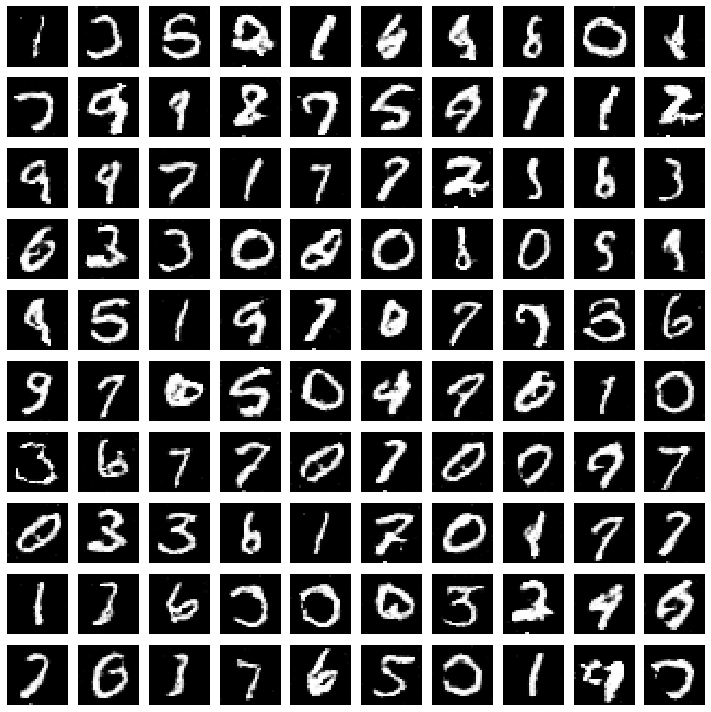

In [0]:
import matplotlib.pyplot as plt


for epoch in range(epochs):  
    for batch in range(steps_per_epoch): 
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
        fake_x = generator.predict(noise) # create G(z)

        real_x = x_train[np.random.randint(0, x_train.shape[0], size=batch_size)] # sample real image
        #remove below to return to FC scheme
        real_x = real_x.reshape(fake_x.shape)

        x = np.concatenate((real_x, fake_x))

        disc_y = np.zeros(2*batch_size)
        disc_y[:batch_size] = 0.9

        # train_on_batch recieves data and desired output
        d_loss_fake = discriminator.train_on_batch(x[:batch_size], disc_y[:batch_size])
        d_loss_real = discriminator.train_on_batch(x[batch_size:-1], disc_y[batch_size:-1])
        # train GAN (descriminator weights are fixed)
        y_gen = np.ones(batch_size)
        g_loss = gan.train_on_batch(noise, y_gen)
        # train reconstructor
        if(batch)
          r_loss = vae.train_on_batch(noise[:batch_size],noise[:batch_size])

        

    print(f'Epoch: {epoch} \t Discriminator Loss: {(d_loss_fake+d_loss_real)/2} \t\t Generator Loss: {g_loss} \t\t Reconstructor Loss: {r_loss} ')


def show_images(noise):
    generated_images = generator.predict(noise)
    plt.figure(figsize=(10, 10))
    
    for i, image in enumerate(generated_images):
        plt.subplot(10, 10, i+1)
        if channels == 1:
            plt.imshow(image.reshape((img_rows, img_cols)), cmap='gray')
        else:
            plt.imshow(image.reshape((img_rows, img_cols, channels)))
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()


noise = np.random.normal(0, 1, size=(100, noise_dim))
show_images(noise)





Train sparse dictionary: *RUN ONLY ONCE*

In [0]:
from sklearn.decomposition import DictionaryLearning
from numpy import loadtxt,savetxt
import matplotlib.pyplot as plt
from google.colab import files


# init a dictionary learning alg - based on LARS
# TODO - change to all data set and make redundant dictionary
d=DictionaryLearning(n_components=sparse_dim)
# train dictionary
d.fit(x_train)
dictionary = d.components_
savetxt('dictionary.csv', dictionary, delimiter=',')
# download to local machine
files.download('dictionary.csv') 

# we will download to a local file named dictionary_loaded
#*reconstruct* an image for sanity check
representation_vec = d.transform(x_train[1:2,:])
print(representation_vec.shape)
print(dictionary_loaded2.shape)
dictionary_loaded2 = np.transpose(dictionary_loaded2)
representation_vec = np.transpose(representation_vec)
ans = np.matmul(dictionary_loaded2,representation_vec)

plt.figure()
plt.imshow(ans.reshape((img_rows, img_cols)), cmap='gray')

plt.figure()
real_im = x_train[1:2,:]
plt.imshow(real_im.reshape((img_rows, img_cols)), cmap='gray')


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-3-f8731d9080ba>", line 11, in <module>
    d.fit(x_train)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/decomposition/_dict_learning.py", line 1238, in fit
    positive_code=self.positive_code)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/decomposition/_dict_learning.py", line 551, in dict_learning
    code, S, dictionary = linalg.svd(X, full_matrices=False)
  File "/usr/local/lib/python3.6/dist-packages/scipy/linalg/decomp_svd.py", line 129, in svd
    full_matrices=full_matrices, overwrite_a=overwrite_a)
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py", line 1823, in showtraceback
    stb = value._re

KeyboardInterrupt: ignored

reload trained dictionary from local machine - dictionary_loaded.csv

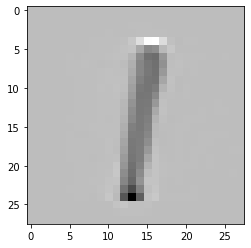

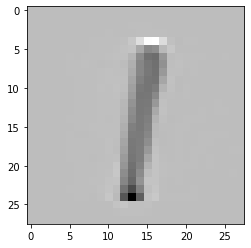

In [4]:
from numpy import loadtxt,savetxt
import matplotlib.pyplot as plt

dictionary_loaded2 = loadtxt('dictionary_loaded.csv', delimiter=',')
dictionary_loaded2 = np.array(dictionary_loaded2,dtype=np.float32) # format that is used in keras
# the above dict should enable training a regular gan

# sanity check
dictionary_loaded2 = np.transpose(dictionary_loaded2)
atom1 = (dictionary_loaded2)[:,0]
plt.figure()
plt.imshow(atom1.reshape((img_rows, img_cols)), cmap='gray')

first_atom = np.zeros(784)
first_atom[0] = 1
plt.figure()
ans = np.matmul(dictionary_loaded2,np.transpose(first_atom))
plt.imshow(ans.reshape((img_rows, img_cols)), cmap='gray')

In [0]:
L1_weight = 10   # Loss = data_fidelity + L1_weight * L1_norm
thr_value = 0.1

Trying to Create pursuit network for sanity check
Input : Image
Output: Image_r = D*Sparse

In [111]:
# with pursuit and thresholding approach
# generator:
from keras.utils import plot_model
from keras.models import Sequential
from keras import backend as K
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import Input
from keras.models import Model
from keras.initializers import RandomNormal, glorot_uniform
from keras.layers import Dense, Conv2D, Flatten, Reshape, Dropout, AveragePooling2D, MaxPooling2D, BatchNormalization, Lambda, ReLU, ThresholdedReLU, Activation
from tensorflow.linalg import matmul, matrix_transpose
from tensorflow.math import abs
from keras import regularizers


from keras.utils.generic_utils import get_custom_objects
import tensorflow as tf
from tensorflow import cast

# would cause small entries in absulute values to be set to zero and will create sparse vectors
def soft_threshlding(x):
  above_thr_pos = x * cast(x >= thr_value, tf.float32)
  below_thr_neg = x * cast(x <= -thr_value, tf.float32)
  return (above_thr_pos + below_thr_neg)

get_custom_objects().update({'soft_threshlding': Activation(soft_threshlding)})

def create_pursuiter():
    pursuiter = Sequential()
    init = RandomNormal(0,stddev=0.02)
    pursuiter.add(Dense(1024, kernel_initializer=init, input_dim=784,name="pursuiter_input"))
    pursuiter.add(BatchNormalization())
    pursuiter.add(LeakyReLU(0.2))

    pursuiter.add(Dense(1024,kernel_initializer=init,name="pursuiter_2nd"))
    pursuiter.add(BatchNormalization())
    pursuiter.add(LeakyReLU(0.2))

    pursuiter.add(Dense(sparse_dim, kernel_initializer=init,name="pursuiter_3rd"))
    pursuiter.add(BatchNormalization())
    # soft thresholding activation
    pursuiter.add(Activation(soft_threshlding, name='soft_threshlding'))

    #pursuiter.add(Lambda(lambda x: matrix_transpose(matmul(dictionary_loaded2,matrix_transpose(x))),name='mul_in_D'))

    #pursuiter.compile(loss='mean_squared_error', optimizer=optimizer)
    return pursuiter

pursuiter = create_pursuiter()
pursuiter.name = "pursuit_unit"
pursuiter_input = Input(shape=(784,))

sparse_vec = pursuiter(pursuiter_input) 

# a layer that creates the multiplication between the sparse tensor with dictionary to create image
fake_image_vec = Lambda(lambda x: matrix_transpose(matmul(dictionary_loaded2,matrix_transpose(x))),name='mul_in_D')(sparse_vec)


#pursuiter_full = Model(pursuiter_input, [fake_image_vec,sparse_vec])
#pursuiter_full.compile(loss=['mean_squared_error','mean_absolute_error'], optimizer=optimizer,loss_weights=[1,0])
pursuiter_full = Model(pursuiter_input, fake_image_vec)
pursuiter_full.compile(loss='mean_squared_error', optimizer=optimizer)
pursuiter_full.name = "pursuiter_full"

print(pursuiter_full.summary())
plot_model(pursuiter_full, to_file='model_plot.png', show_shapes=True, show_layer_names=True)
zeros = np.zeros(10000*784)
zeros=zeros.reshape(10000,784)
#model1=pursuiter_full.fit(x_train, [x_train,x_train], validation_data=(x_test, [x_test,zeros]), epochs=epochs, batch_size=16)
model1=pursuiter_full.fit(x_train, x_train, validation_data=(x_test, x_test), epochs=epochs, batch_size=16)



Model: "pursuiter_full"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        (None, 784)               0         
_________________________________________________________________
pursuit_unit (Sequential)    (None, 784)               2668368   
_________________________________________________________________
mul_in_D (Lambda)            (None, 784)               0         
Total params: 2,668,368
Trainable params: 2,662,704
Non-trainable params: 5,664
_________________________________________________________________
None
Train on 60000 samples, validate on 10000 samples
Epoch 1/5
60000/60000 [==============================] - 37s 615us/step - loss: 0.2189 - val_loss: 1918.8978
Epoch 2/5
60000/60000 [==============================] - 33s 556us/step - loss: 0.0769 - val_loss: 856.9396
Epoch 3/5
60000/60000 [==============================] - 33s 545us/step - loss: 0.0632 - val_los

{'val_loss': [1918.897816015625, 856.9395733398437, 913.1208510742188, 722.1433297851562, 751.7997614257813], 'loss': [0.21889417639772096, 0.07689234868685405, 0.06316584737002849, 0.056646824899315835, 0.05292201741139094]}


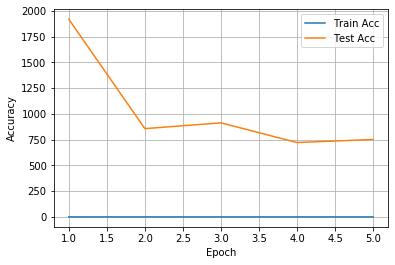

In [112]:
plt.figure()
print(model1.history)
plt.plot(range(1,len(model1.history['loss'])+1),model1.history['loss'], label='Train Acc')
plt.plot(range(1,len(model1.history['val_loss'])+1),model1.history['val_loss'], label='Test Acc')
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend()
plt.grid()
plt.show()

average support on train=  641.4687666666666
average support on test=  782.9436
Im_r, Im
sparse vector dim =  (1, 784)
sparse vector non zeros =  781
sparse vec max element is =  304.58716
positive number =  414
sparse vec average positive = 36.376102
negatives number =  367
sparse vec average negative = -36.284073


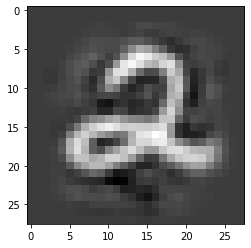

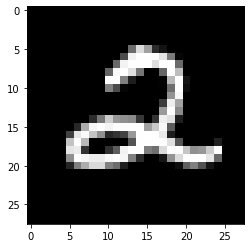

In [119]:
import random

x_train_pred = pursuiter.predict(x_train)
print("average support on train= ", np.count_nonzero(x_train_pred)/60000)

x_test_pred = pursuiter.predict(x_test)
print("average support on test= ", np.count_nonzero(x_test_pred)/10000)

im = random.randrange(0, 9999)
x_train.shape
x = np.array([x_test[im,:]])

# plt results
print("Im_r, Im")
plt.figure()
plt.imshow(pursuiter_full.predict(x)[0].reshape((img_rows, img_cols)), cmap='gray')

plt.figure()
plt.imshow(x[0].reshape((img_rows, img_cols)), cmap='gray')

# is it sparse?
pred = pursuiter.predict(x)
print("sparse vector dim = ", pred.shape)
print("sparse vector non zeros = ", np.count_nonzero(pred))
print("sparse vec max element is = ",np.max(pred))
print("positive number = ", np.count_nonzero(pred[pred>0]))
print("sparse vec average positive =",np.mean(pred[pred>0]))
print("negatives number = ", np.count_nonzero(pred[pred<0]))
print("sparse vec average negative =",np.mean(pred[pred<0]))


GAN + Reconstructor

Model: "Gen"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_60 (Dense)             (None, 256)               25856     
_________________________________________________________________
batch_normalization_81 (Batc (None, 256)               1024      
_________________________________________________________________
leaky_re_lu_73 (LeakyReLU)   (None, 256)               0         
_________________________________________________________________
dense_61 (Dense)             (None, 512)               131584    
_________________________________________________________________
batch_normalization_82 (Batc (None, 512)               2048      
_________________________________________________________________
leaky_re_lu_74 (LeakyReLU)   (None, 512)               0         
_________________________________________________________________
dense_62 (Dense)             (None, 1024)              525312  

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


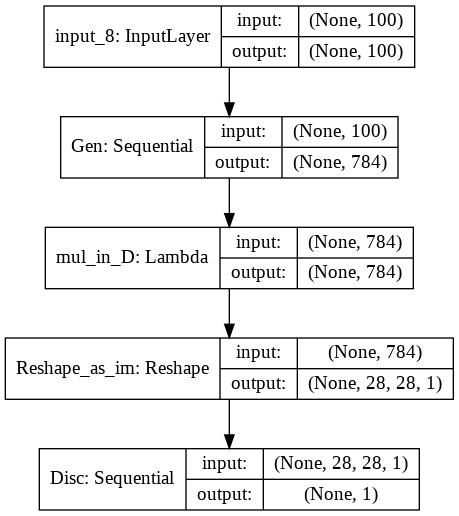

In [0]:
# with pursuit and thresholding approach
# generator:
from keras.utils import plot_model
from keras.models import Sequential
from keras import backend as K
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import Input
from keras.models import Model
from keras.initializers import RandomNormal, glorot_uniform
from keras.layers import Dense, Conv2D, Flatten, Reshape, Dropout, AveragePooling2D, MaxPooling2D, BatchNormalization, Lambda, ReLU, ThresholdedReLU, Activation
from tensorflow.linalg import matmul, matrix_transpose
from tensorflow.math import abs
from keras import regularizers


from keras.utils.generic_utils import get_custom_objects
import tensorflow as tf
from tensorflow import cast

# would cause small entries in absulute values to be set to zero and will create sparse vectors
def soft_threshlding(x):
  above_thr_pos = x * cast(x >= thr_value, tf.float32)
  below_thr_neg = x * cast(x <= -thr_value, tf.float32)
  return (above_thr_pos + below_thr_neg)

get_custom_objects().update({'soft_threshlding': Activation(soft_threshlding)})

# input: sparse vec size
# output: noise size
def create_reconstructor():
    reconstructor = Sequential()
    init = RandomNormal(0,stddev=0.02)

    reconstructor.add(Dense(512,  kernel_initializer=init, input_dim=sparse_dim))
    generator.add(BatchNormalization())
    reconstructor.add(LeakyReLU(0.2))

    reconstructor.add(Dense(256, kernel_initializer=init))
    generator.add(BatchNormalization())
    reconstructor.add(LeakyReLU(0.2))

    reconstructor.add(Dense(noise_dim, kernel_initializer=init))
    generator.add(BatchNormalization())
    reconstructor.add(LeakyReLU(0.2))

    #reconstructor.compile(loss='mean_squared_error', optimizer='sgd')
    return reconstructor

# input: noise size
# output: sparse vec size
def create_generator():
    generator = Sequential()
    init = RandomNormal(0,stddev=0.02)
    generator.add(Dense(256, kernel_initializer=init, input_dim=noise_dim))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(512,kernel_initializer=init))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(1024,kernel_initializer=init))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(sparse_dim, kernel_initializer=init))
    generator.add(BatchNormalization())
    # soft thresholding activation
    generator.add(Activation(soft_threshlding, name='soft_threshlding'))
    return generator

# input: image size
# output: 1 number - 1 real 0 fake
# descriminator:
def create_descriminator():
    discriminator = Sequential()
    #16 - better
    discriminator.add(Conv2D(16, (3, 3), strides=(2,2),padding='same', kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02), input_shape=(img_cols, img_rows, channels)))
    discriminator.add(BatchNormalization())
    discriminator.add(LeakyReLU(0.2))
    #32 - better
    discriminator.add(Conv2D(32, (3, 3), strides=(2,2), padding='same',  kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02)))
    discriminator.add(BatchNormalization())
    discriminator.add(LeakyReLU(0.2))
    # 64 - better
    discriminator.add(Conv2D(64, (3, 3), strides=(2,2), padding='same',  kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02)))
    discriminator.add(BatchNormalization())
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Flatten())
    discriminator.add(Dropout(0.4))
    discriminator.add(Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02)))   # 1 number which indicates real / fake
    
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator

# build GAN
discriminator = create_descriminator()
generator = create_generator()
reconstructor = create_reconstructor()
# naming:
discriminator.name = "Disc"
generator.name = "Gen"
reconstructor.name = "Rec"
#
discriminator.trainable = False   # will be trained separately, not as GAN

gan_input = Input(shape=(noise_dim,))

# G(z) is a sparse vector
sparse_vec = generator(gan_input)   # sparse_dim size - it is thresholded

# a layer that creates the multiplication between the sparse tensor with dictionary to create image
fake_image_vec = Lambda(lambda x: matrix_transpose(matmul(dictionary_loaded2,matrix_transpose(x))),name='mul_in_D')(sparse_vec)
# reshape to image size - will be inserted to discriminator
fake_image = Reshape((img_rows, img_cols, channels),name="Reshape_as_im")(fake_image_vec)

gan_output = discriminator(fake_image)  # the descriminator output
vae_output = reconstructor(sparse_vec)  # the reconstructor output

vae = Model(gan_input, vae_output)
vae.compile(loss='mean_squared_error', optimizer='sgd')

# todo - double output double loss
gan = Model(gan_input, [gan_output,sparse_vec])
gan.compile(loss=['binary_crossentropy','mean_absolute_error'], optimizer=optimizer,loss_weights=[1,L1_weight])

print(generator.summary())
print(discriminator.summary())
plot_model(gan, to_file='model_plot.png', show_shapes=True, show_layer_names=True)


2nd approach train

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


results after iter  0  loss =  [8.489094, 0.5788363, 0.78106534]  support =  784.0


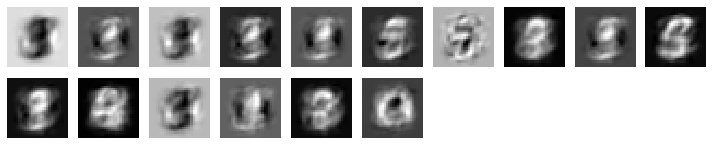

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


results after iter  100  loss =  [9.726677, 4.7453337, 0.493849]  support =  784.0


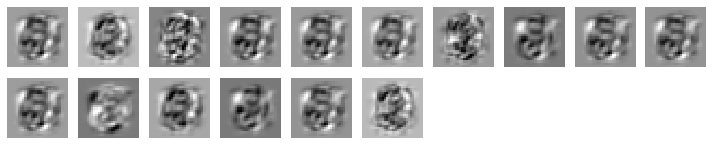

results after iter  200  loss =  [9.7291355, 4.679172, 0.50195366]  support =  784.0


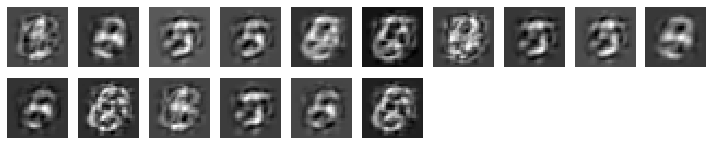

results after iter  300  loss =  [11.208886, 6.7990546, 0.43920833]  support =  784.0


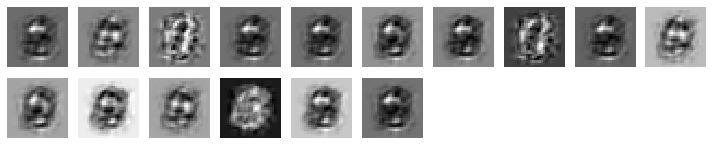

results after iter  400  loss =  [9.875942, 6.194662, 0.36654255]  support =  784.0


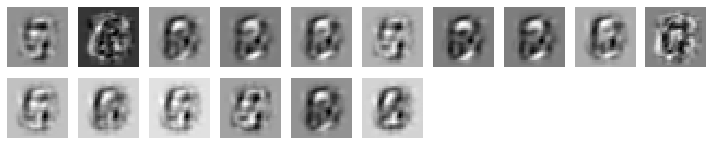

results after iter  500  loss =  [11.692408, 7.0513086, 0.4630897]  support =  784.0


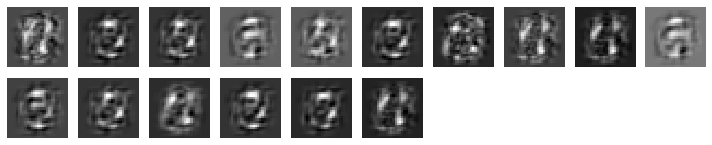

results after iter  600  loss =  [5.158947, 2.1113882, 0.30310798]  support =  784.0


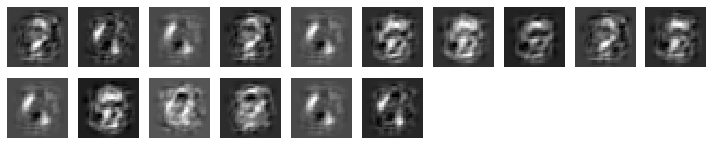

results after iter  700  loss =  [6.7546, 2.6249466, 0.411039]  support =  784.0


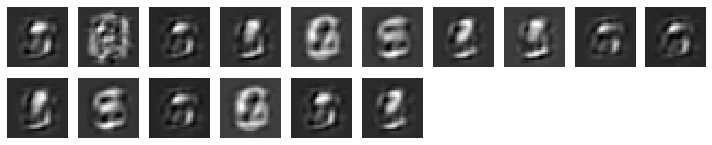

results after iter  800  loss =  [11.812301, 7.901627, 0.3897125]  support =  784.0


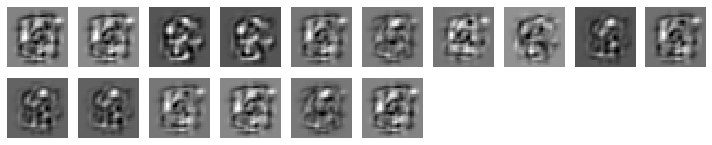

results after iter  900  loss =  [10.104096, 6.5226555, 0.35719955]  support =  784.0


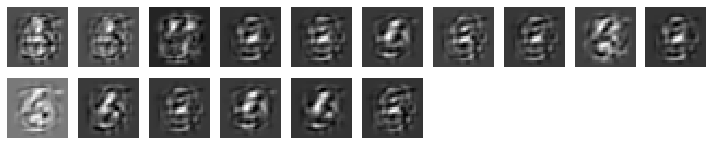

results after iter  1000  loss =  [7.027706, 3.986627, 0.30231822]  support =  784.0


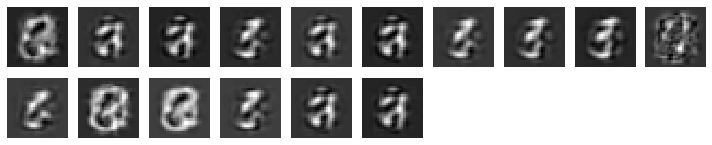

results after iter  1100  loss =  [4.8291893, 1.4356514, 0.33697355]  support =  784.0


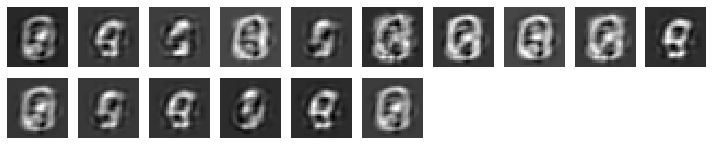

results after iter  1200  loss =  [7.491626, 4.5518937, 0.2919407]  support =  784.0


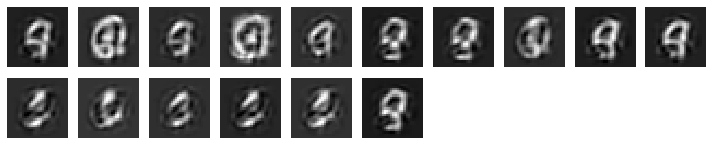

results after iter  1300  loss =  [7.318259, 3.8867373, 0.3411591]  support =  784.0


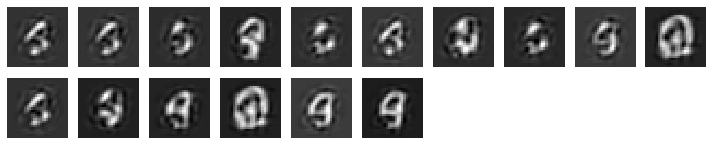

results after iter  1400  loss =  [9.840699, 6.9972835, 0.28256232]  support =  784.0


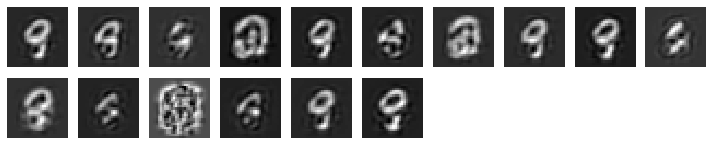

results after iter  1500  loss =  [6.147983, 3.3130605, 0.28140956]  support =  784.0


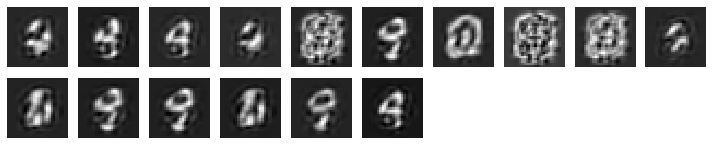

results after iter  1600  loss =  [8.660502, 5.734312, 0.2907101]  support =  784.0


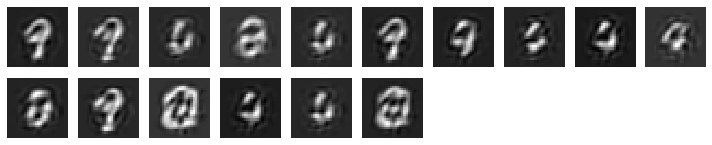

results after iter  1700  loss =  [10.211201, 6.671165, 0.3522255]  support =  784.0


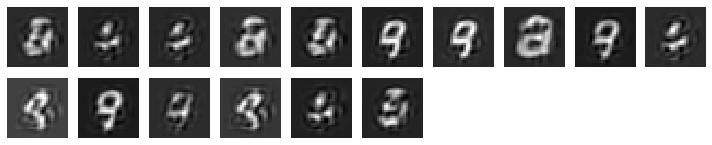

results after iter  1800  loss =  [7.7799997, 4.89836, 0.28606388]  support =  784.0


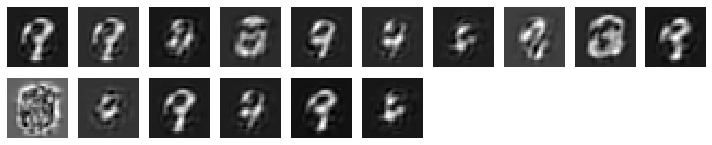

results after iter  1900  loss =  [8.684252, 5.768464, 0.28992802]  support =  784.0


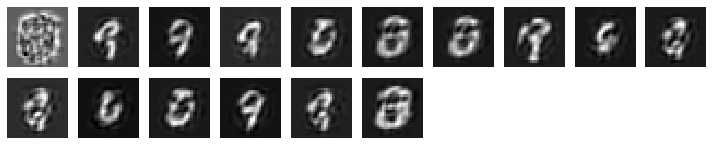

results after iter  2000  loss =  [7.5685663, 4.6174564, 0.29318956]  support =  784.0


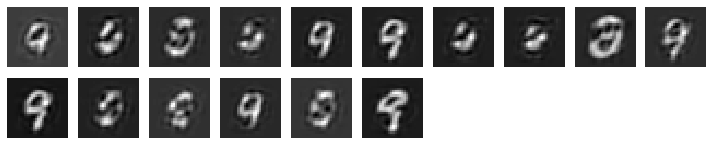

results after iter  2100  loss =  [11.327046, 7.6792555, 0.36304784]  support =  784.0


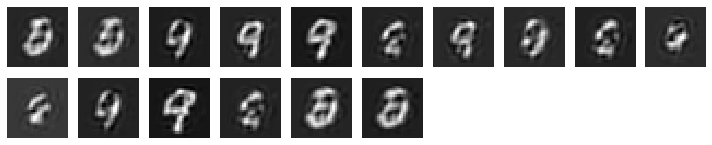

results after iter  2200  loss =  [6.7655416, 3.9939923, 0.2752483]  support =  784.0


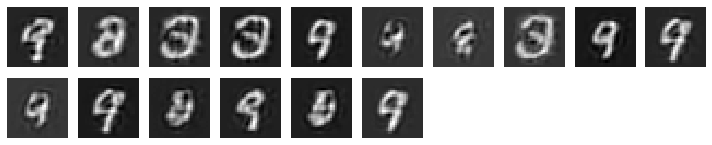

results after iter  2300  loss =  [7.8773613, 5.1446004, 0.2714035]  support =  784.0


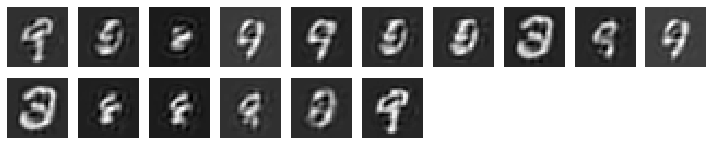

results after iter  2400  loss =  [6.0537057, 3.1040263, 0.29309905]  support =  784.0


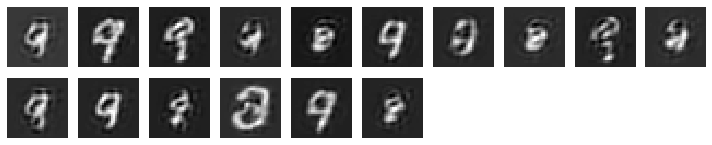

results after iter  2500  loss =  [7.1142335, 4.425898, 0.26654923]  support =  784.0


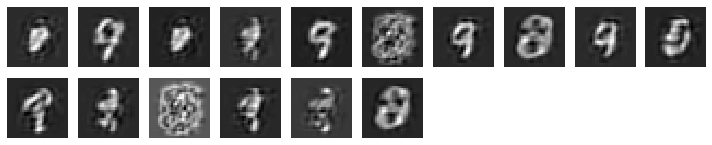

results after iter  2600  loss =  [6.509619, 3.8197165, 0.26666278]  support =  784.0


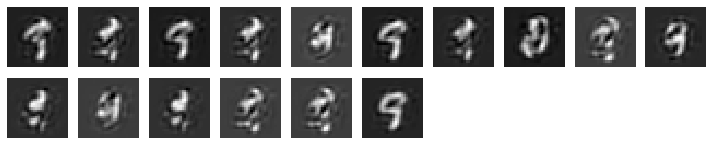

results after iter  2700  loss =  [7.484124, 4.705967, 0.27563277]  support =  784.0


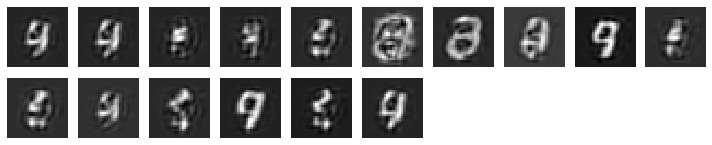

results after iter  2800  loss =  [10.56537, 6.0021243, 0.45413974]  support =  784.0


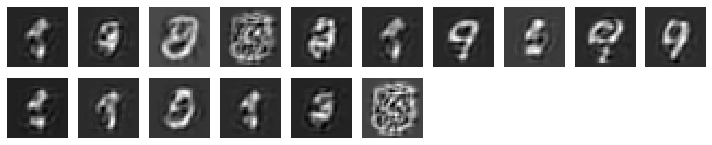

results after iter  2900  loss =  [6.8394628, 4.0988674, 0.271811]  support =  784.0


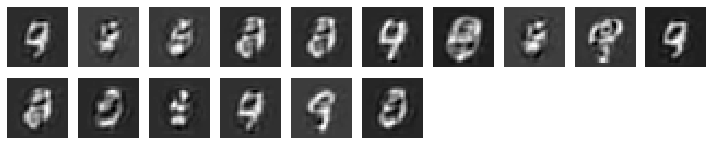

results after iter  3000  loss =  [8.01518, 5.220975, 0.2770094]  support =  784.0


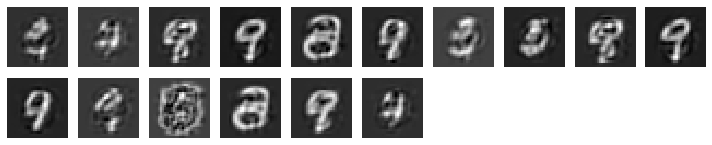

results after iter  3100  loss =  [8.0498, 5.3766136, 0.26547813]  support =  784.0


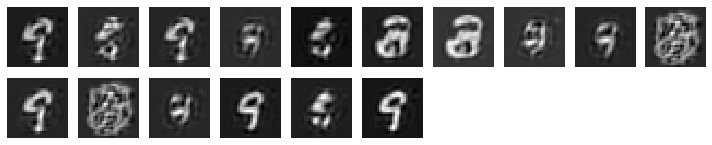

results after iter  3200  loss =  [7.901972, 5.2698317, 0.26151142]  support =  784.0


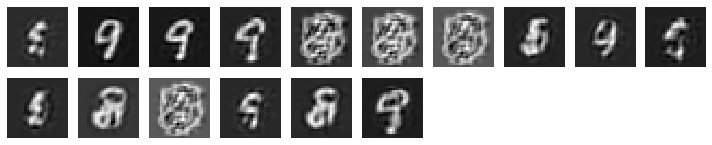

results after iter  3300  loss =  [5.3433332, 2.6770105, 0.2647006]  support =  784.0


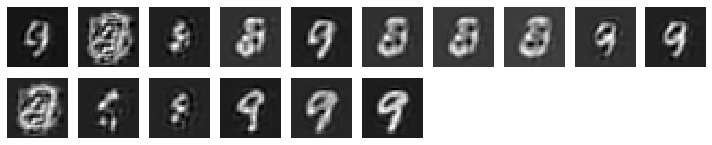

results after iter  3400  loss =  [8.549537, 5.962965, 0.2567175]  support =  784.0


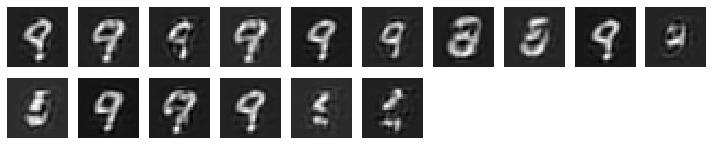

results after iter  3500  loss =  [5.428734, 2.7662537, 0.2641362]  support =  784.0


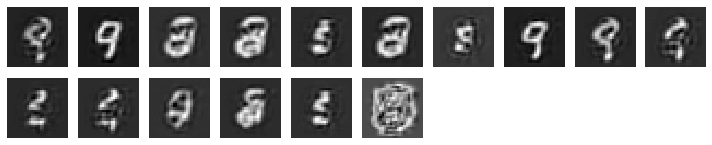

results after iter  3600  loss =  [8.302271, 5.6810684, 0.26045287]  support =  784.0


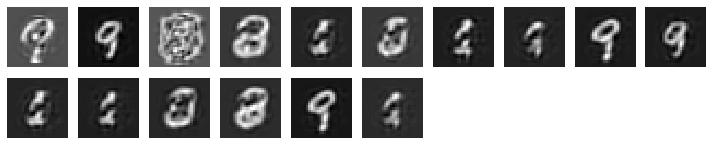

results after iter  3700  loss =  [7.5117416, 4.8610554, 0.2629236]  support =  784.0


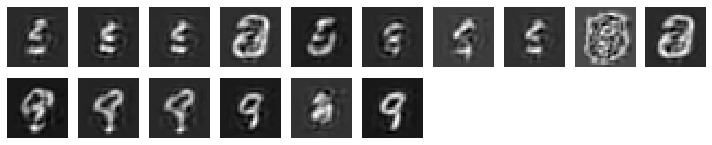

Epoch: 0 	 Discriminator Loss_fake: 0.36471694707870483 	 Discriminator Loss_real: 0.029686328023672104		 Generator Loss: [6.9509583, 4.4027295, 0.25256187] 		 Reconstructor Loss:0.9614822864532471	 support: 0


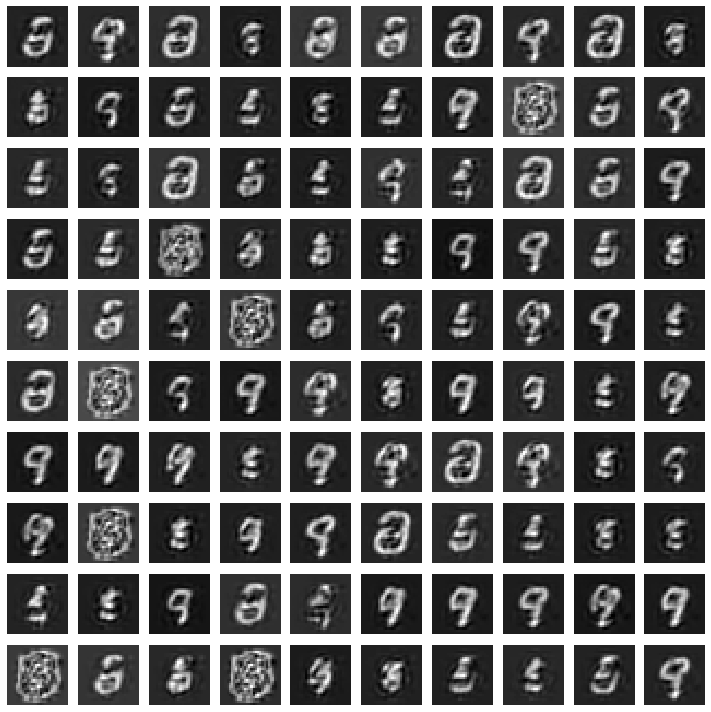

results after iter  3800  loss =  [7.8249288, 5.0539, 0.27515876]  support =  784.0


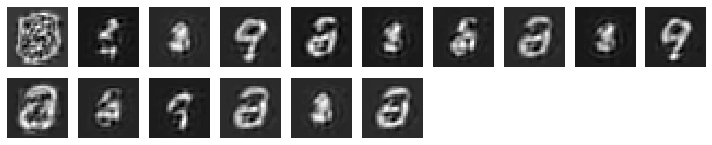

results after iter  3900  loss =  [8.214314, 5.5826097, 0.2617739]  support =  784.0


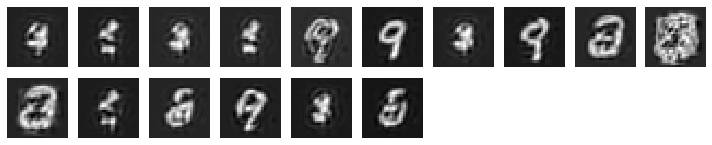

results after iter  4000  loss =  [6.067714, 3.4182749, 0.2626955]  support =  784.0


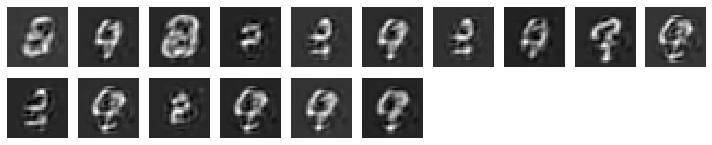

results after iter  4100  loss =  [7.8786683, 5.013729, 0.28447676]  support =  784.0


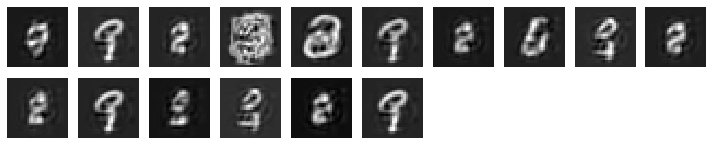

results after iter  4200  loss =  [8.969476, 6.342642, 0.26120964]  support =  784.0


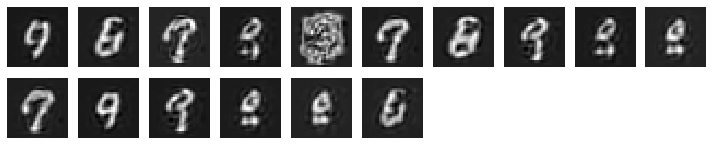

results after iter  4300  loss =  [8.840737, 6.087373, 0.27365994]  support =  784.0


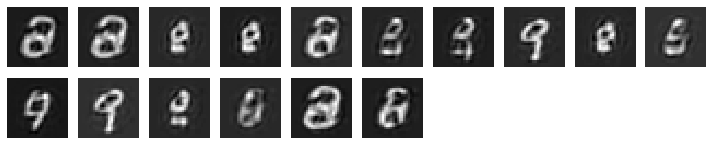

results after iter  4400  loss =  [5.3840575, 2.7717366, 0.2591936]  support =  784.0


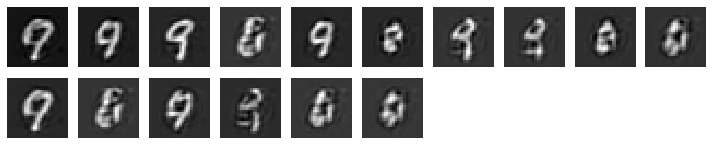

results after iter  4500  loss =  [6.9390564, 4.2615776, 0.2660348]  support =  784.0


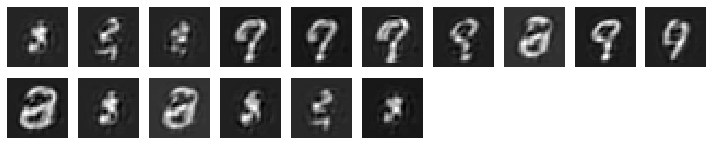

results after iter  4600  loss =  [6.731618, 4.134294, 0.25790533]  support =  784.0


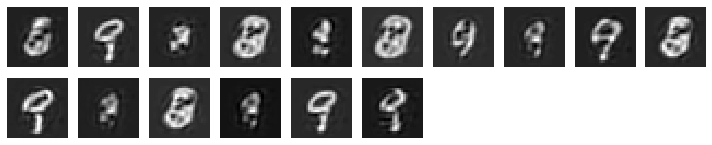

results after iter  4700  loss =  [6.3406267, 3.7437541, 0.25760674]  support =  784.0


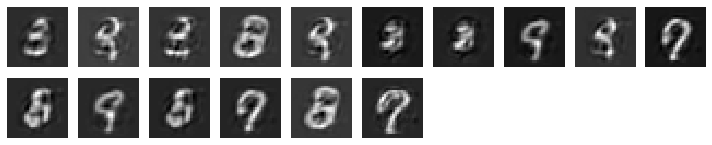

results after iter  4800  loss =  [6.988432, 4.4223413, 0.25498793]  support =  784.0


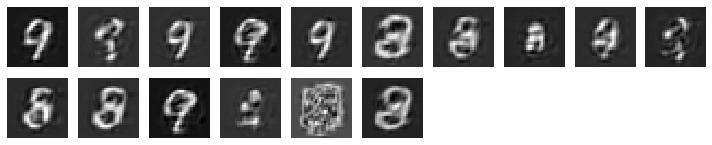

results after iter  4900  loss =  [7.0721936, 4.2858467, 0.27679804]  support =  784.0


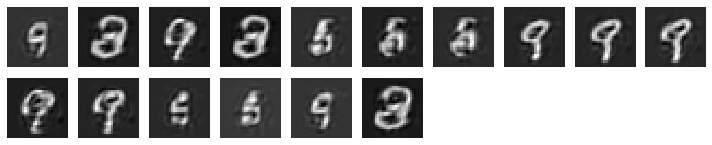

results after iter  5000  loss =  [6.1258173, 3.420279, 0.26860878]  support =  784.0


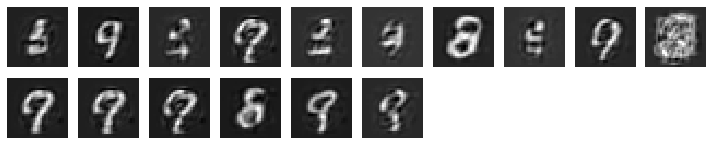

results after iter  5100  loss =  [6.8570094, 4.1990304, 0.26438498]  support =  784.0


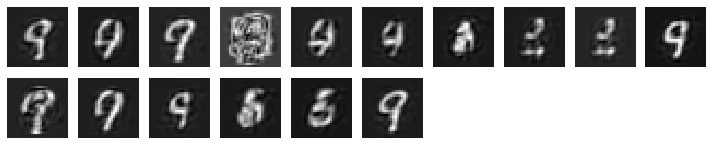

results after iter  5200  loss =  [9.584986, 6.55194, 0.30134386]  support =  784.0


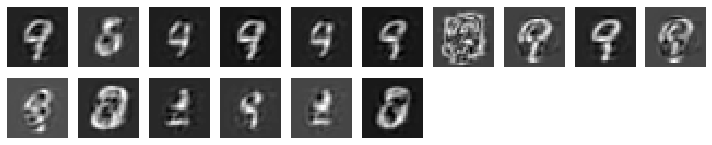

results after iter  5300  loss =  [7.2169886, 4.4015174, 0.27947596]  support =  784.0


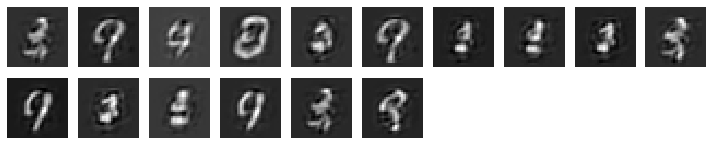

results after iter  5400  loss =  [5.7770276, 3.0218027, 0.27353072]  support =  784.0


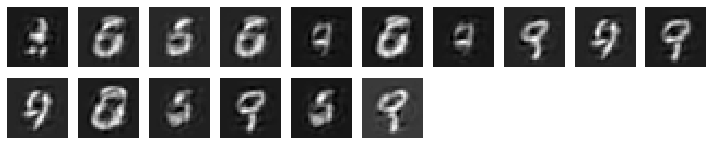

results after iter  5500  loss =  [6.982378, 4.2471323, 0.27161196]  support =  784.0


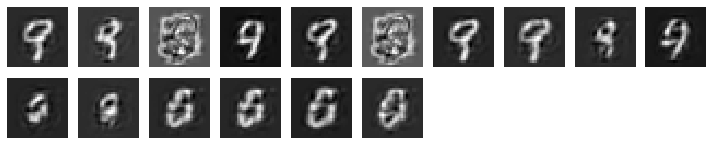

results after iter  5600  loss =  [7.698253, 4.787614, 0.28924522]  support =  784.0


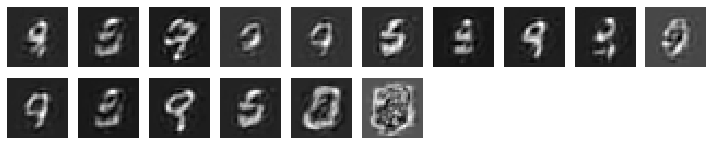

results after iter  5700  loss =  [6.8108487, 4.0173645, 0.27739692]  support =  784.0


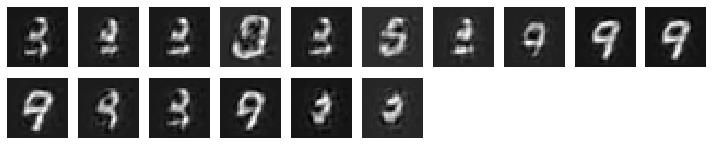

results after iter  5800  loss =  [8.086969, 5.309881, 0.2761241]  support =  784.0


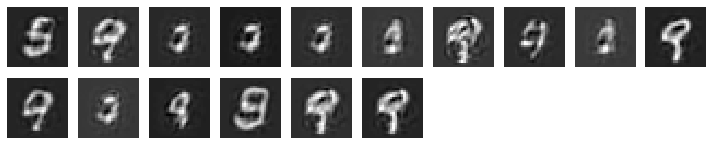

results after iter  5900  loss =  [6.7768073, 3.9516811, 0.28051054]  support =  784.0


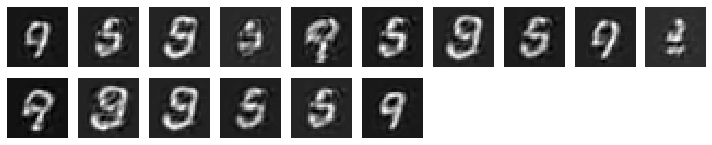

results after iter  6000  loss =  [5.7004595, 2.9098241, 0.27765977]  support =  784.0


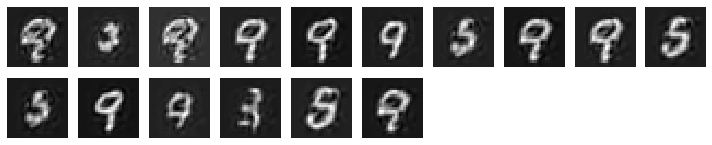

results after iter  6100  loss =  [6.123133, 3.3753881, 0.2730405]  support =  784.0


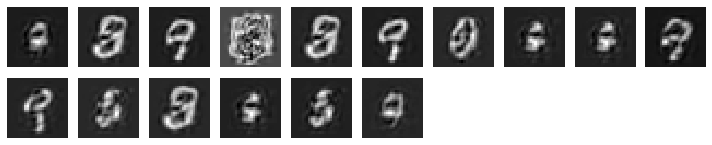

results after iter  6200  loss =  [6.4876437, 3.7158604, 0.27525336]  support =  784.0


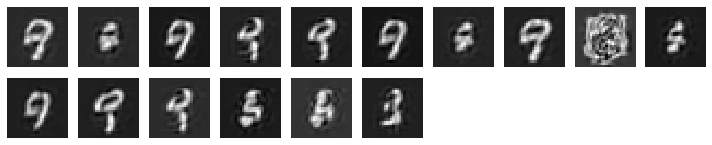

results after iter  6300  loss =  [5.4153795, 2.710984, 0.26875657]  support =  784.0


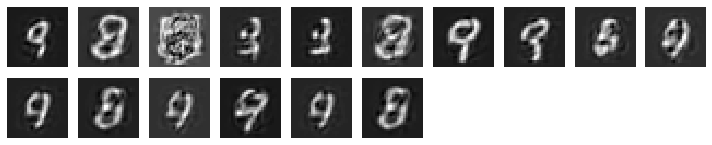

results after iter  6400  loss =  [7.1221733, 4.434188, 0.26721203]  support =  784.0


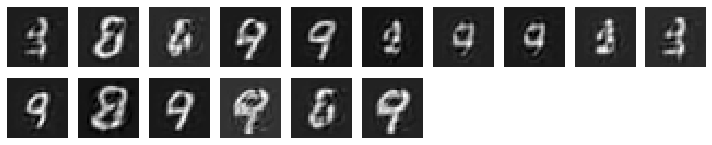

results after iter  6500  loss =  [5.8161335, 3.0665312, 0.2730397]  support =  784.0


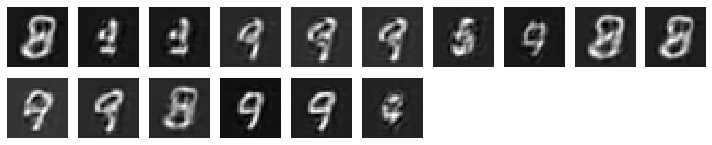

results after iter  6600  loss =  [7.278947, 4.641946, 0.26230064]  support =  784.0


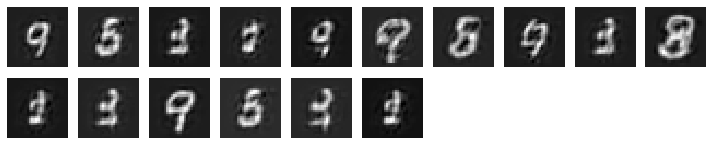

results after iter  6700  loss =  [8.982939, 6.3083715, 0.2661103]  support =  784.0


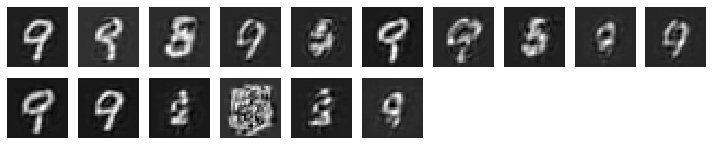

results after iter  6800  loss =  [5.795009, 3.1186452, 0.26546213]  support =  784.0


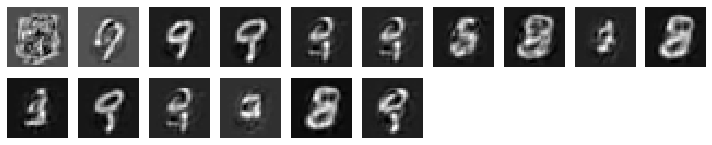

results after iter  6900  loss =  [7.055738, 4.0710683, 0.29622337]  support =  784.0


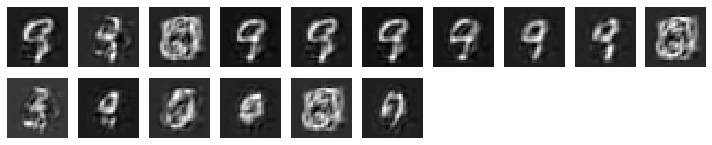

results after iter  7000  loss =  [8.109204, 4.997447, 0.30954415]  support =  784.0


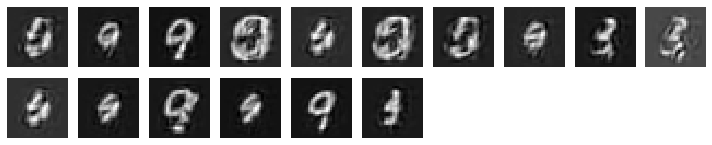

results after iter  7100  loss =  [6.128542, 3.2356963, 0.28722498]  support =  784.0


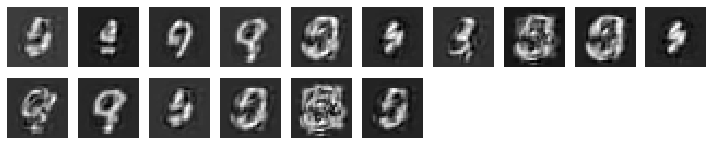

results after iter  7200  loss =  [6.9292016, 4.054124, 0.28565994]  support =  784.0


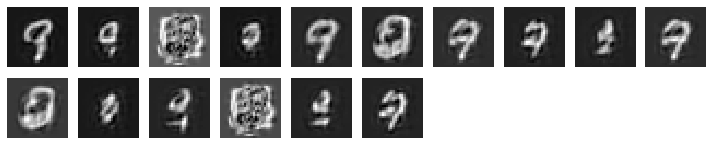

results after iter  7300  loss =  [7.465668, 4.653593, 0.27911586]  support =  784.0


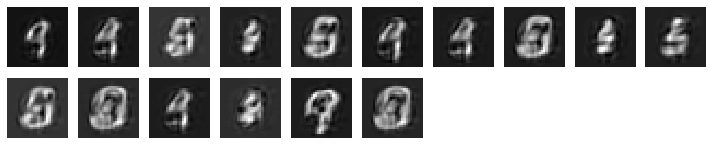

results after iter  7400  loss =  [8.253063, 5.407963, 0.2827605]  support =  784.0


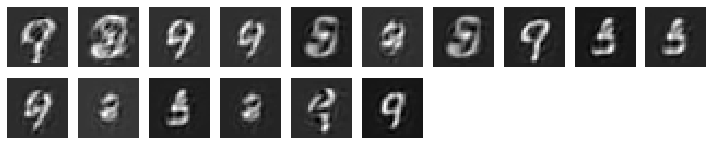

Epoch: 1 	 Discriminator Loss_fake: 0.3464587330818176 	 Discriminator Loss_real: 0.019443392753601074		 Generator Loss: [9.115756, 6.2398777, 0.2858648] 		 Reconstructor Loss:0.9951997995376587	 support: 0


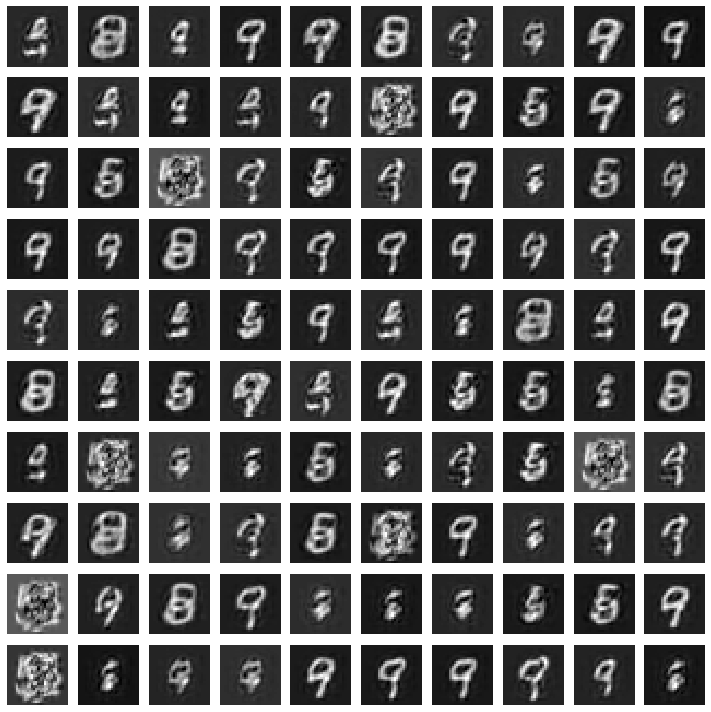

results after iter  7500  loss =  [7.4658937, 4.554513, 0.28942186]  support =  784.0


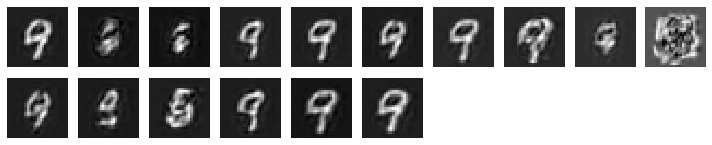

results after iter  7600  loss =  [7.584652, 4.6850333, 0.28817523]  support =  784.0


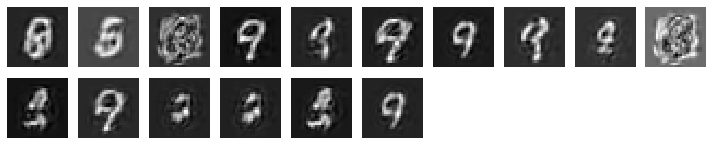

results after iter  7700  loss =  [8.703486, 5.7143855, 0.29731572]  support =  784.0


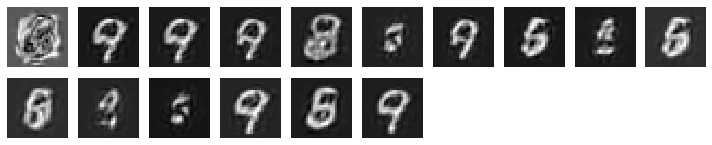

results after iter  7800  loss =  [8.374153, 5.576049, 0.27817515]  support =  784.0


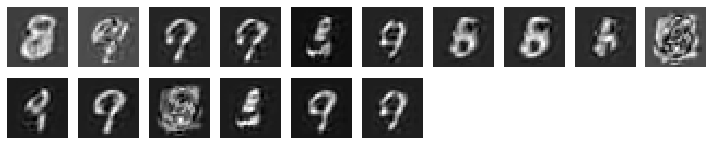

results after iter  7900  loss =  [5.681407, 2.967597, 0.2696901]  support =  784.0


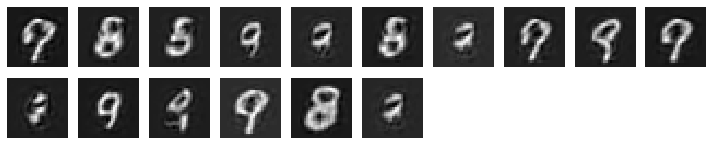

results after iter  8000  loss =  [7.2442493, 4.3661075, 0.2857051]  support =  784.0


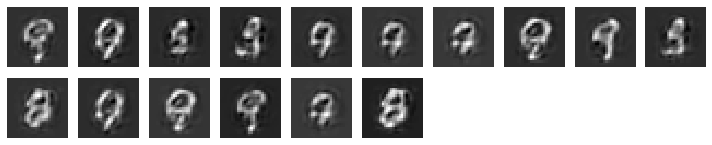

results after iter  8100  loss =  [6.8036165, 3.8972993, 0.28844815]  support =  784.0


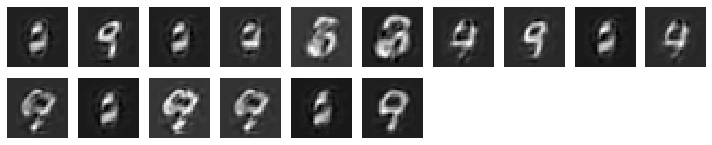

results after iter  8200  loss =  [6.7353377, 3.9232333, 0.27936554]  support =  784.0


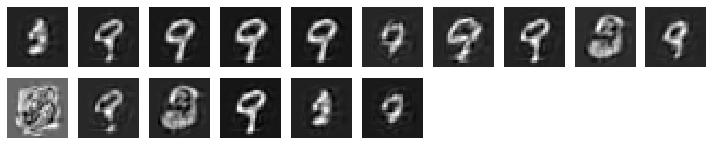

results after iter  8300  loss =  [6.114796, 3.0939858, 0.30009758]  support =  784.0


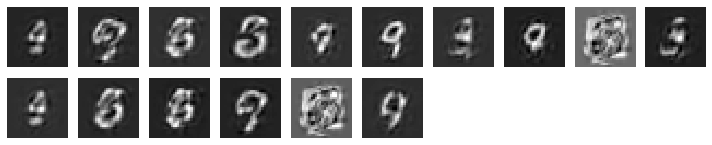

results after iter  8400  loss =  [6.4510508, 3.6959784, 0.27357492]  support =  784.0


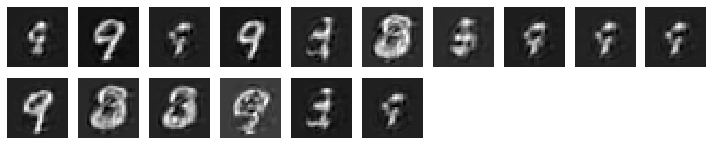

results after iter  8500  loss =  [6.8999877, 4.0745854, 0.28110483]  support =  784.0


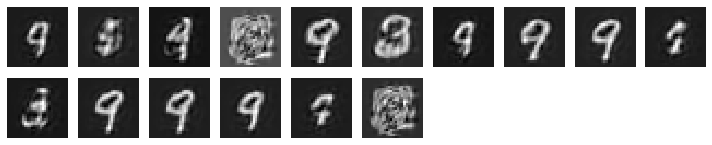

results after iter  8600  loss =  [9.265378, 6.4368744, 0.2812943]  support =  784.0


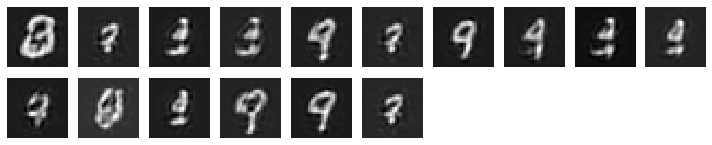

results after iter  8700  loss =  [6.405632, 3.6581776, 0.27350792]  support =  784.0


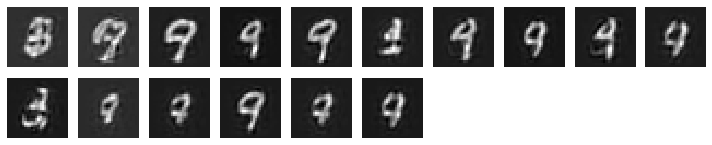

results after iter  8800  loss =  [7.4848, 4.6920896, 0.2775523]  support =  784.0


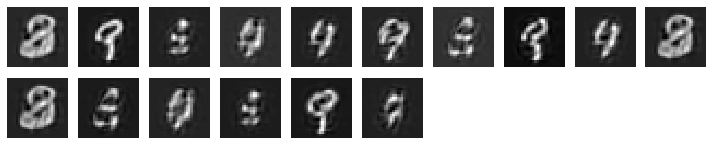

results after iter  8900  loss =  [7.236004, 4.457759, 0.27623802]  support =  784.0


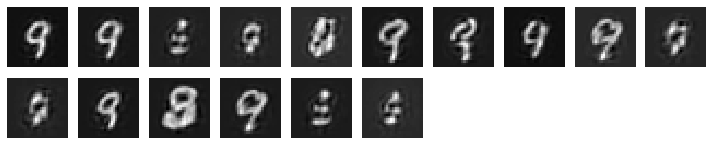

results after iter  9000  loss =  [9.075142, 5.9616737, 0.30988294]  support =  784.0


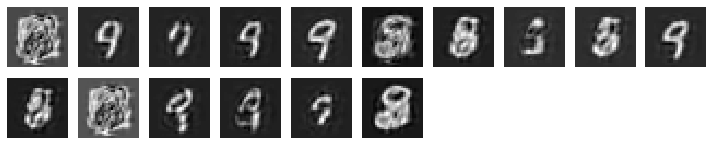

results after iter  9100  loss =  [7.4249725, 4.566241, 0.2842424]  support =  784.0


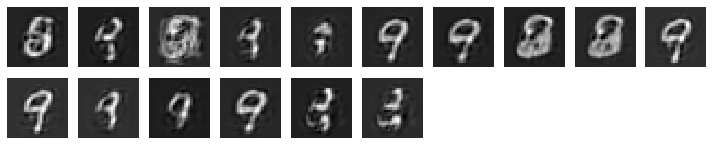

results after iter  9200  loss =  [7.542919, 4.710606, 0.28147215]  support =  784.0


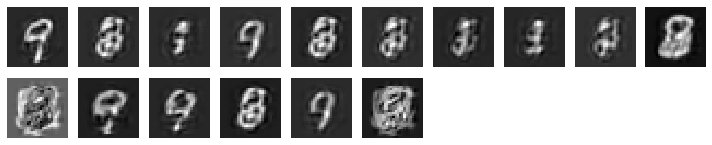

results after iter  9300  loss =  [8.2874, 5.365877, 0.2909443]  support =  784.0


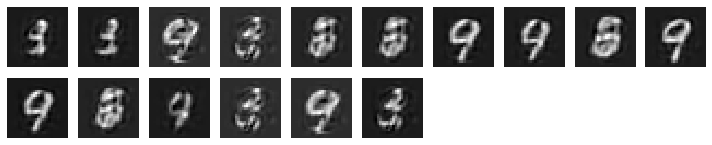

results after iter  9400  loss =  [8.555311, 5.5482407, 0.2986612]  support =  784.0


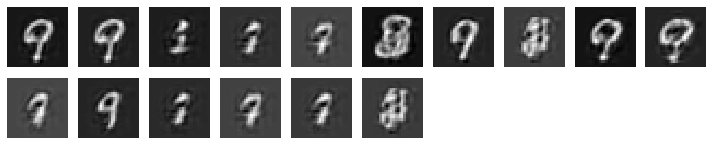

results after iter  9500  loss =  [7.6938605, 4.983703, 0.2696423]  support =  784.0


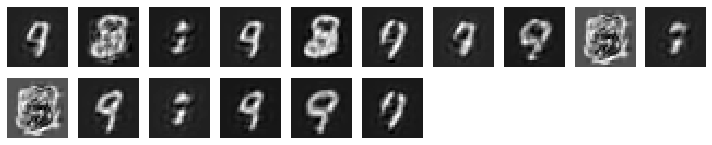

results after iter  9600  loss =  [6.7930064, 4.0971437, 0.26773876]  support =  784.0


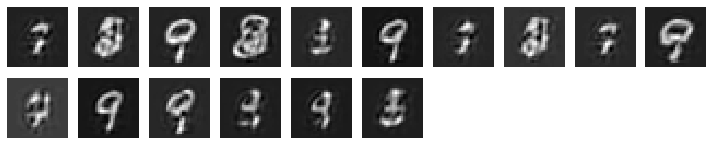

results after iter  9700  loss =  [7.1800256, 4.4810934, 0.26855326]  support =  784.0


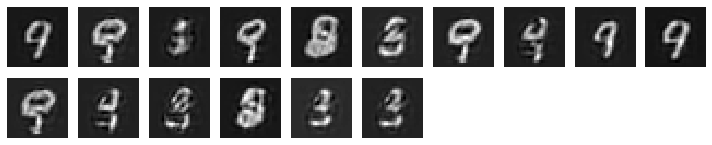

results after iter  9800  loss =  [7.3457327, 4.5470104, 0.2776928]  support =  784.0


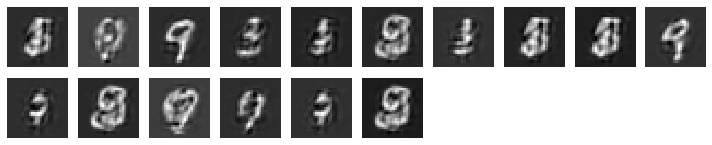

results after iter  9900  loss =  [7.5467873, 4.778466, 0.2750082]  support =  784.0


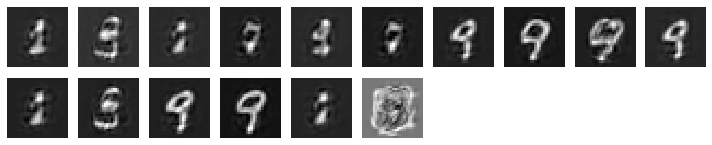

results after iter  10000  loss =  [6.4478188, 3.6500793, 0.27759022]  support =  784.0


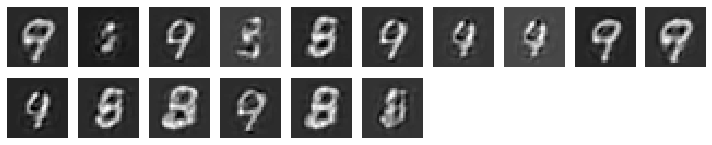

results after iter  10100  loss =  [6.9872565, 4.0675335, 0.2900074]  support =  784.0


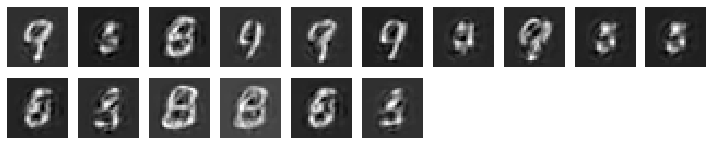

results after iter  10200  loss =  [6.546184, 3.681228, 0.2844139]  support =  784.0


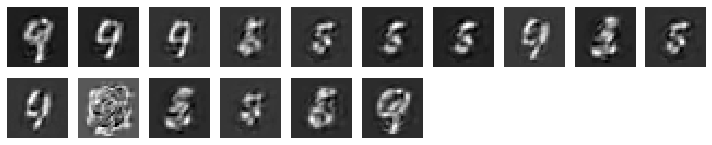

results after iter  10300  loss =  [8.6594515, 5.73253, 0.29117906]  support =  784.0


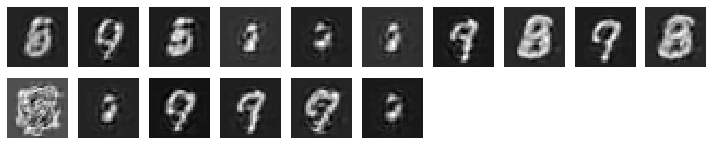

results after iter  10400  loss =  [5.9089613, 3.1212275, 0.2766228]  support =  784.0


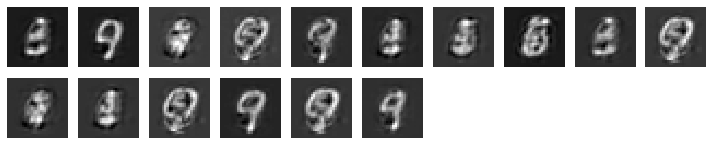

results after iter  10500  loss =  [7.7870846, 4.5543127, 0.32119]  support =  784.0


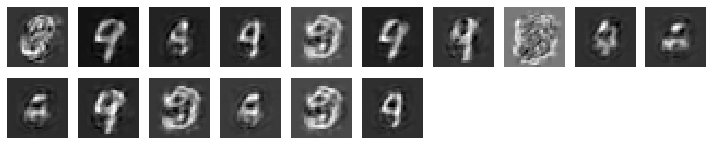

results after iter  10600  loss =  [9.169226, 6.045753, 0.3107841]  support =  784.0


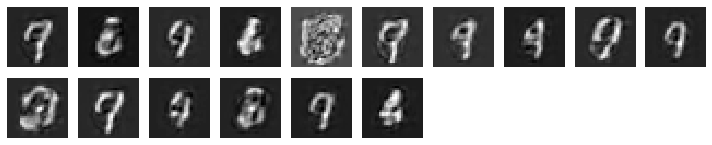

results after iter  10700  loss =  [8.804808, 5.610391, 0.3174079]  support =  784.0


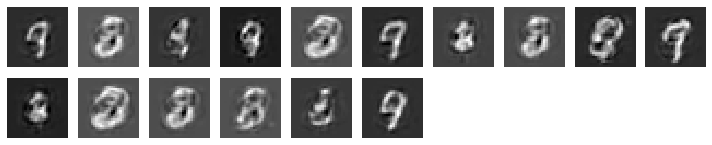

results after iter  10800  loss =  [7.948735, 4.8017282, 0.31276083]  support =  784.0


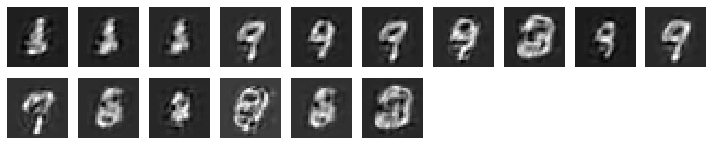

results after iter  10900  loss =  [6.0512004, 3.094178, 0.2935542]  support =  784.0


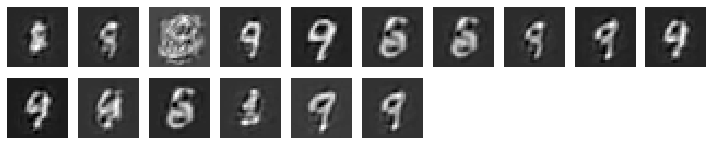

results after iter  11000  loss =  [8.319458, 5.0692196, 0.3230936]  support =  784.0


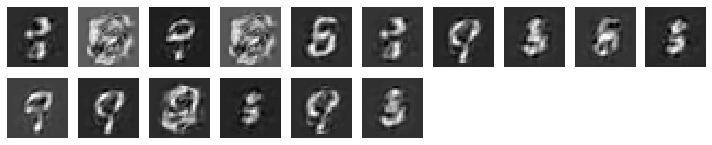

results after iter  11100  loss =  [8.896845, 5.8668346, 0.30126163]  support =  784.0


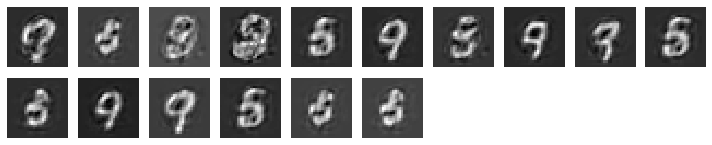

results after iter  11200  loss =  [8.254991, 5.0980625, 0.31395406]  support =  784.0


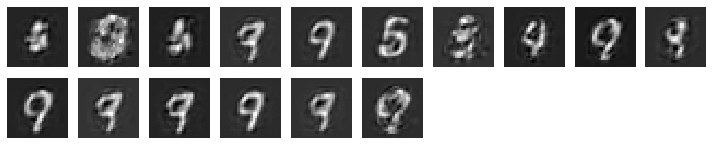

Epoch: 2 	 Discriminator Loss_fake: 0.34471574425697327 	 Discriminator Loss_real: 0.01599443145096302		 Generator Loss: [9.059029, 6.0221405, 0.30226114] 		 Reconstructor Loss:0.9401992559432983	 support: 0


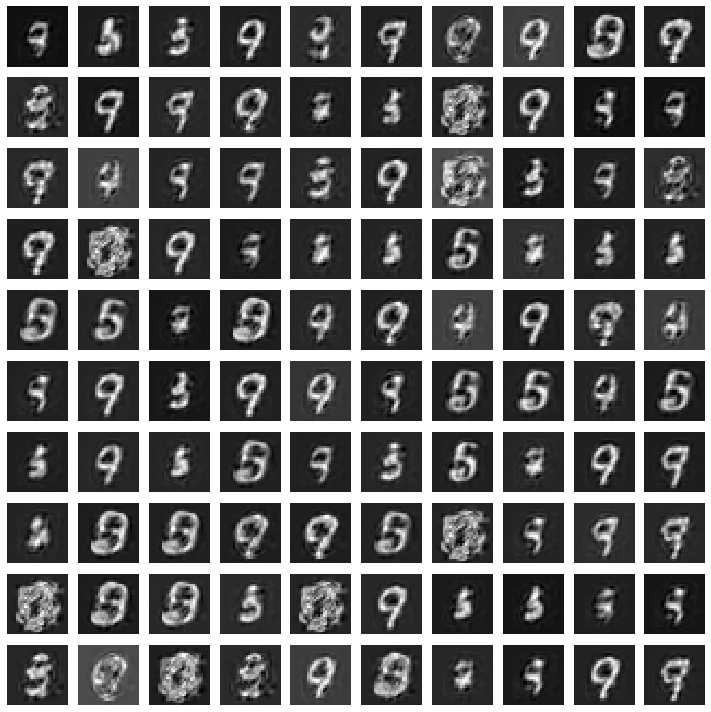

results after iter  11300  loss =  [5.6377583, 2.62457, 0.2992617]  support =  784.0


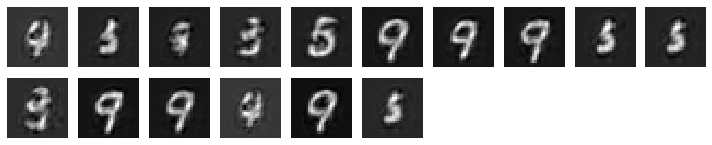

results after iter  11400  loss =  [8.11516, 4.7448063, 0.33532488]  support =  784.0


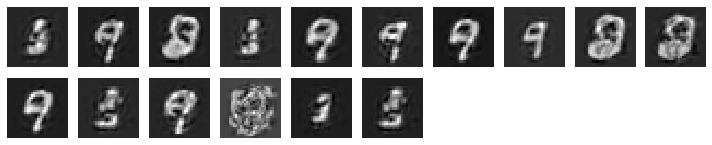

results after iter  11500  loss =  [7.952303, 4.873786, 0.30665088]  support =  784.0


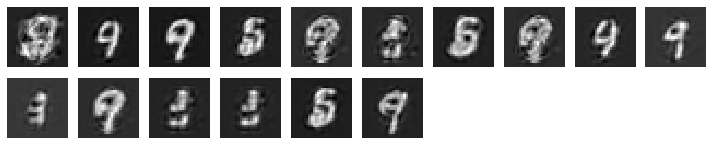

results after iter  11600  loss =  [6.169265, 2.906653, 0.32424623]  support =  784.0


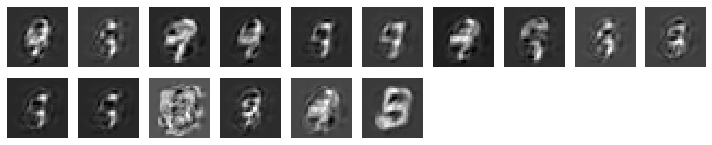

results after iter  11700  loss =  [6.6019073, 3.5032659, 0.30775473]  support =  784.0


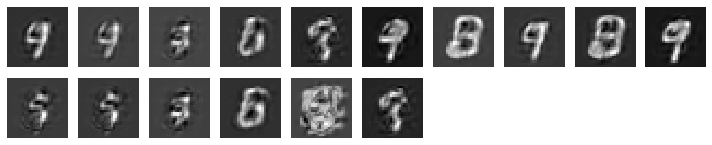

results after iter  11800  loss =  [9.483493, 6.3244753, 0.31418538]  support =  784.0


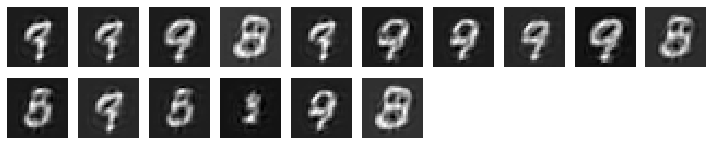

results after iter  11900  loss =  [8.659776, 5.6929655, 0.29493943]  support =  784.0


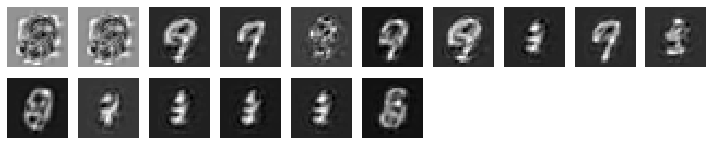

results after iter  12000  loss =  [9.395742, 5.899333, 0.34844297]  support =  784.0


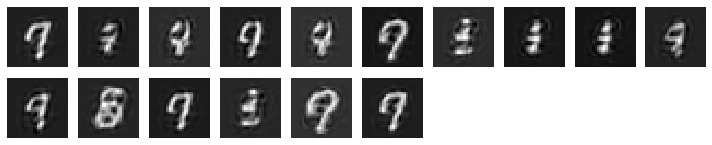

results after iter  12100  loss =  [6.535476, 3.0635319, 0.34480542]  support =  784.0


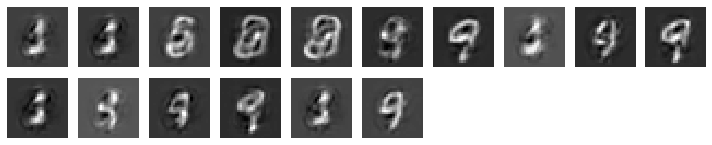

results after iter  12200  loss =  [8.117215, 4.7305603, 0.33672833]  support =  784.0


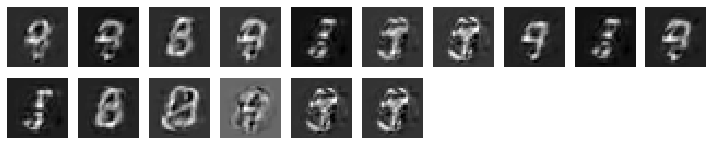

results after iter  12300  loss =  [8.523141, 5.284732, 0.3220548]  support =  784.0


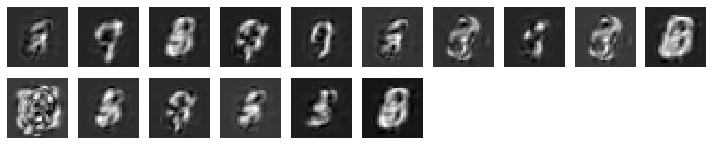

results after iter  12400  loss =  [7.783866, 4.7355967, 0.30299133]  support =  784.0


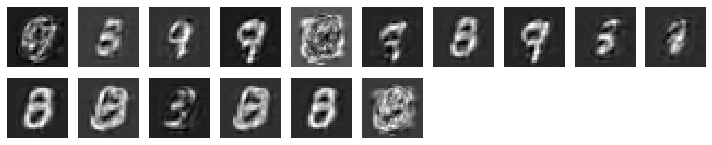

results after iter  12500  loss =  [7.2910547, 4.1968813, 0.30750695]  support =  784.0


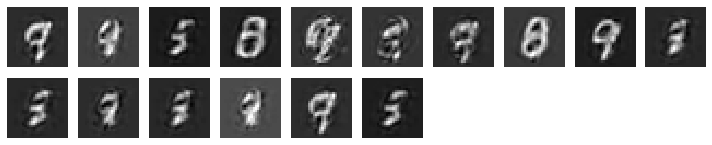

results after iter  12600  loss =  [6.902209, 3.9658923, 0.29215556]  support =  784.0


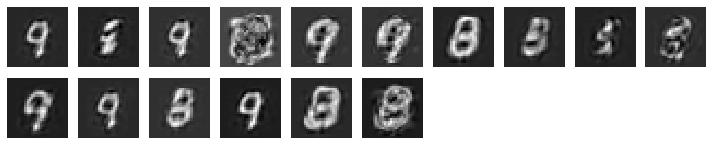

results after iter  12700  loss =  [9.032787, 5.833972, 0.31851113]  support =  784.0


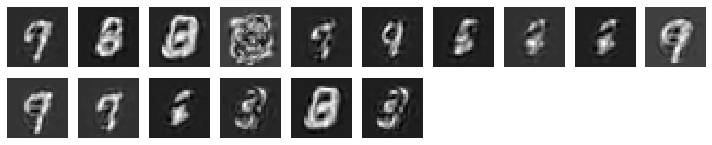

results after iter  12800  loss =  [7.1736326, 4.1590743, 0.29985243]  support =  784.0


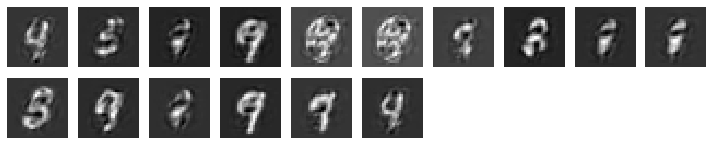

results after iter  12900  loss =  [8.390031, 5.3516183, 0.30258864]  support =  784.0


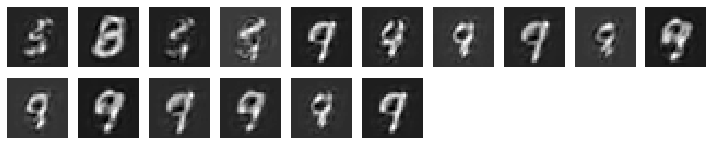

results after iter  13000  loss =  [8.180359, 4.992428, 0.31674263]  support =  784.0


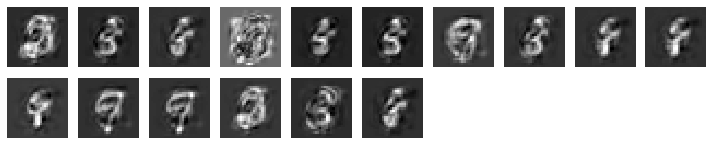

results after iter  13100  loss =  [10.191081, 6.5015726, 0.36695316]  support =  784.0


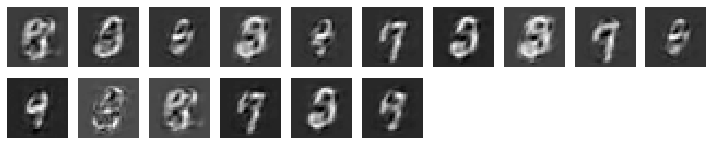

results after iter  13200  loss =  [9.411756, 6.24598, 0.31517404]  support =  784.0


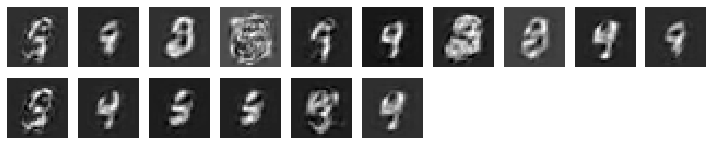

results after iter  13300  loss =  [9.641015, 6.361986, 0.32647806]  support =  784.0


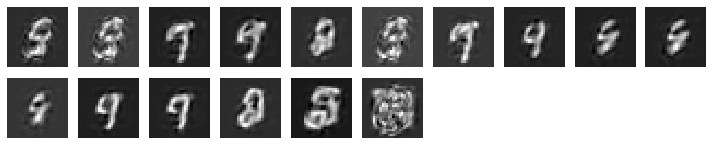

results after iter  13400  loss =  [7.629749, 4.270323, 0.33412886]  support =  784.0


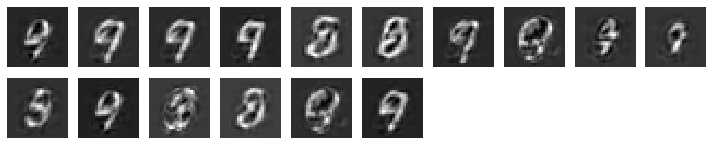

results after iter  13500  loss =  [8.6178, 5.479268, 0.31213713]  support =  784.0


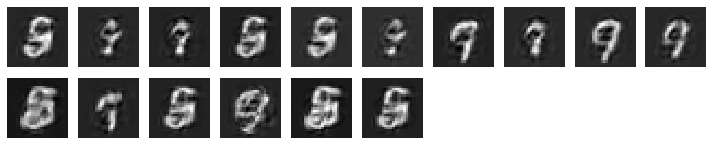

results after iter  13600  loss =  [9.520636, 6.024849, 0.34786344]  support =  784.0


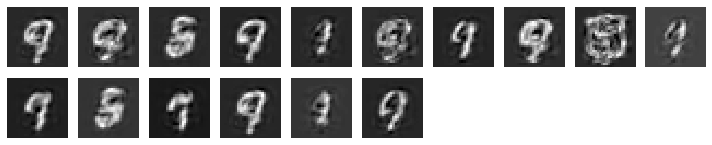

results after iter  13700  loss =  [7.6192636, 4.3726745, 0.3227647]  support =  784.0


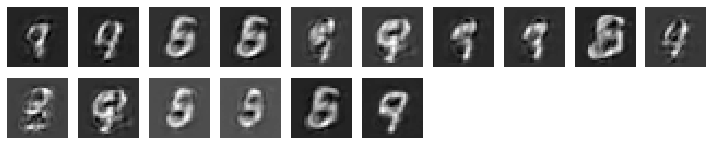

results after iter  13800  loss =  [9.047313, 5.9425344, 0.3089579]  support =  784.0


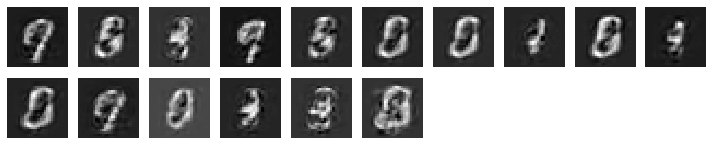

results after iter  13900  loss =  [7.4221215, 4.055773, 0.3347934]  support =  784.0


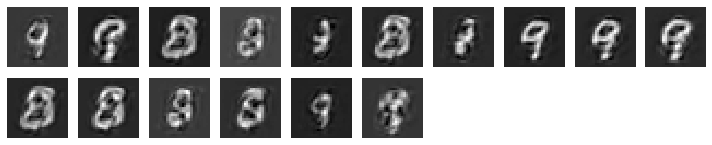

results after iter  14000  loss =  [8.461737, 5.2963305, 0.31522512]  support =  784.0


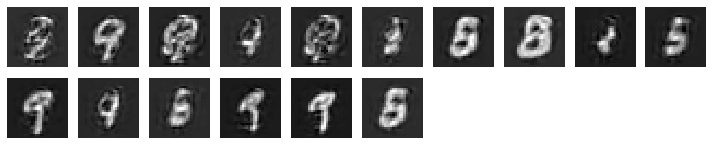

results after iter  14100  loss =  [8.223101, 5.078622, 0.31203878]  support =  784.0


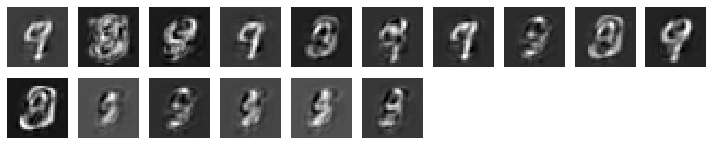

results after iter  14200  loss =  [8.688955, 5.5189056, 0.31499237]  support =  784.0


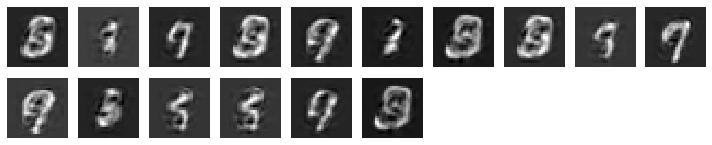

results after iter  14300  loss =  [7.936257, 4.758009, 0.3159774]  support =  784.0


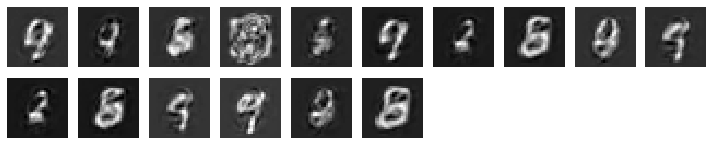

results after iter  14400  loss =  [7.80071, 4.7380576, 0.30438995]  support =  784.0


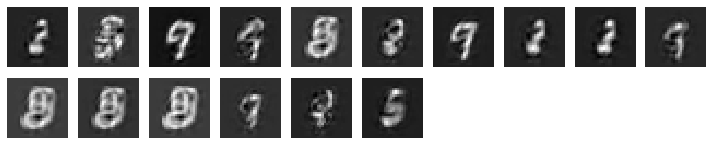

results after iter  14500  loss =  [8.520912, 5.149414, 0.33586347]  support =  784.0


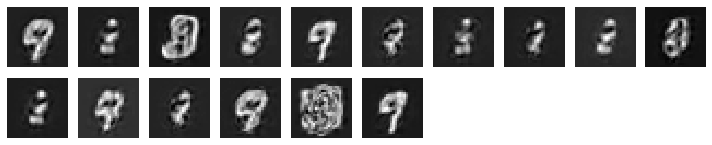

results after iter  14600  loss =  [8.103704, 4.889232, 0.3195823]  support =  784.0


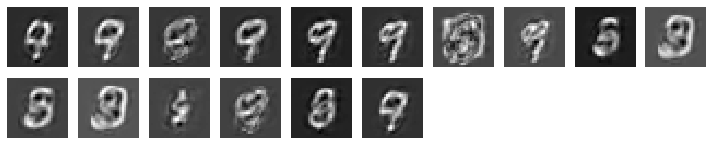

results after iter  14700  loss =  [7.9239216, 4.8007317, 0.3107909]  support =  784.0


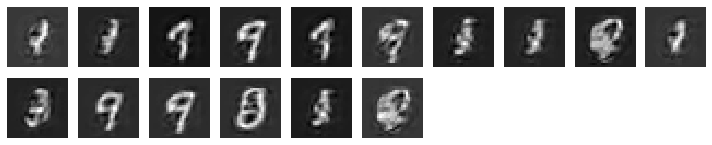

results after iter  14800  loss =  [9.406596, 6.163373, 0.32284656]  support =  784.0


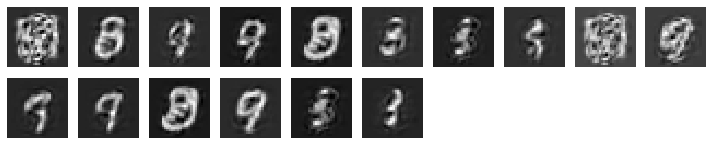

results after iter  14900  loss =  [7.2121797, 4.033202, 0.3161941]  support =  784.0


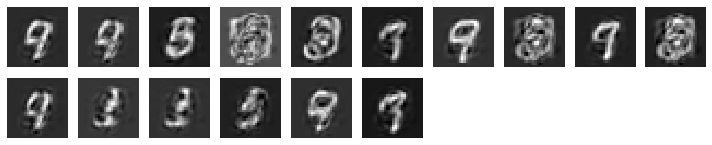

Epoch: 3 	 Discriminator Loss_fake: 0.3485706150531769 	 Discriminator Loss_real: 0.019844984635710716		 Generator Loss: [7.6363, 4.462234, 0.31564435] 		 Reconstructor Loss:1.0796964168548584	 support: 0


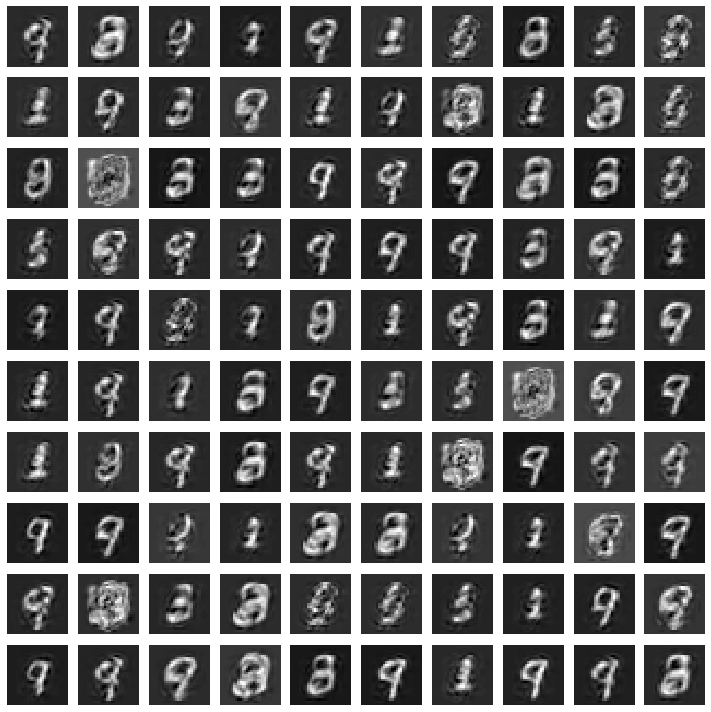

results after iter  15000  loss =  [8.60023, 5.4292364, 0.31534338]  support =  784.0


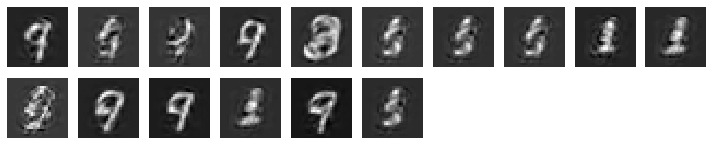

results after iter  15100  loss =  [8.293033, 5.2183533, 0.3055628]  support =  784.0


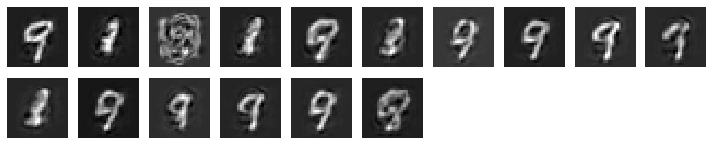

results after iter  15200  loss =  [8.776203, 5.480402, 0.32809752]  support =  784.0


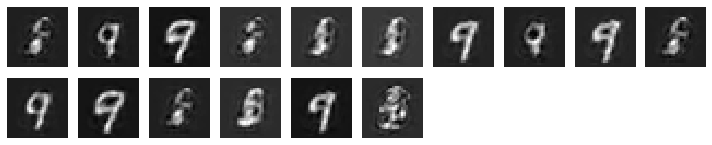

results after iter  15300  loss =  [8.38841, 4.8696404, 0.35006082]  support =  784.0


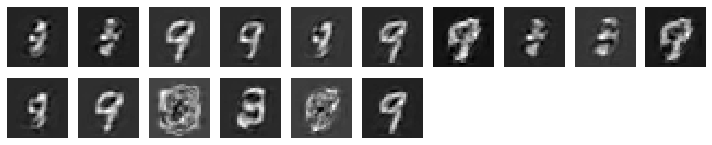

results after iter  15400  loss =  [9.420413, 6.125071, 0.32779855]  support =  784.0


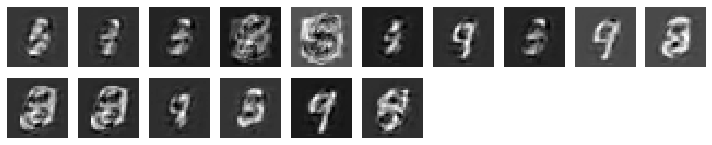

results after iter  15500  loss =  [9.09647, 5.937998, 0.31464392]  support =  784.0


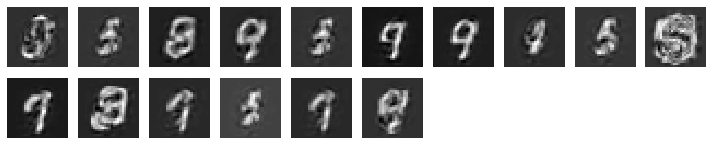

results after iter  15600  loss =  [7.6853814, 4.463591, 0.32040504]  support =  784.0


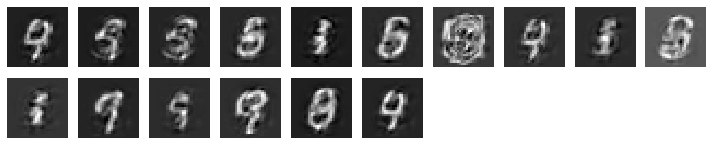

results after iter  15700  loss =  [8.0668745, 4.8439455, 0.32069662]  support =  784.0


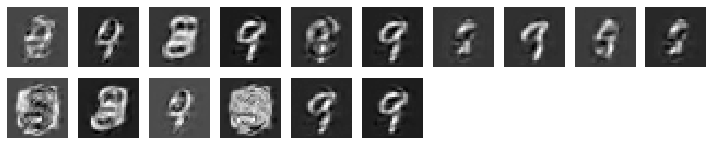

results after iter  15800  loss =  [8.426238, 5.2841477, 0.31253678]  support =  784.0


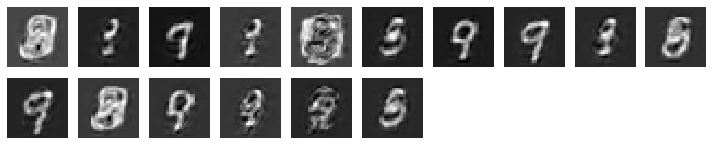

results after iter  15900  loss =  [7.6591964, 4.48656, 0.3155565]  support =  784.0


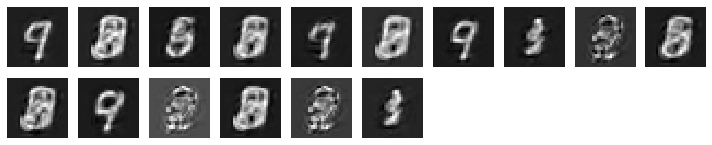

results after iter  16000  loss =  [9.354699, 6.2558527, 0.30872017]  support =  784.0


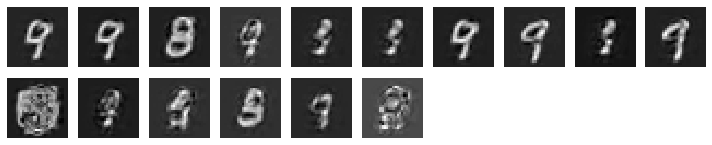

results after iter  16100  loss =  [6.5226436, 3.368423, 0.31335968]  support =  784.0


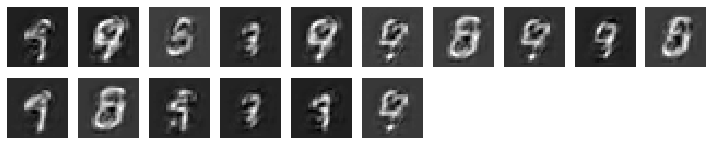

results after iter  16200  loss =  [7.9535613, 4.61856, 0.33199897]  support =  784.0


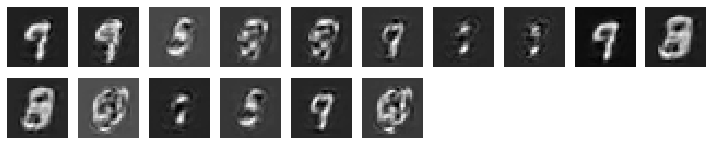

results after iter  16300  loss =  [8.294643, 5.103808, 0.31739706]  support =  784.0


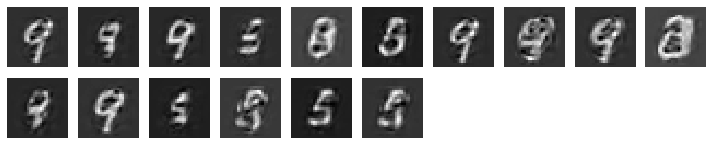

results after iter  16400  loss =  [8.6364, 5.557554, 0.30666077]  support =  784.0


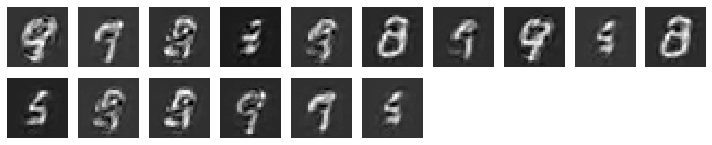

results after iter  16500  loss =  [7.7021017, 4.305807, 0.33771926]  support =  784.0


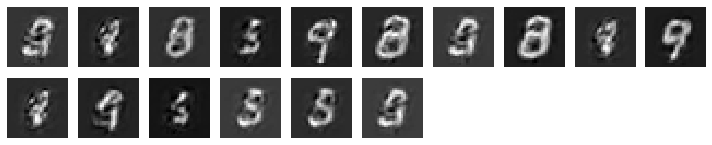

results after iter  16600  loss =  [6.3576474, 3.207446, 0.312965]  support =  784.0


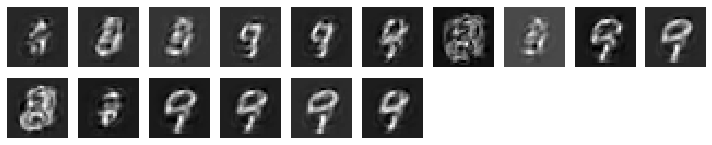

results after iter  16700  loss =  [7.7403994, 4.6779, 0.30486876]  support =  784.0


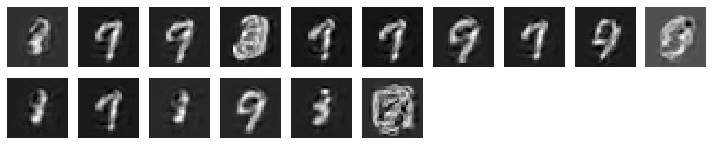

results after iter  16800  loss =  [7.889689, 4.7928696, 0.30834922]  support =  784.0


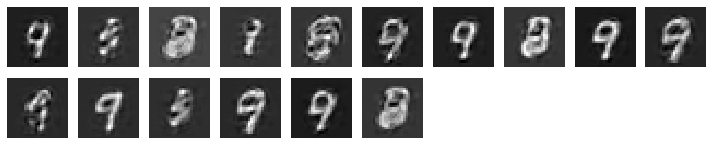

results after iter  16900  loss =  [9.138651, 5.9446135, 0.3180455]  support =  784.0


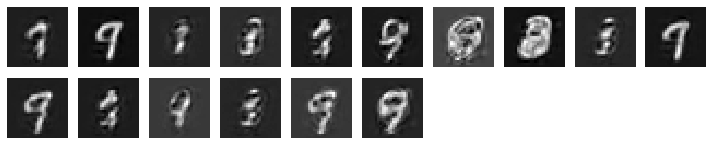

results after iter  17000  loss =  [7.8666654, 4.775466, 0.30717632]  support =  784.0


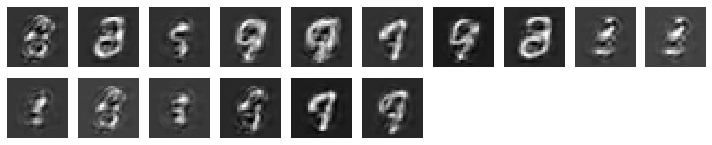

results after iter  17100  loss =  [8.4289, 5.2307467, 0.31850022]  support =  784.0


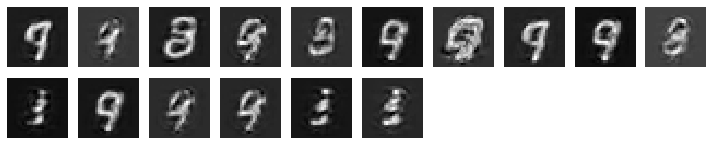

results after iter  17200  loss =  [7.8052964, 4.3677816, 0.3420705]  support =  784.0


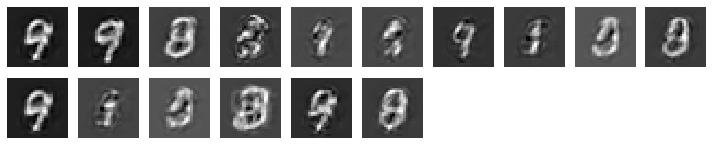

results after iter  17300  loss =  [8.1076355, 4.889055, 0.32040828]  support =  784.0


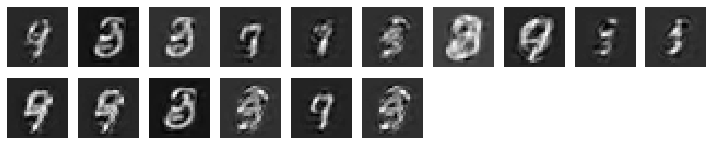

results after iter  17400  loss =  [8.83549, 5.306137, 0.3515057]  support =  784.0


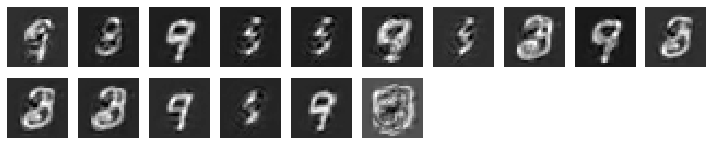

results after iter  17500  loss =  [10.246904, 6.9457397, 0.32839644]  support =  784.0


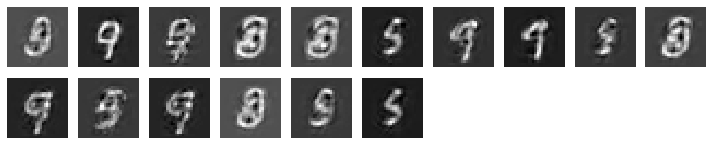

results after iter  17600  loss =  [6.2294717, 2.9922705, 0.32192558]  support =  784.0


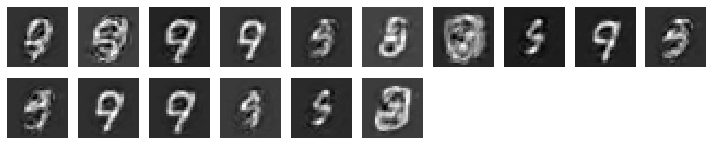

results after iter  17700  loss =  [8.703366, 5.474046, 0.32166922]  support =  784.0


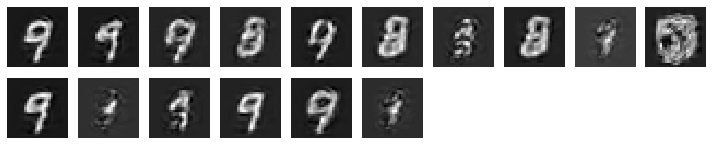

results after iter  17800  loss =  [9.153932, 5.7964, 0.33429226]  support =  784.0


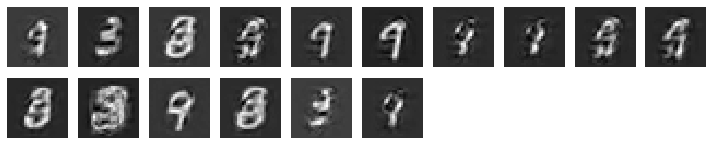

results after iter  17900  loss =  [8.562247, 5.439928, 0.31117463]  support =  784.0


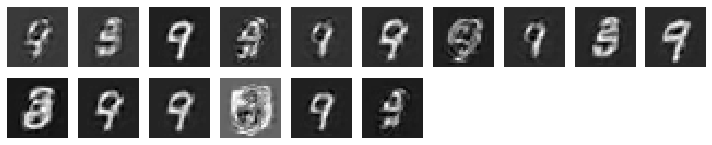

results after iter  18000  loss =  [10.601778, 7.4499784, 0.31329262]  support =  784.0


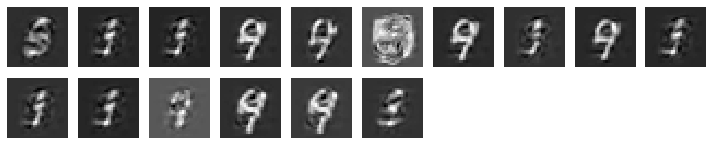

results after iter  18100  loss =  [7.144634, 4.003191, 0.31216875]  support =  784.0


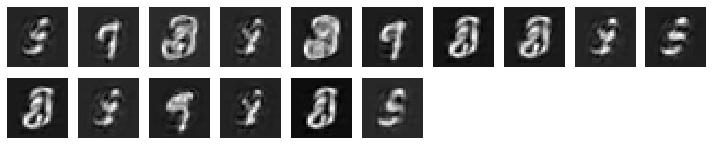

results after iter  18200  loss =  [8.587955, 5.4433994, 0.31310874]  support =  784.0


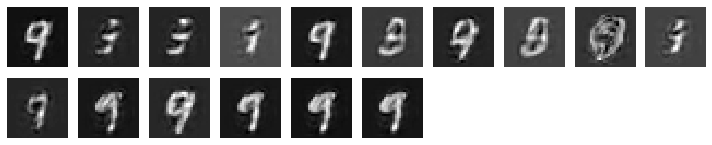

results after iter  18300  loss =  [8.322773, 5.0925226, 0.3215103]  support =  784.0


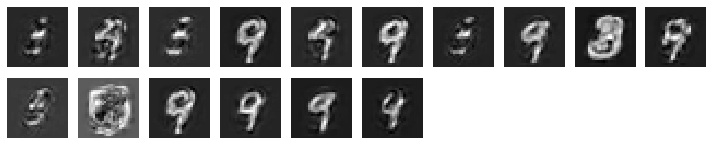

results after iter  18400  loss =  [4.364883, 1.2831907, 0.30618954]  support =  784.0


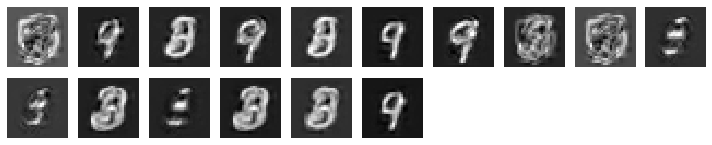

results after iter  18500  loss =  [7.819511, 4.4932537, 0.33084834]  support =  784.0


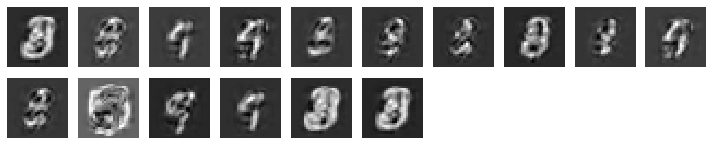

results after iter  18600  loss =  [8.577836, 5.4249206, 0.313981]  support =  784.0


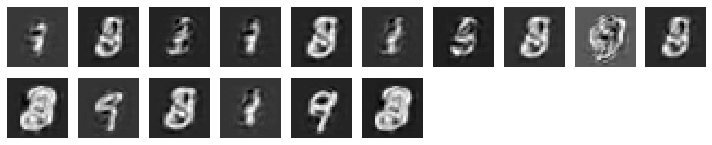

results after iter  18700  loss =  [7.5205927, 4.1775303, 0.3327707]  support =  784.0


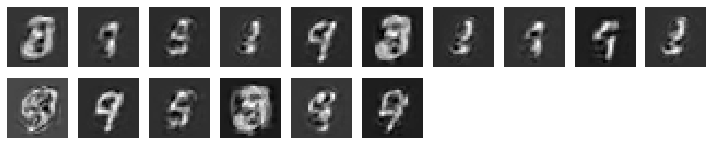

Epoch: 4 	 Discriminator Loss_fake: 0.3456481695175171 	 Discriminator Loss_real: 0.014215542003512383		 Generator Loss: [7.5067854, 4.3148394, 0.317801] 		 Reconstructor Loss:1.0465943813323975	 support: 0


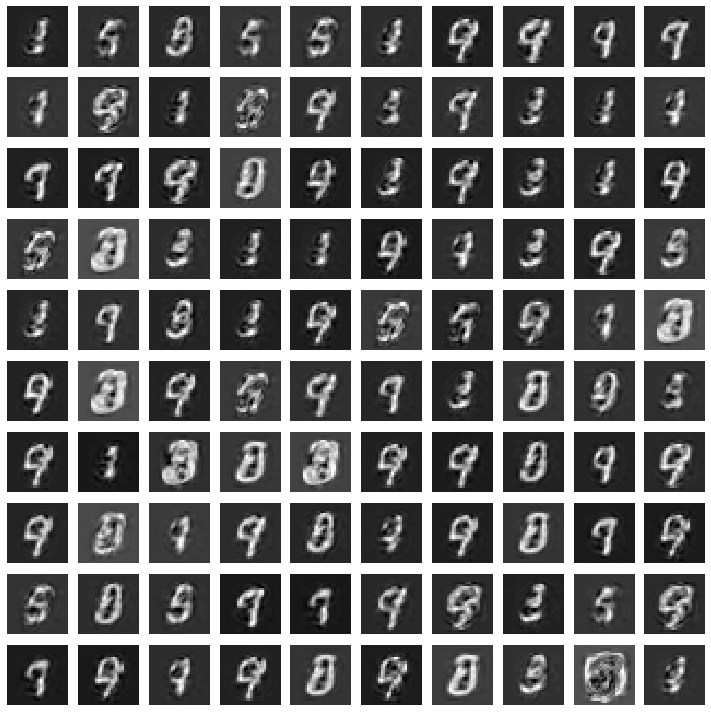

results after iter  18800  loss =  [7.2091527, 3.9480681, 0.3243403]  support =  784.0


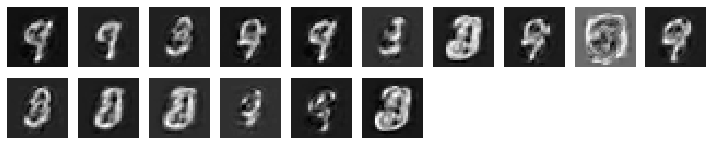

results after iter  18900  loss =  [8.931152, 5.7248006, 0.31945455]  support =  784.0


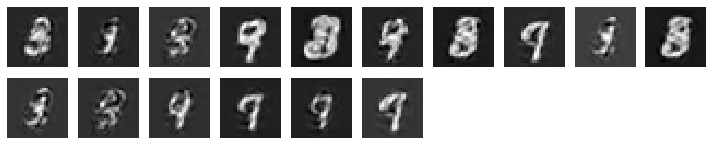

results after iter  19000  loss =  [8.706125, 5.279563, 0.34120092]  support =  784.0


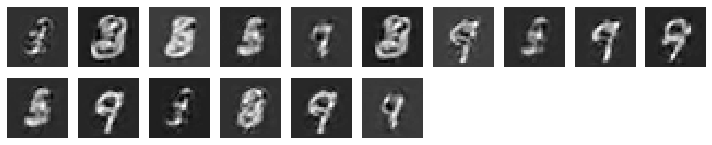

results after iter  19100  loss =  [8.0490675, 4.6605253, 0.33683404]  support =  784.0


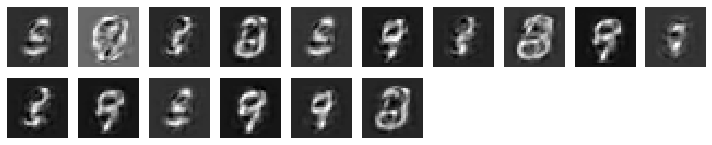

results after iter  19200  loss =  [5.650784, 2.355055, 0.32816476]  support =  784.0


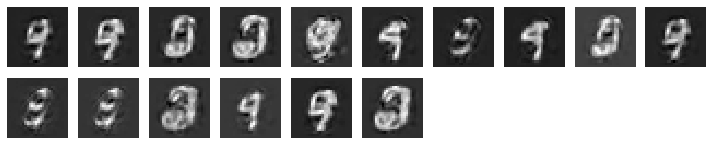

results after iter  19300  loss =  [8.57268, 5.3380322, 0.32173246]  support =  784.0


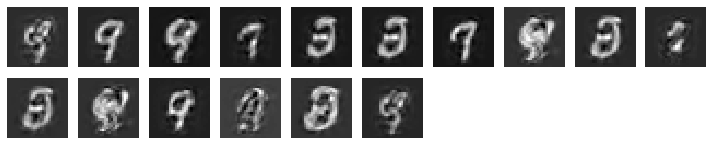

results after iter  19400  loss =  [7.756303, 4.5410395, 0.3195676]  support =  784.0


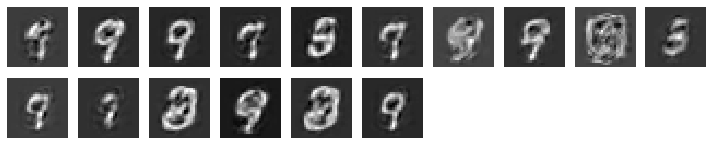

results after iter  19500  loss =  [8.906544, 5.732324, 0.31582716]  support =  784.0


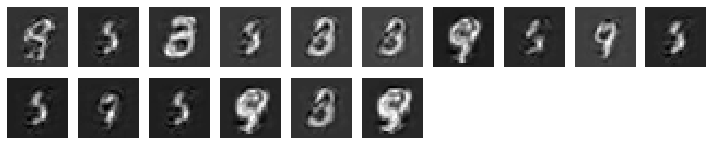

results after iter  19600  loss =  [7.677531, 4.477893, 0.31803003]  support =  784.0


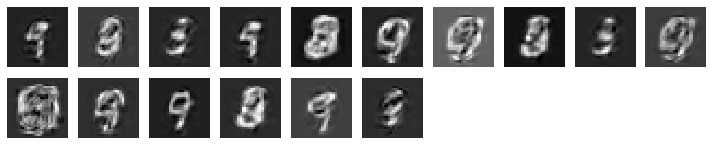

results after iter  19700  loss =  [9.487191, 6.3328695, 0.31410566]  support =  784.0


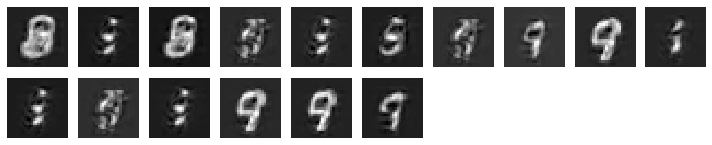

results after iter  19800  loss =  [7.9283295, 4.7603474, 0.31537575]  support =  784.0


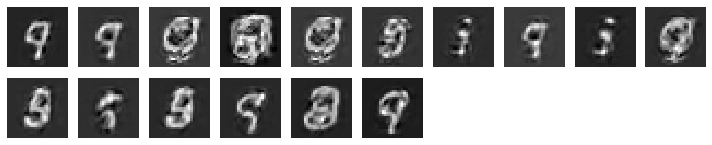

results after iter  19900  loss =  [8.2683325, 5.089755, 0.31583887]  support =  784.0


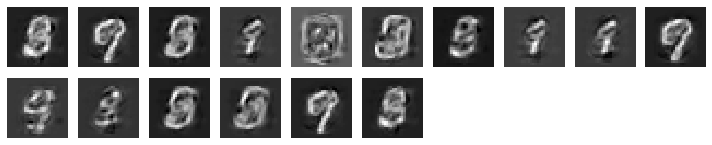

results after iter  20000  loss =  [9.0692835, 5.5448465, 0.35072428]  support =  784.0


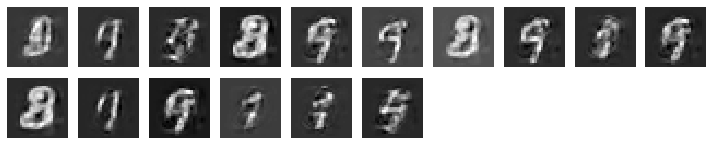

results after iter  20100  loss =  [9.590603, 5.9868126, 0.3589378]  support =  784.0


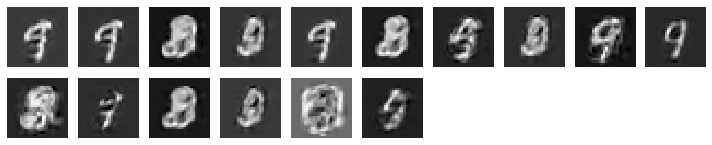

results after iter  20200  loss =  [7.282481, 3.7918718, 0.3472653]  support =  784.0


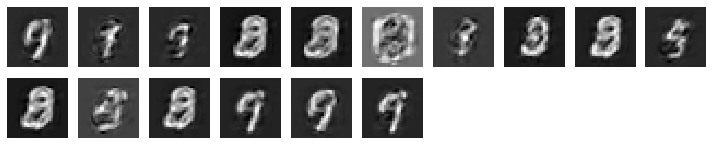

results after iter  20300  loss =  [9.08668, 5.715044, 0.33539963]  support =  784.0


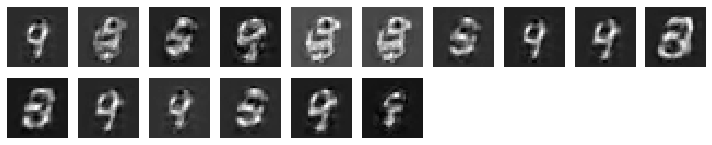

results after iter  20400  loss =  [7.4546943, 4.1604843, 0.32818636]  support =  784.0


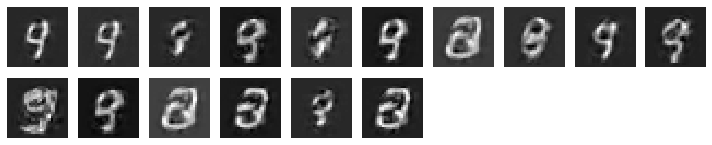

results after iter  20500  loss =  [9.815318, 6.3847523, 0.34180632]  support =  784.0


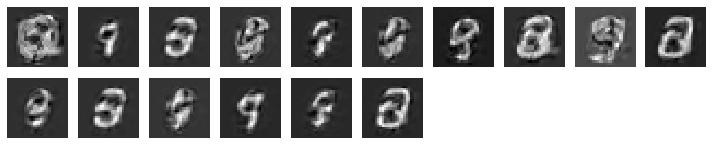

results after iter  20600  loss =  [8.337311, 4.9728866, 0.33516032]  support =  784.0


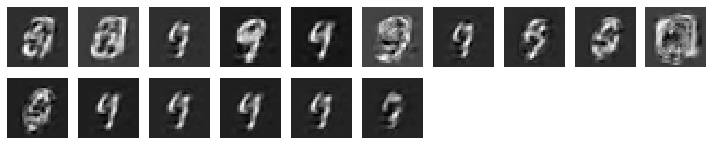

results after iter  20700  loss =  [8.963918, 5.14767, 0.3799697]  support =  784.0


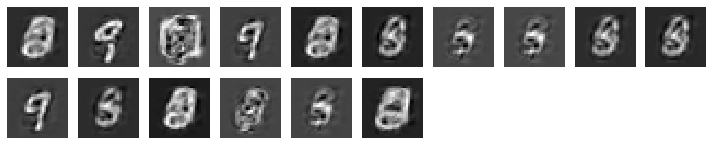

results after iter  20800  loss =  [9.390222, 5.7632236, 0.36155748]  support =  784.0


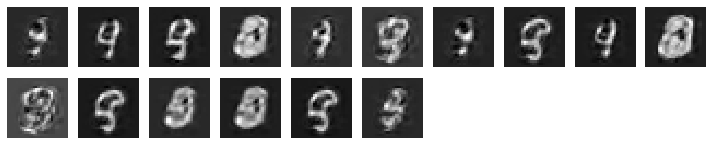

results after iter  20900  loss =  [8.54654, 4.9738665, 0.35556883]  support =  784.0


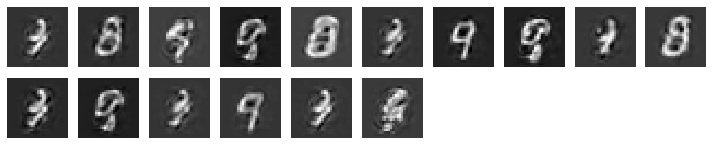

results after iter  21000  loss =  [7.9862328, 4.6759834, 0.32951593]  support =  784.0


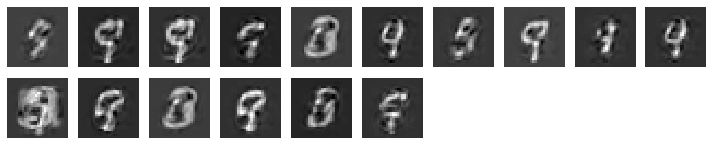

results after iter  21100  loss =  [7.134244, 3.8086467, 0.3307535]  support =  784.0


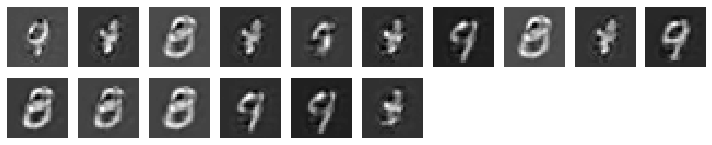

results after iter  21200  loss =  [7.7659106, 4.538457, 0.3210782]  support =  784.0


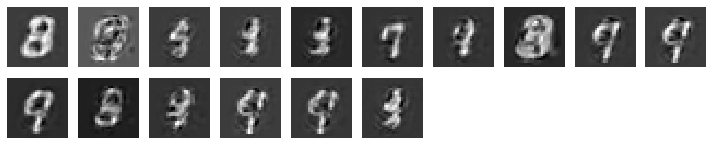

results after iter  21300  loss =  [8.269198, 5.034175, 0.32147628]  support =  784.0


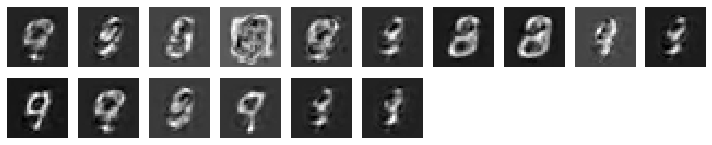

results after iter  21400  loss =  [9.039383, 5.8591003, 0.31657577]  support =  784.0


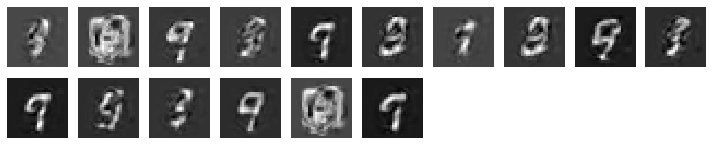

results after iter  21500  loss =  [8.404798, 5.2466927, 0.31432807]  support =  784.0


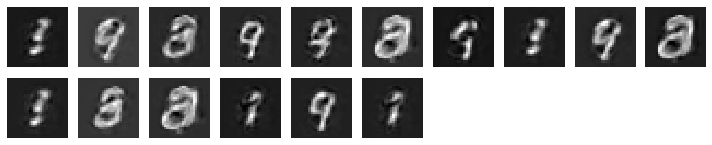

results after iter  21600  loss =  [7.3503656, 3.9336438, 0.34024364]  support =  784.0


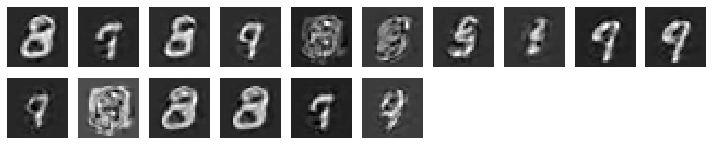

results after iter  21700  loss =  [6.068083, 2.8230686, 0.32254058]  support =  784.0


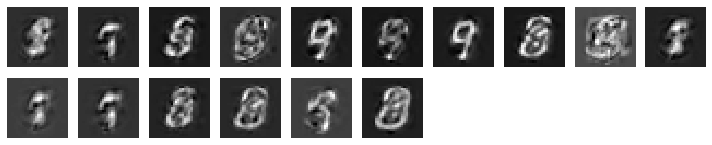

results after iter  21800  loss =  [7.2475777, 3.9181328, 0.33102724]  support =  784.0


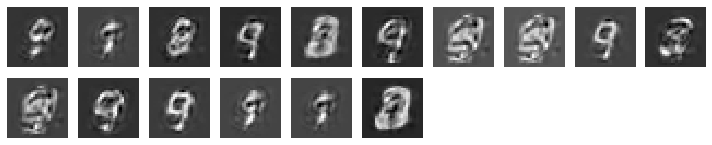

results after iter  21900  loss =  [10.428795, 6.9167366, 0.34990433]  support =  784.0


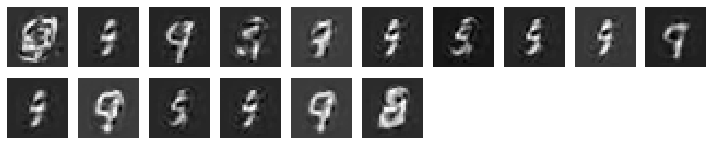

results after iter  22000  loss =  [7.8388257, 4.5165725, 0.33062607]  support =  784.0


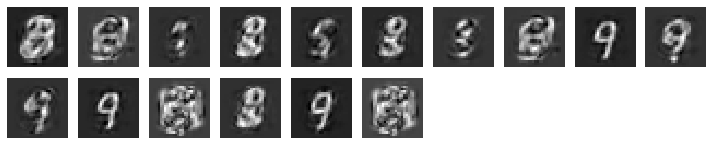

results after iter  22100  loss =  [6.267134, 3.1637802, 0.3085407]  support =  784.0


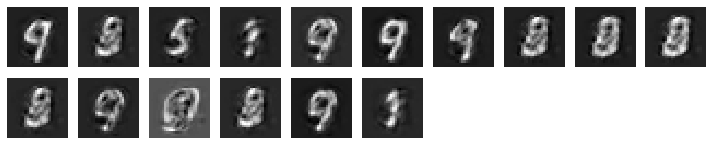

results after iter  22200  loss =  [7.378382, 3.9521701, 0.34071708]  support =  784.0


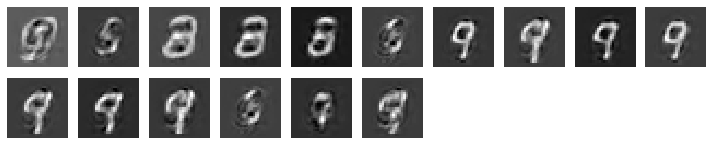

results after iter  22300  loss =  [8.084057, 4.771159, 0.32969308]  support =  784.0


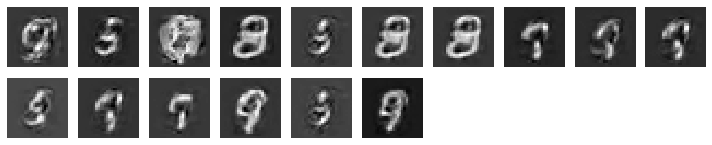

results after iter  22400  loss =  [7.115455, 3.8971071, 0.3206741]  support =  784.0


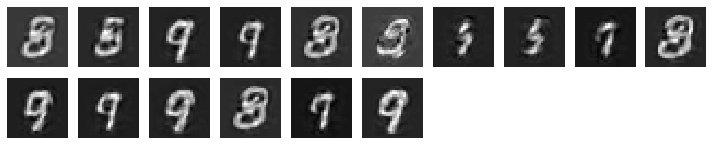

Epoch: 5 	 Discriminator Loss_fake: 0.36812523007392883 	 Discriminator Loss_real: 0.03942100703716278		 Generator Loss: [8.070772, 4.8124647, 0.32423195] 		 Reconstructor Loss:0.9623388648033142	 support: 0


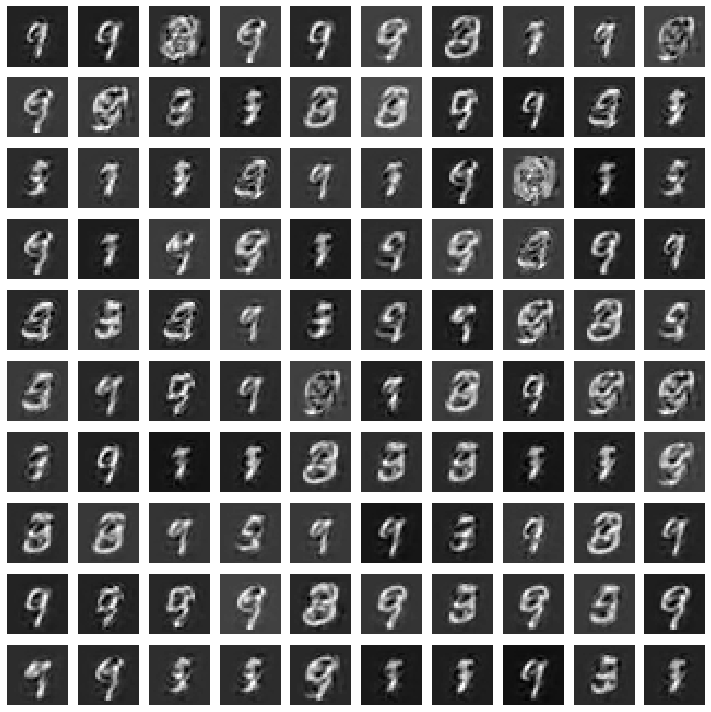

results after iter  22500  loss =  [7.9084888, 4.3844376, 0.35081178]  support =  784.0


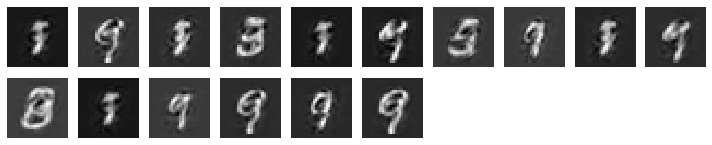

results after iter  22600  loss =  [7.831983, 4.383494, 0.34281057]  support =  784.0


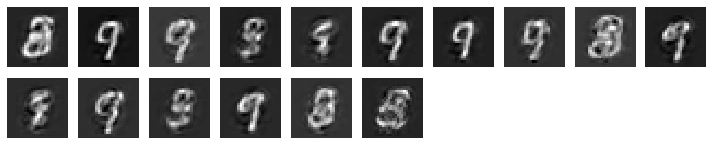

results after iter  22700  loss =  [7.5475864, 4.1372604, 0.3396218]  support =  784.0


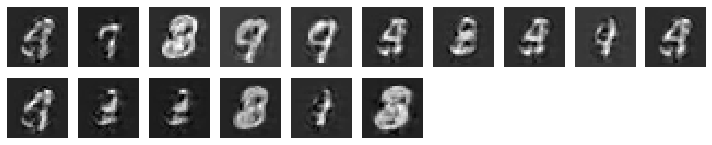

results after iter  22800  loss =  [5.5241838, 2.1882226, 0.3316056]  support =  784.0


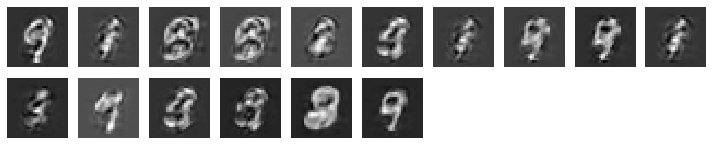

results after iter  22900  loss =  [9.19107, 5.9046316, 0.32720238]  support =  784.0


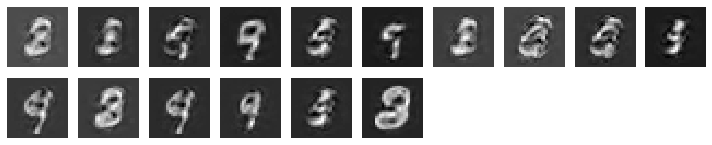

results after iter  23000  loss =  [7.728182, 4.290307, 0.34167486]  support =  784.0


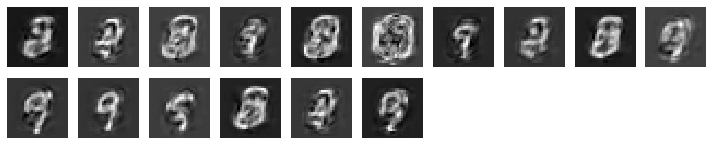

results after iter  23100  loss =  [9.763943, 6.390438, 0.3358207]  support =  784.0


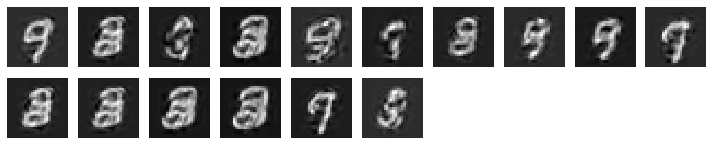

results after iter  23200  loss =  [7.4514136, 4.1507635, 0.32853314]  support =  784.0


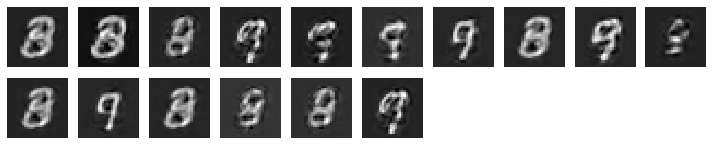

results after iter  23300  loss =  [9.063657, 5.79171, 0.326076]  support =  784.0


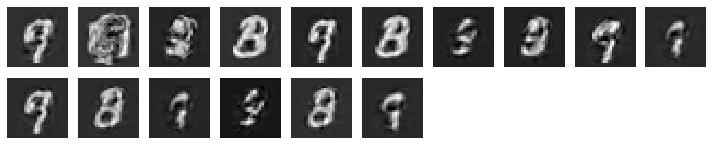

results after iter  23400  loss =  [5.4516006, 1.9318795, 0.3493979]  support =  784.0


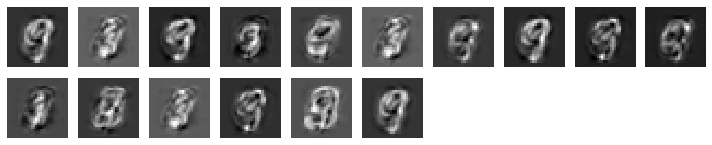

results after iter  23500  loss =  [8.273783, 4.939446, 0.33155695]  support =  784.0


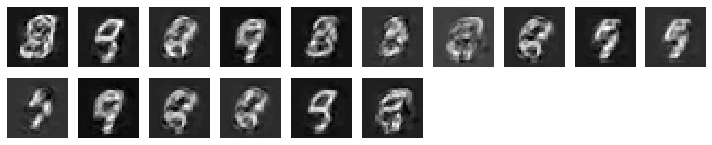

results after iter  23600  loss =  [9.306519, 5.9562316, 0.3336529]  support =  784.0


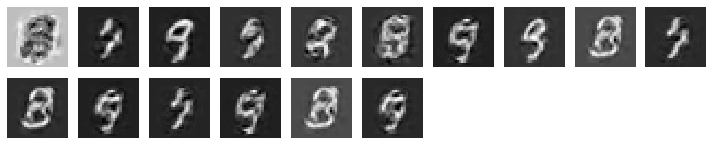

results after iter  23700  loss =  [7.369833, 4.100302, 0.32532436]  support =  784.0


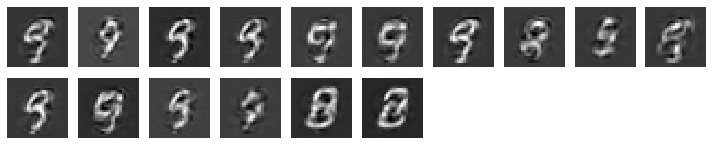

results after iter  23800  loss =  [7.893557, 4.738229, 0.31445342]  support =  784.0


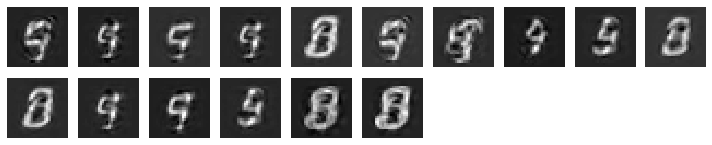

results after iter  23900  loss =  [8.906837, 5.630661, 0.3260461]  support =  784.0


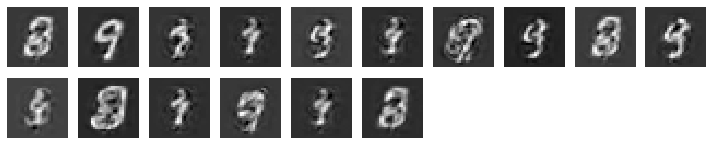

results after iter  24000  loss =  [7.8909354, 4.5511675, 0.33291662]  support =  784.0


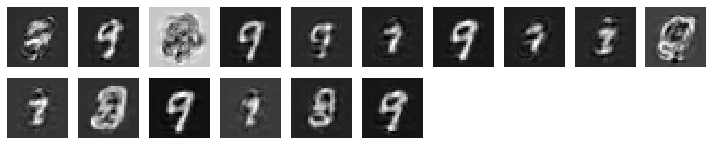

results after iter  24100  loss =  [7.147614, 3.9002135, 0.32326475]  support =  784.0


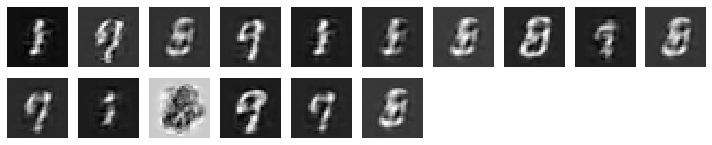

results after iter  24200  loss =  [6.3098435, 3.2390525, 0.30534202]  support =  784.0


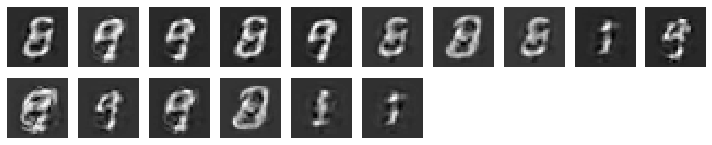

results after iter  24300  loss =  [6.9547105, 3.8328867, 0.3109432]  support =  784.0


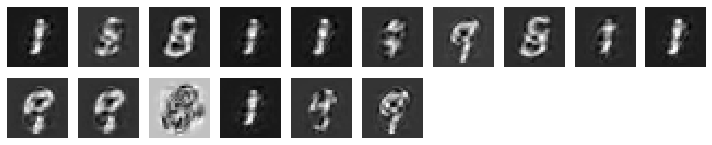

results after iter  24400  loss =  [6.957381, 3.737915, 0.32021216]  support =  784.0


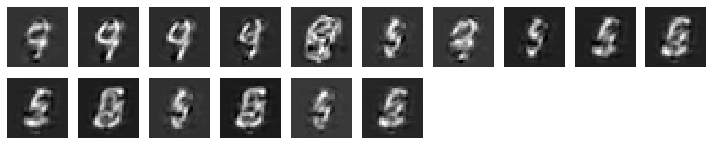

results after iter  24500  loss =  [8.208924, 4.9833555, 0.3208752]  support =  784.0


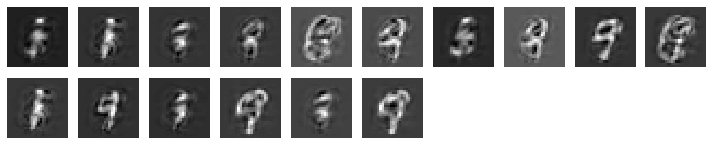

results after iter  24600  loss =  [7.037657, 3.8325915, 0.31887686]  support =  784.0


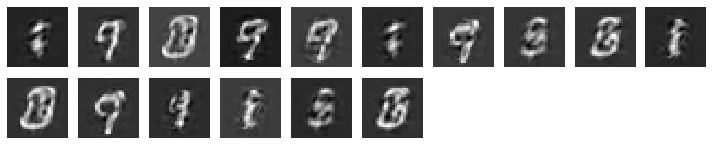

results after iter  24700  loss =  [7.8563724, 4.8118677, 0.30334705]  support =  784.0


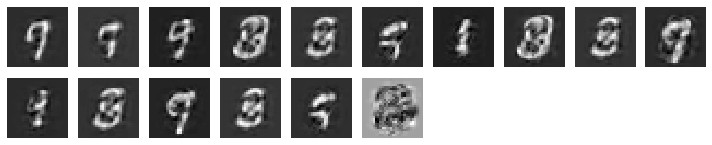

results after iter  24800  loss =  [8.094542, 5.0233274, 0.30565667]  support =  784.0


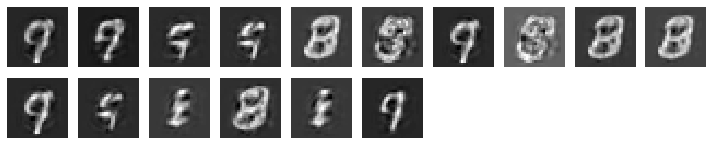

results after iter  24900  loss =  [8.350052, 5.2097454, 0.31303632]  support =  784.0


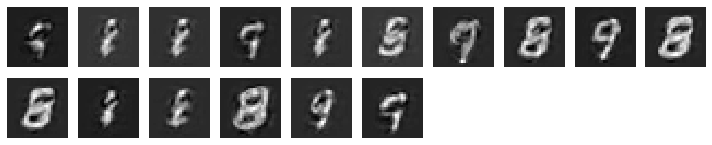

results after iter  25000  loss =  [11.462807, 7.7420774, 0.37076533]  support =  784.0


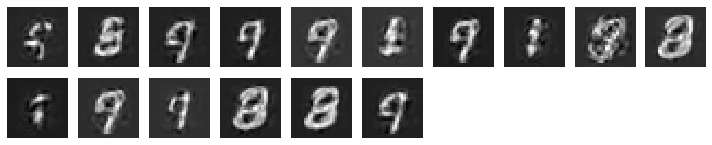

results after iter  25100  loss =  [7.00085, 3.8812213, 0.31048346]  support =  784.0


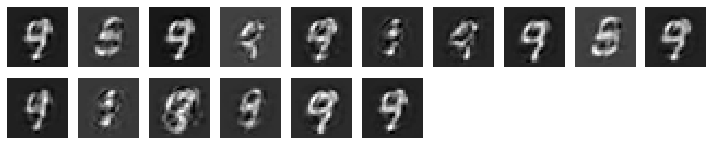

results after iter  25200  loss =  [7.663025, 4.4752655, 0.31771392]  support =  784.0


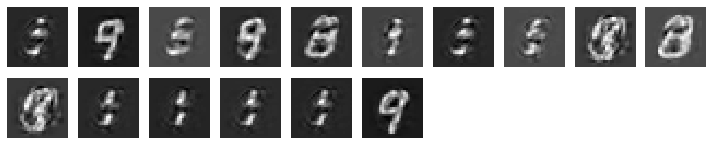

results after iter  25300  loss =  [6.8199744, 3.5558772, 0.3244108]  support =  784.0


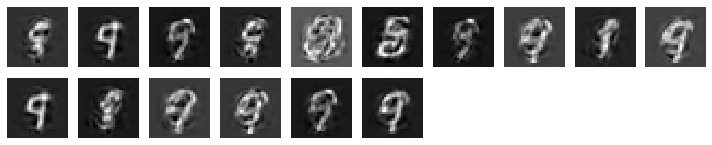

results after iter  25400  loss =  [7.883544, 4.5015116, 0.3363186]  support =  784.0


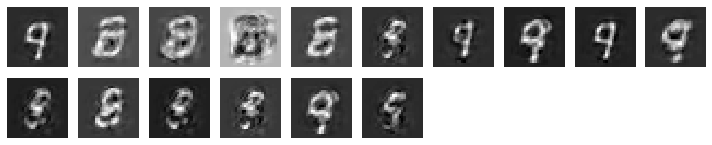

results after iter  25500  loss =  [6.8245673, 3.5593057, 0.32527977]  support =  784.0


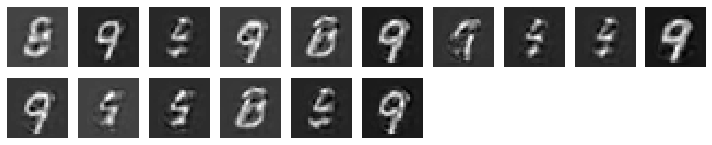

results after iter  25600  loss =  [6.336372, 3.1558342, 0.31638017]  support =  784.0


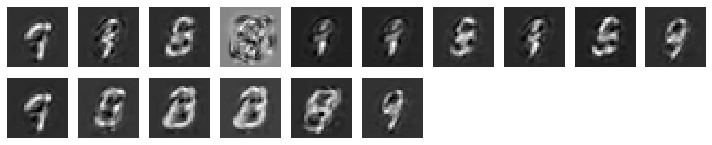

results after iter  25700  loss =  [7.006853, 3.6947813, 0.3293106]  support =  784.0


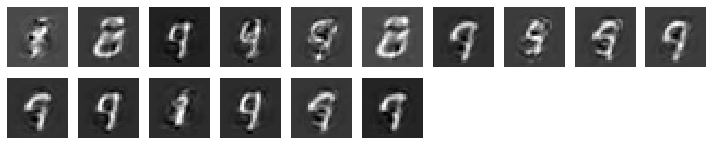

results after iter  25800  loss =  [7.8496776, 4.4131513, 0.342134]  support =  784.0


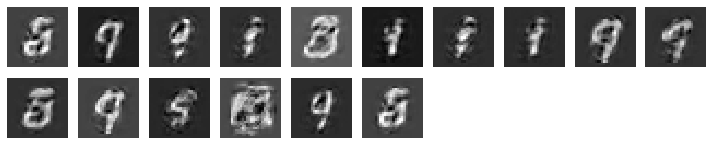

results after iter  25900  loss =  [8.806094, 5.1186705, 0.3672799]  support =  784.0


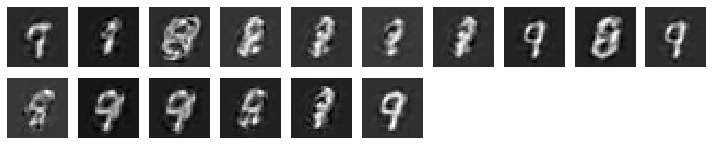

results after iter  26000  loss =  [7.35787, 4.0867968, 0.32538533]  support =  784.0


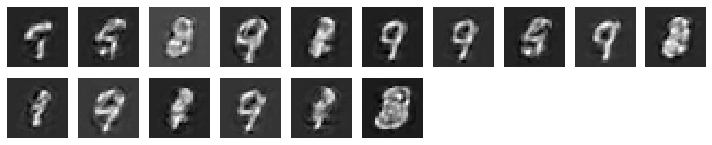

results after iter  26100  loss =  [7.1368685, 3.8457847, 0.32791513]  support =  784.0


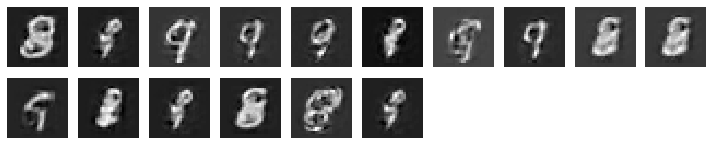

results after iter  26200  loss =  [8.326643, 5.004844, 0.33032614]  support =  784.0


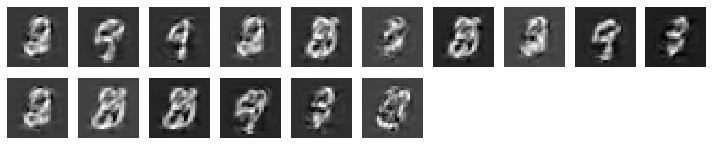

Epoch: 6 	 Discriminator Loss_fake: 0.34881559014320374 	 Discriminator Loss_real: 0.023359591141343117		 Generator Loss: [7.978186, 4.526705, 0.34337533] 		 Reconstructor Loss:0.9690459966659546	 support: 0


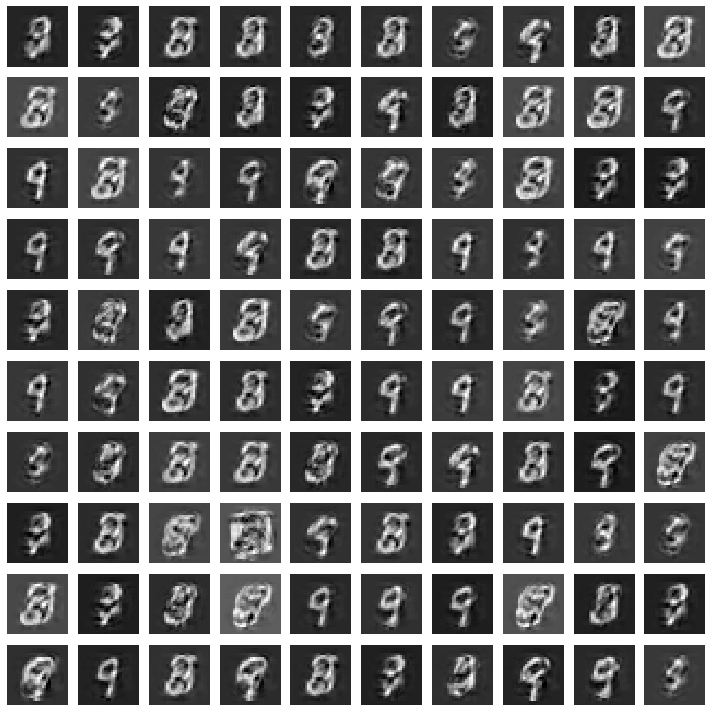

results after iter  26300  loss =  [5.258682, 1.5013074, 0.37367454]  support =  784.0


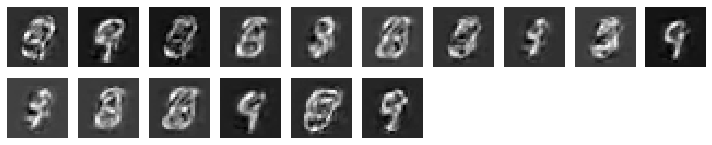

results after iter  26400  loss =  [8.090073, 4.726777, 0.33439046]  support =  784.0


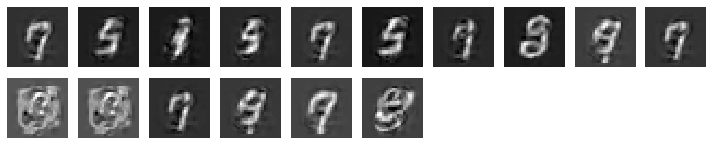

results after iter  26500  loss =  [4.7587695, 1.3621984, 0.3376894]  support =  784.0


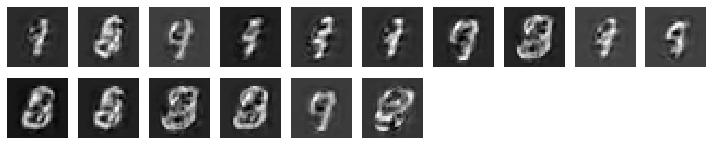

results after iter  26600  loss =  [7.59741, 4.2693863, 0.33104232]  support =  784.0


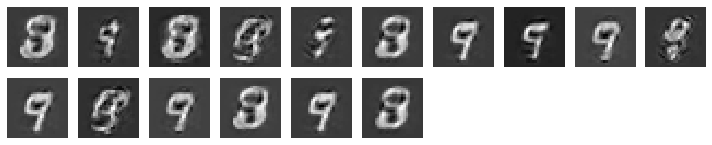

results after iter  26700  loss =  [8.372088, 4.9383736, 0.3421123]  support =  784.0


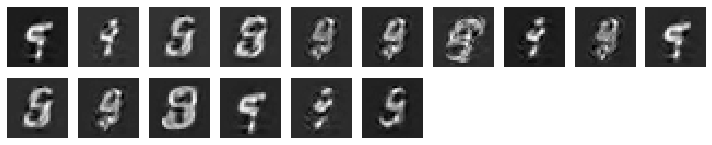

results after iter  26800  loss =  [7.1044354, 3.6755404, 0.3409561]  support =  784.0


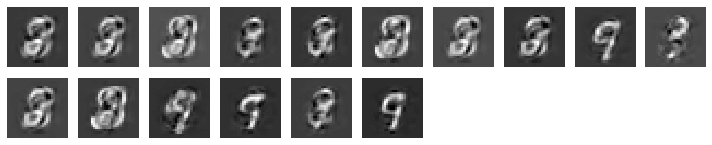

results after iter  26900  loss =  [7.7203274, 4.1724463, 0.35316318]  support =  784.0


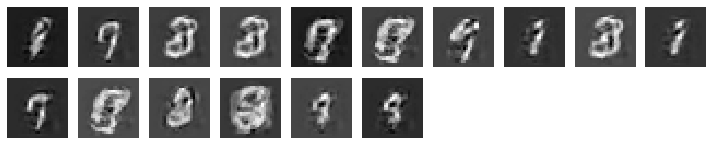

results after iter  27000  loss =  [7.4182296, 4.0755787, 0.3325301]  support =  784.0


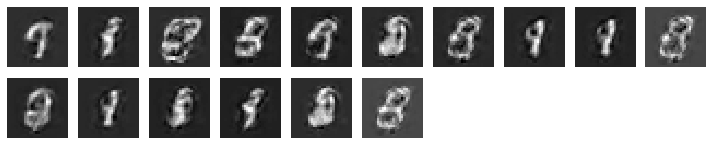

results after iter  27100  loss =  [8.044228, 4.722174, 0.33102003]  support =  784.0


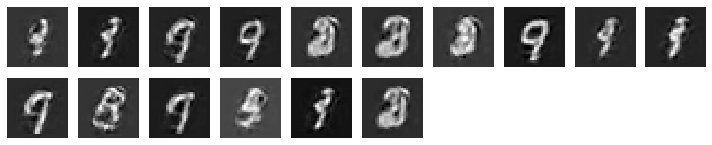

results after iter  27200  loss =  [6.6730275, 3.2568266, 0.3395978]  support =  784.0


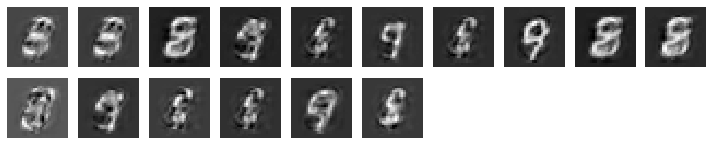

results after iter  27300  loss =  [9.643414, 6.305655, 0.33220148]  support =  784.0


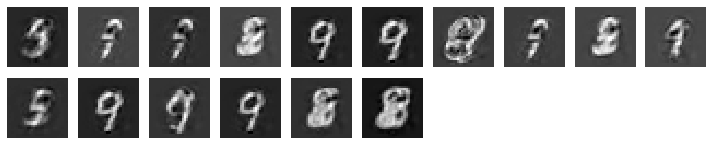

results after iter  27400  loss =  [10.020031, 6.5786304, 0.34302223]  support =  784.0


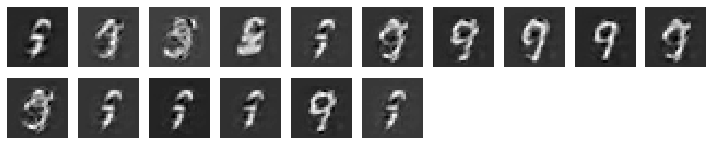

results after iter  27500  loss =  [9.34446, 6.0958843, 0.3232699]  support =  784.0


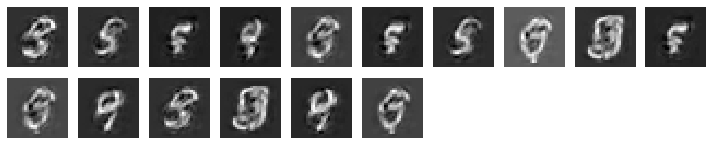

results after iter  27600  loss =  [8.2562, 4.76367, 0.34760344]  support =  784.0


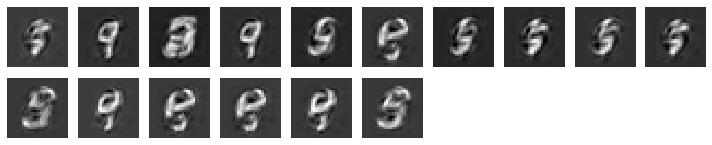

results after iter  27700  loss =  [6.539236, 3.1403718, 0.3381432]  support =  784.0


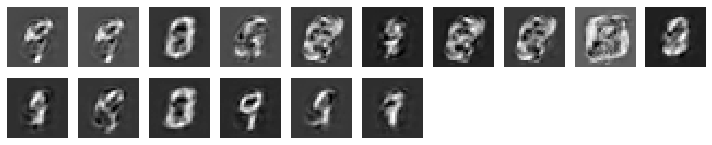

results after iter  27800  loss =  [7.6926746, 4.429, 0.3246653]  support =  784.0


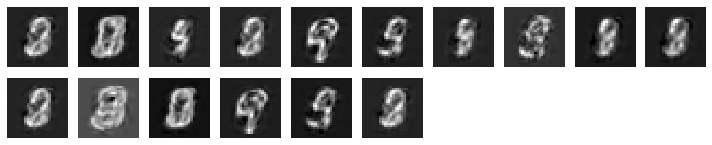

results after iter  27900  loss =  [9.100553, 5.920687, 0.3167107]  support =  784.0


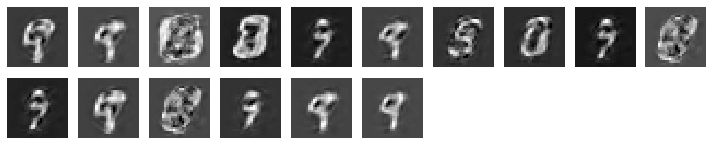

results after iter  28000  loss =  [7.3585496, 4.1604185, 0.3185462]  support =  784.0


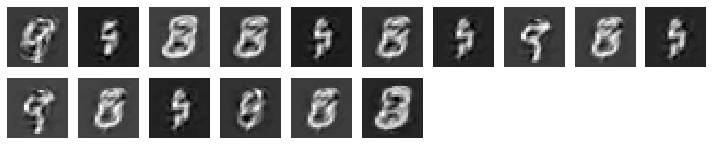

results after iter  28100  loss =  [7.5864525, 3.8957949, 0.3672909]  support =  784.0


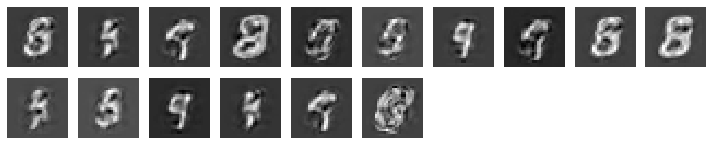

results after iter  28200  loss =  [4.228152, 0.95564735, 0.3254555]  support =  784.0


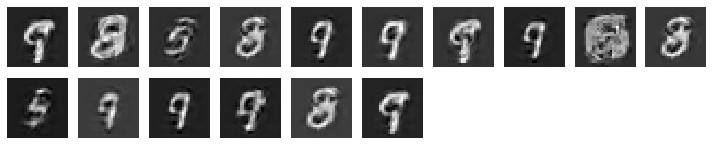

results after iter  28300  loss =  [8.203002, 4.560873, 0.36237267]  support =  784.0


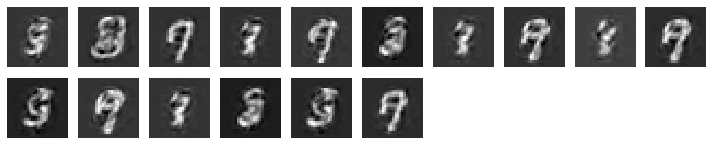

results after iter  28400  loss =  [7.1552033, 3.8768477, 0.32588905]  support =  784.0


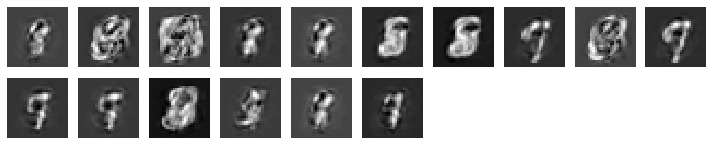

results after iter  28500  loss =  [8.849204, 5.5888224, 0.3245326]  support =  784.0


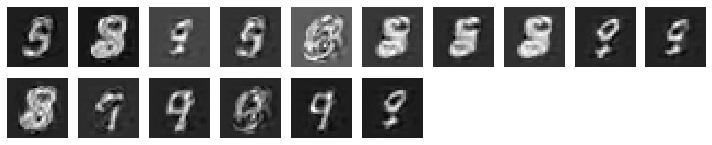

results after iter  28600  loss =  [8.1277895, 4.755597, 0.3361178]  support =  784.0


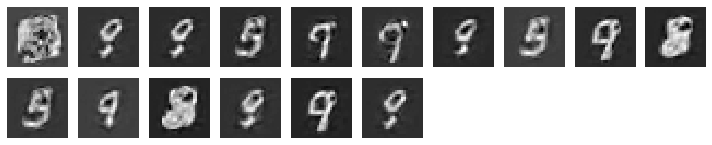

results after iter  28700  loss =  [7.6405077, 4.247877, 0.337588]  support =  784.0


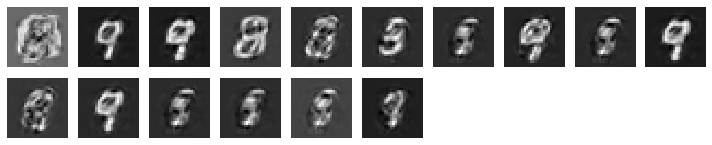

results after iter  28800  loss =  [6.2425404, 3.0541587, 0.31758416]  support =  784.0


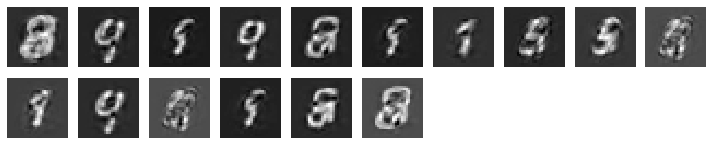

results after iter  28900  loss =  [8.067659, 4.7729335, 0.32760966]  support =  784.0


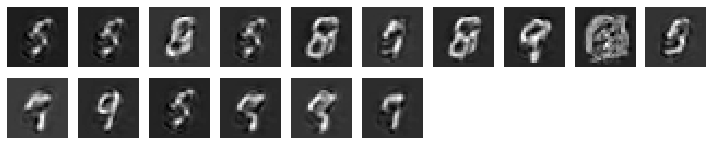

results after iter  29000  loss =  [8.058628, 4.675459, 0.3369591]  support =  784.0


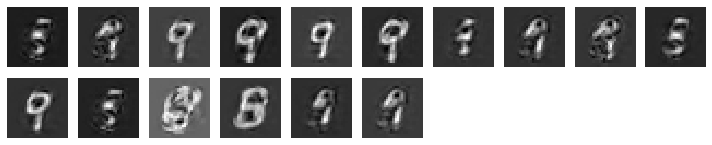

results after iter  29100  loss =  [7.939591, 4.505904, 0.3418076]  support =  784.0


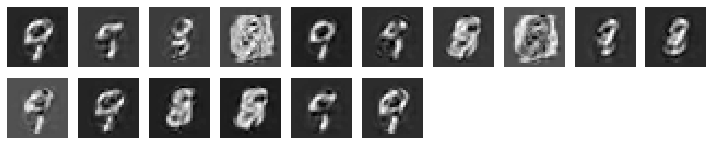

results after iter  29200  loss =  [7.1537323, 3.4954693, 0.36412632]  support =  784.0


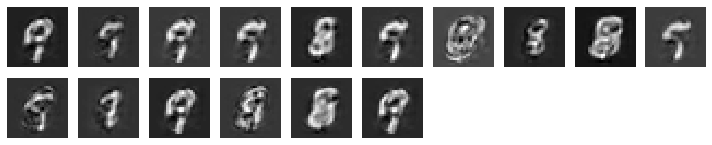

results after iter  29300  loss =  [7.606654, 4.188271, 0.34024036]  support =  784.0


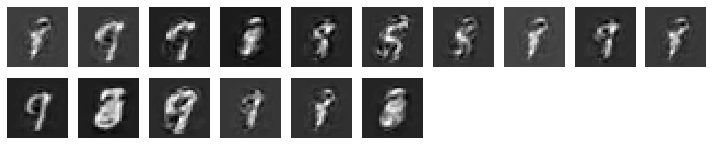

results after iter  29400  loss =  [8.336415, 4.9648757, 0.33604997]  support =  784.0


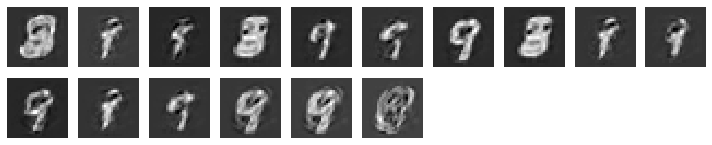

results after iter  29500  loss =  [6.62241, 3.2387335, 0.3366037]  support =  784.0


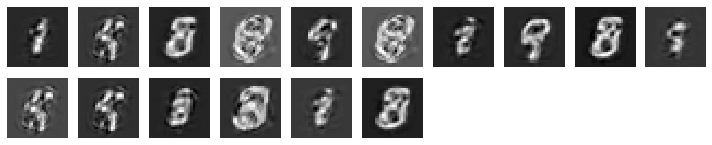

results after iter  29600  loss =  [7.721076, 4.3563647, 0.33528572]  support =  784.0


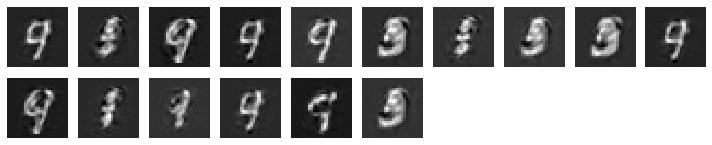

results after iter  29700  loss =  [5.2938395, 1.8962917, 0.33749247]  support =  784.0


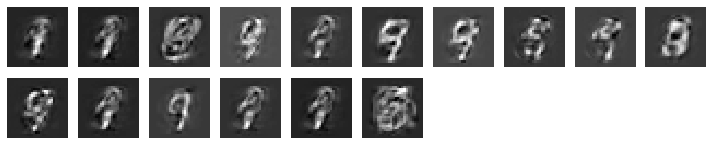

results after iter  29800  loss =  [8.268673, 4.7966013, 0.34528556]  support =  784.0


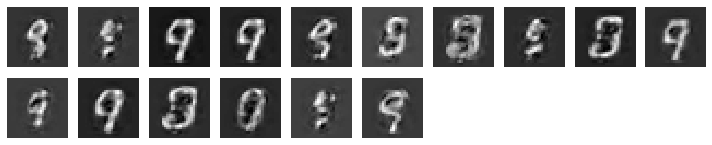

results after iter  29900  loss =  [8.313436, 4.8372545, 0.3460067]  support =  784.0


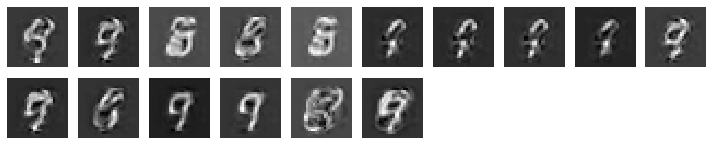

Epoch: 7 	 Discriminator Loss_fake: 0.3460558354854584 	 Discriminator Loss_real: 0.01640663854777813		 Generator Loss: [7.919718, 4.481443, 0.34219614] 		 Reconstructor Loss:0.9493041038513184	 support: 0


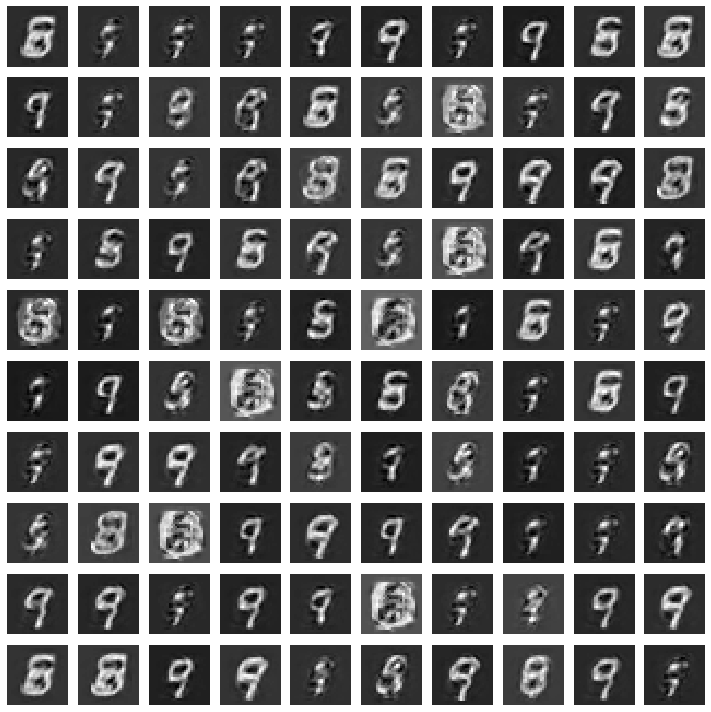

results after iter  30000  loss =  [8.229583, 4.9451265, 0.32682434]  support =  784.0


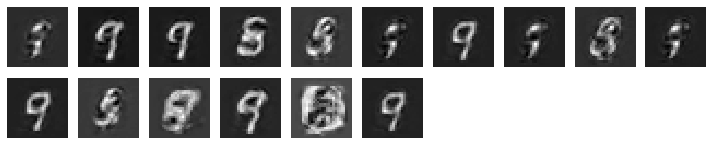

results after iter  30100  loss =  [7.4251556, 4.0434756, 0.3370366]  support =  784.0


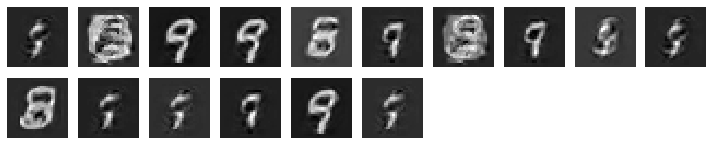

results after iter  30200  loss =  [7.3039775, 3.6952295, 0.35855114]  support =  784.0


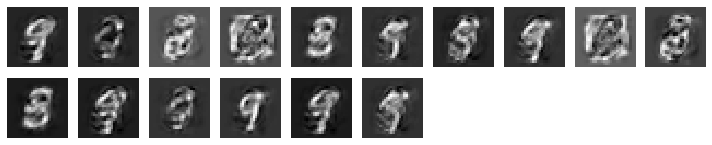

results after iter  30300  loss =  [5.9065194, 2.4351332, 0.34549093]  support =  784.0


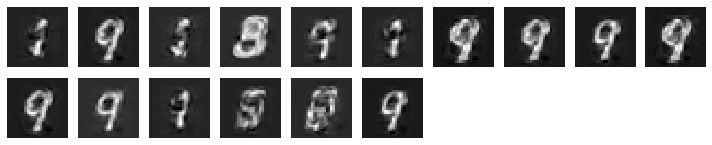

results after iter  30400  loss =  [9.2334, 5.7361135, 0.34807813]  support =  784.0


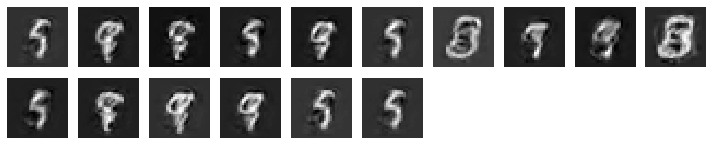

results after iter  30500  loss =  [7.3818235, 3.9193556, 0.34501252]  support =  784.0


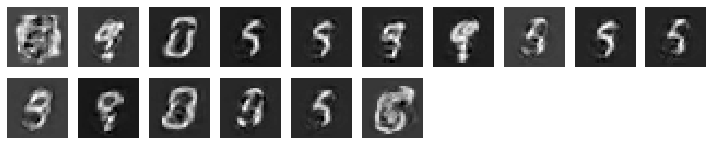

results after iter  30600  loss =  [7.2641544, 3.9015396, 0.33427227]  support =  784.0


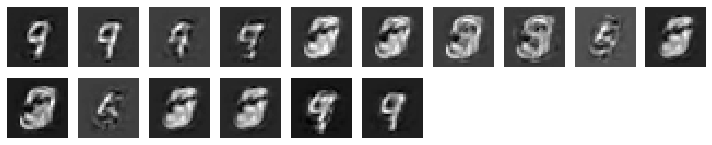

results after iter  30700  loss =  [7.584242, 4.202262, 0.33683145]  support =  784.0


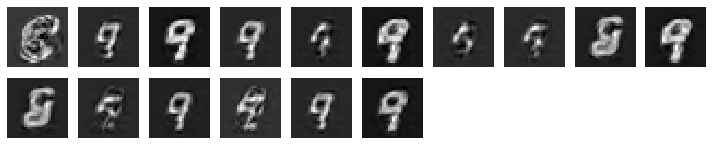

results after iter  30800  loss =  [7.6060038, 4.1761026, 0.34098694]  support =  784.0


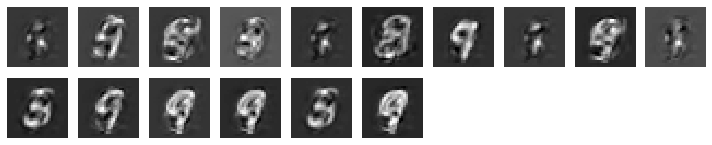

results after iter  30900  loss =  [10.537507, 6.7974052, 0.37258115]  support =  784.0


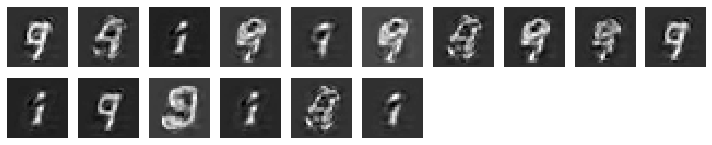

results after iter  31000  loss =  [7.841892, 4.4021225, 0.34229967]  support =  784.0


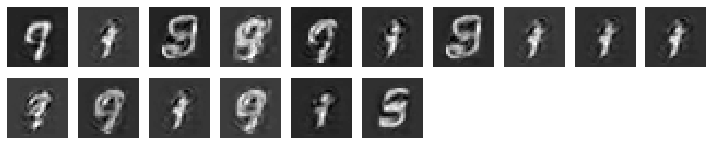

results after iter  31100  loss =  [6.6266513, 3.3015304, 0.33077276]  support =  784.0


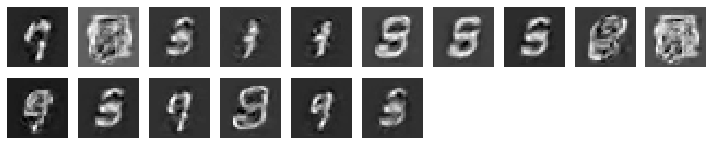

results after iter  31200  loss =  [8.831306, 5.3779287, 0.34410587]  support =  784.0


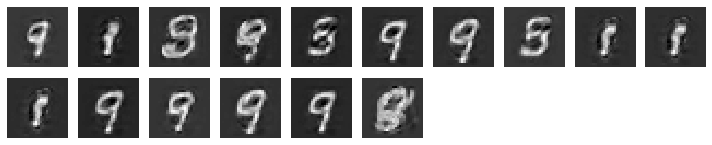

results after iter  31300  loss =  [7.3682904, 4.1017323, 0.32563072]  support =  784.0


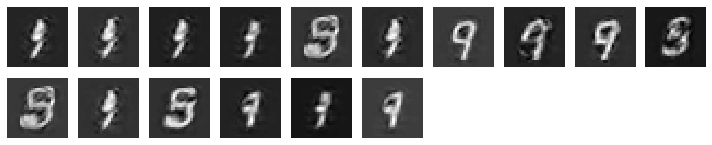

results after iter  31400  loss =  [6.9257607, 3.383795, 0.3521345]  support =  784.0


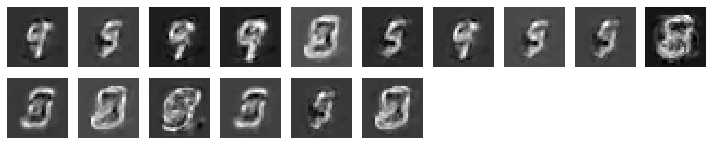

results after iter  31500  loss =  [7.422535, 3.894754, 0.35117412]  support =  784.0


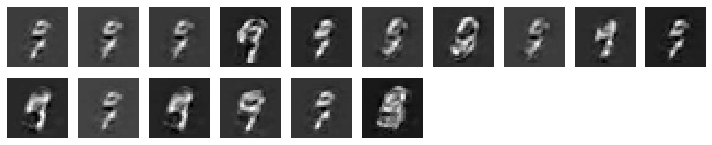

results after iter  31600  loss =  [6.123651, 2.5213408, 0.35793656]  support =  784.0


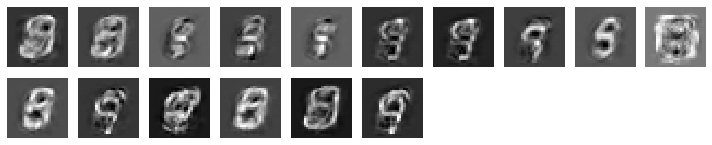

results after iter  31700  loss =  [6.6030726, 2.9689882, 0.36127973]  support =  784.0


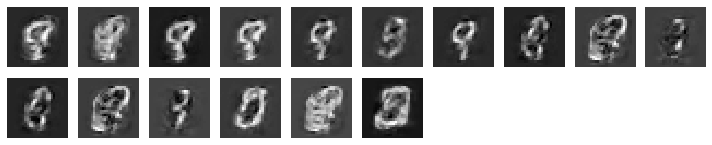

results after iter  31800  loss =  [7.8367805, 4.319242, 0.3501531]  support =  784.0


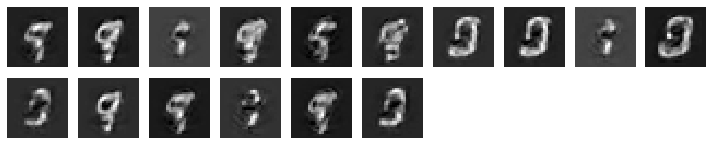

results after iter  31900  loss =  [6.9059935, 3.487669, 0.3406581]  support =  784.0


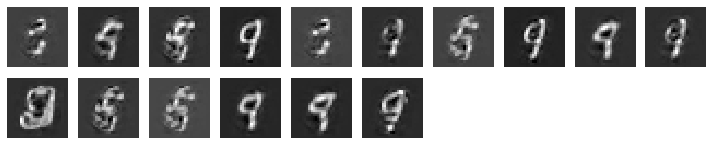

results after iter  32000  loss =  [8.685709, 5.1629133, 0.35061428]  support =  784.0


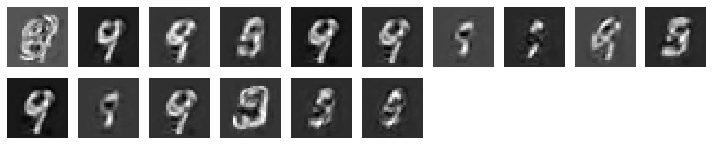

results after iter  32100  loss =  [4.7747536, 1.3953409, 0.3361928]  support =  784.0


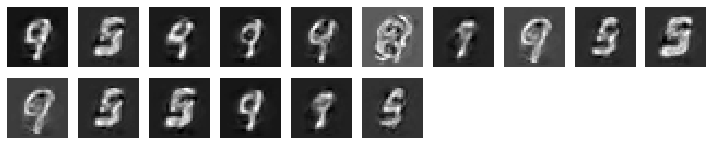

results after iter  32200  loss =  [8.754381, 5.1205482, 0.36201856]  support =  784.0


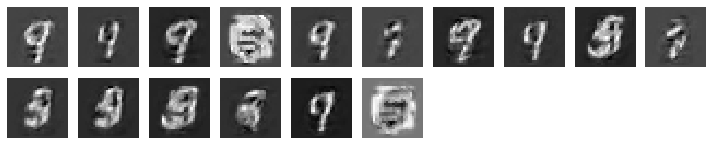

results after iter  32300  loss =  [8.074567, 4.4299226, 0.36222708]  support =  784.0


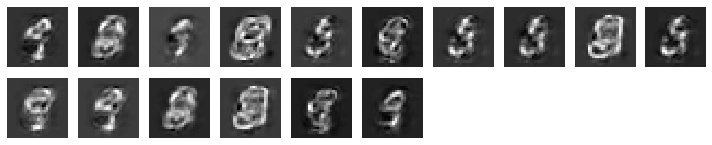

results after iter  32400  loss =  [10.040709, 6.22925, 0.37956882]  support =  784.0


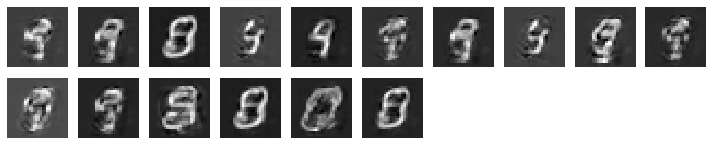

results after iter  32500  loss =  [7.140405, 3.6276999, 0.34936178]  support =  784.0


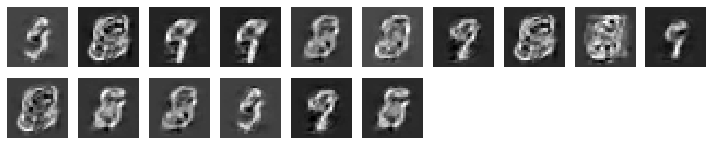

results after iter  32600  loss =  [8.392731, 4.69742, 0.36785334]  support =  784.0


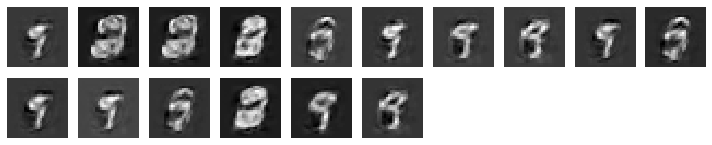

results after iter  32700  loss =  [8.567601, 4.9821415, 0.35701796]  support =  784.0


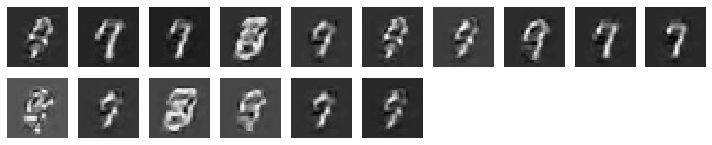

results after iter  32800  loss =  [10.836393, 7.1380024, 0.36868837]  support =  784.0


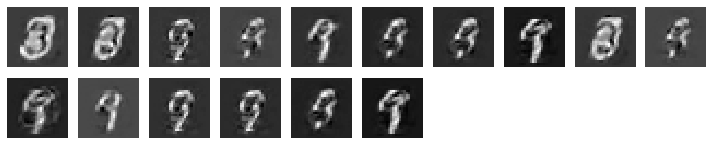

results after iter  32900  loss =  [7.1104503, 3.6200874, 0.34695053]  support =  784.0


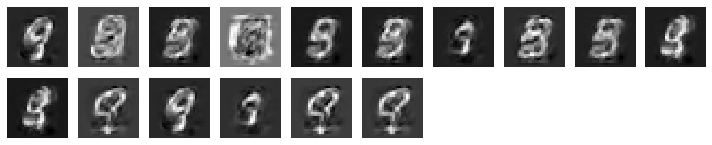

results after iter  33000  loss =  [8.008969, 4.386753, 0.3607058]  support =  784.0


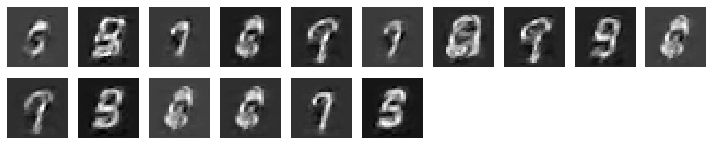

results after iter  33100  loss =  [9.606143, 5.840907, 0.37510896]  support =  784.0


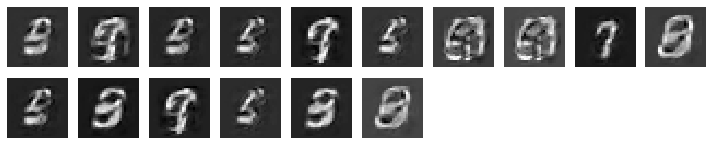

results after iter  33200  loss =  [9.099525, 5.6465063, 0.3440131]  support =  784.0


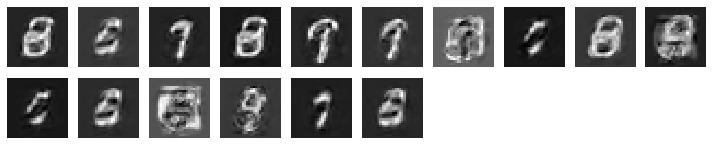

results after iter  33300  loss =  [6.6716576, 3.0363023, 0.36158973]  support =  784.0


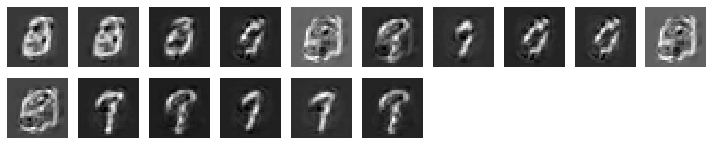

results after iter  33400  loss =  [8.37995, 5.095184, 0.32714528]  support =  784.0


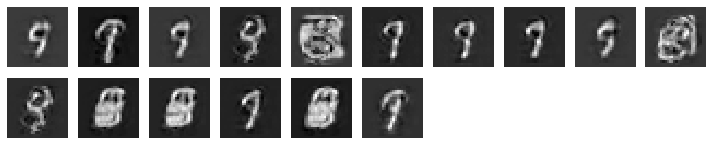

results after iter  33500  loss =  [6.196762, 2.6689594, 0.350898]  support =  784.0


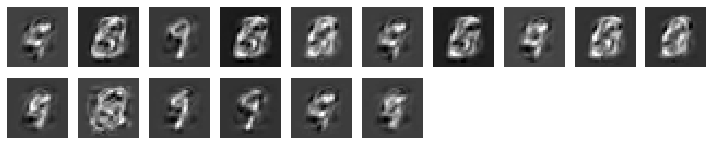

results after iter  33600  loss =  [8.639445, 4.893801, 0.37291533]  support =  784.0


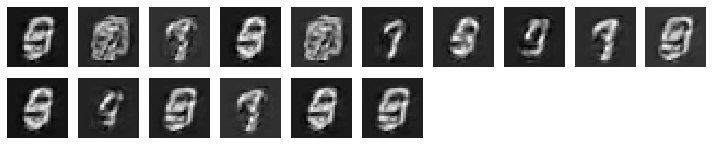

results after iter  33700  loss =  [8.244939, 4.699746, 0.35308346]  support =  784.0


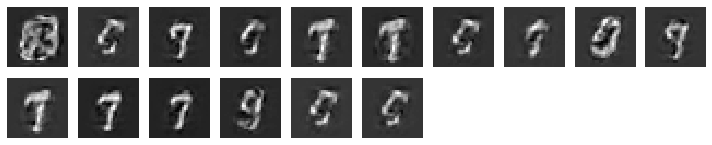

Epoch: 8 	 Discriminator Loss_fake: 0.352119117975235 	 Discriminator Loss_real: 0.012035481631755829		 Generator Loss: [6.363291, 2.8918538, 0.34595054] 		 Reconstructor Loss:1.0170224905014038	 support: 0


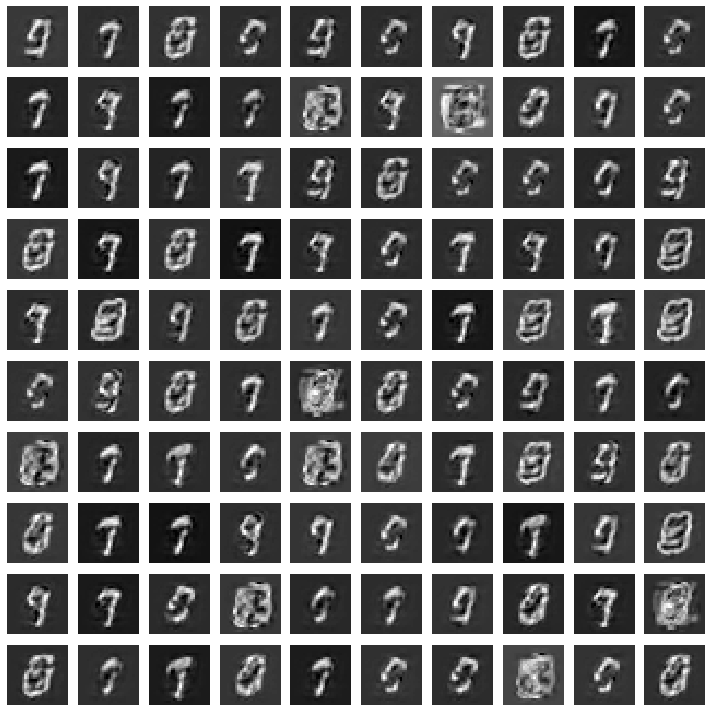

results after iter  33800  loss =  [8.088256, 4.127147, 0.39436167]  support =  784.0


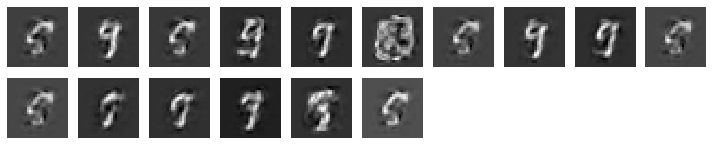

results after iter  33900  loss =  [8.781402, 5.210849, 0.35553432]  support =  784.0


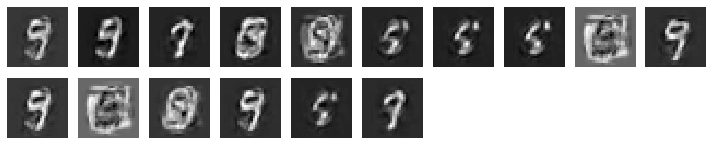

results after iter  34000  loss =  [8.053248, 4.4510183, 0.35844555]  support =  784.0


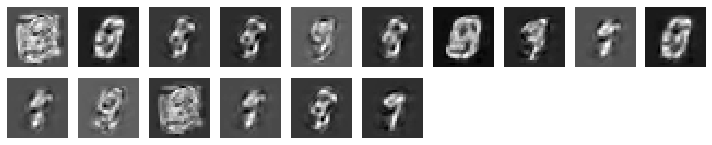

results after iter  34100  loss =  [8.274341, 4.815137, 0.34455022]  support =  784.0


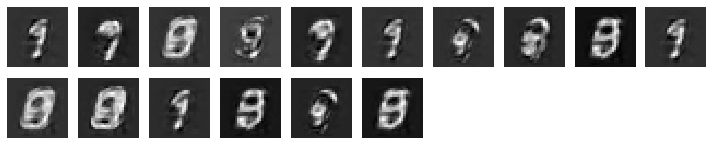

results after iter  34200  loss =  [8.0902195, 4.5687485, 0.3506709]  support =  784.0


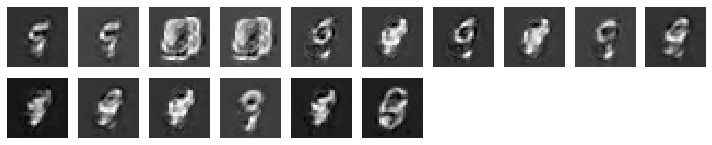

results after iter  34300  loss =  [8.087131, 4.6489515, 0.3420028]  support =  784.0


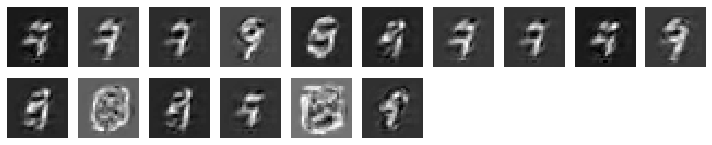

results after iter  34400  loss =  [8.1407995, 4.564609, 0.3563712]  support =  784.0


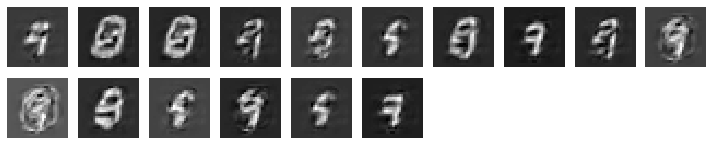

results after iter  34500  loss =  [6.7208323, 3.1708715, 0.35323626]  support =  784.0


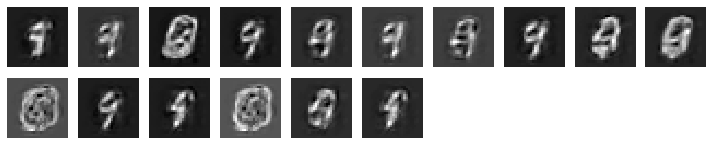

results after iter  34600  loss =  [7.9181232, 4.434956, 0.3470518]  support =  784.0


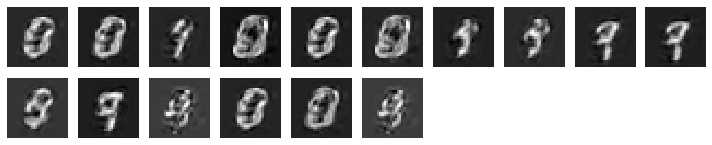

results after iter  34700  loss =  [5.513551, 1.9968636, 0.35003245]  support =  784.0


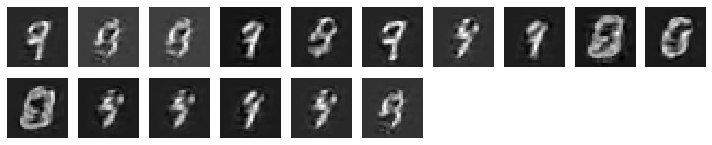

results after iter  34800  loss =  [8.988063, 5.1053843, 0.38661876]  support =  784.0


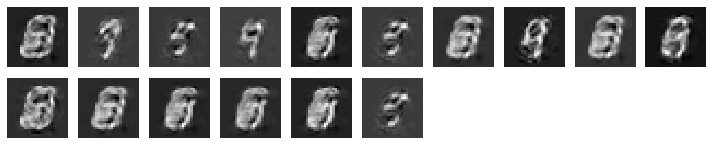

results after iter  34900  loss =  [7.171262, 3.5583336, 0.3594756]  support =  784.0


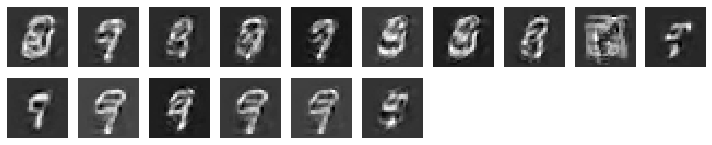

results after iter  35000  loss =  [8.071084, 4.5645013, 0.34835464]  support =  784.0


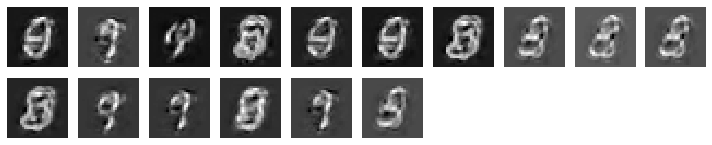

results after iter  35100  loss =  [8.562707, 5.1755157, 0.33718348]  support =  784.0


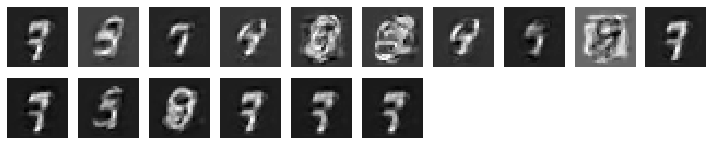

results after iter  35200  loss =  [9.589385, 6.204624, 0.3373369]  support =  784.0


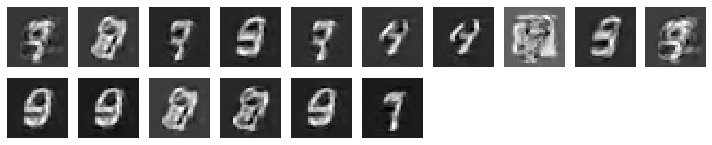

results after iter  35300  loss =  [6.5791564, 2.8577847, 0.37021744]  support =  784.0


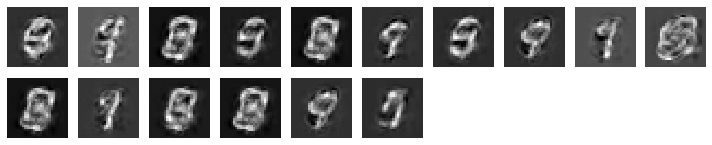

results after iter  35400  loss =  [7.6016397, 4.0427322, 0.35427517]  support =  784.0


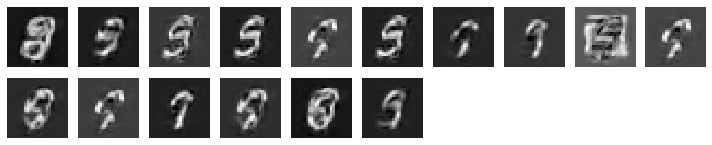

results after iter  35500  loss =  [7.37967, 3.9947782, 0.3374142]  support =  784.0


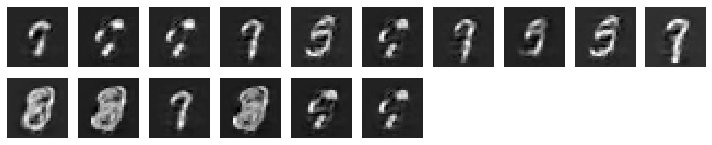

results after iter  35600  loss =  [8.599143, 4.9806786, 0.36019626]  support =  784.0


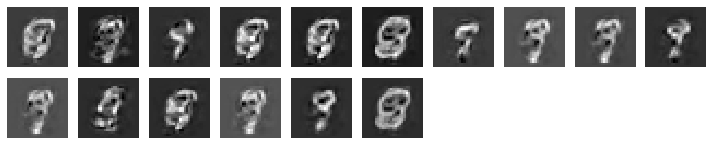

results after iter  35700  loss =  [6.9567347, 3.3568754, 0.35789075]  support =  784.0


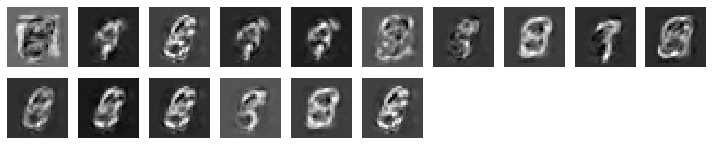

results after iter  35800  loss =  [9.773638, 6.0900965, 0.36689085]  support =  784.0


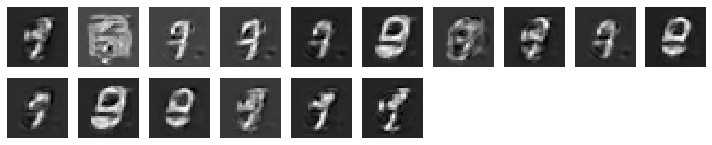

results after iter  35900  loss =  [8.469067, 4.842379, 0.36137372]  support =  784.0


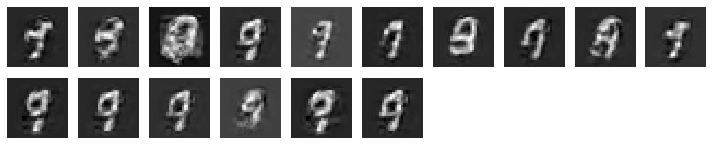

results after iter  36000  loss =  [9.077055, 5.7111506, 0.33542717]  support =  784.0


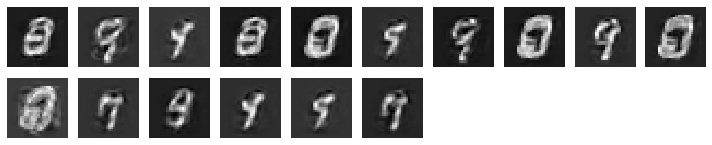

results after iter  36100  loss =  [6.5691123, 3.1932511, 0.33534515]  support =  784.0


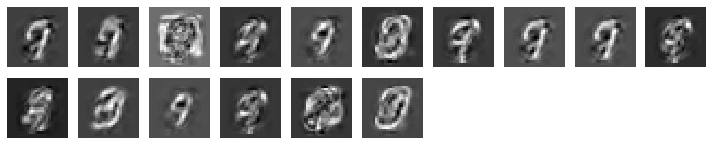

results after iter  36200  loss =  [6.917745, 3.5354185, 0.33666068]  support =  784.0


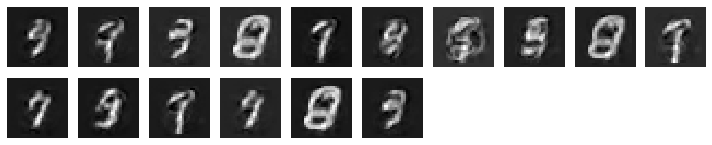

results after iter  36300  loss =  [6.5528417, 2.9312806, 0.36043844]  support =  784.0


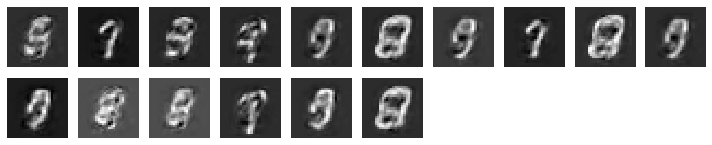

results after iter  36400  loss =  [8.739014, 5.4145813, 0.33127052]  support =  784.0


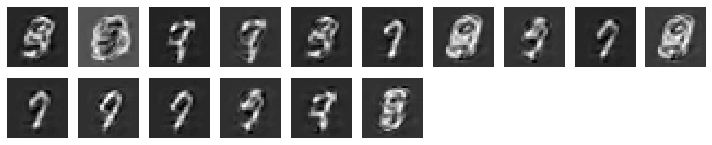

results after iter  36500  loss =  [7.8481054, 4.4565463, 0.33716863]  support =  784.0


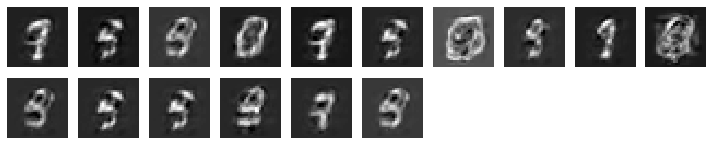

results after iter  36600  loss =  [8.263419, 4.944725, 0.3305991]  support =  784.0


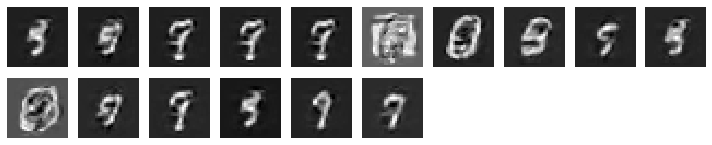

results after iter  36700  loss =  [8.365719, 5.0528693, 0.32969183]  support =  784.0


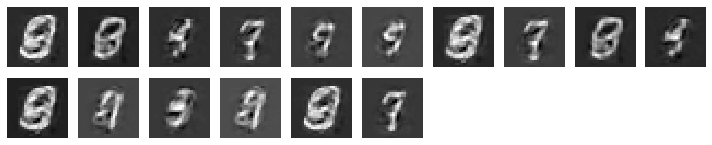

results after iter  36800  loss =  [8.659862, 5.3087473, 0.33370513]  support =  784.0


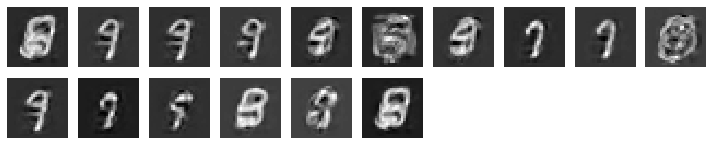

results after iter  36900  loss =  [5.521674, 2.1805925, 0.332852]  support =  784.0


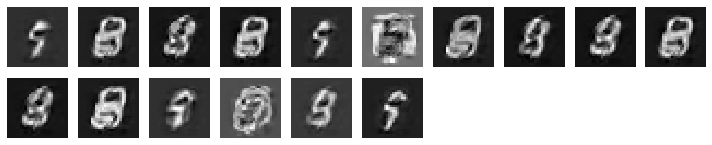

results after iter  37000  loss =  [7.92351, 4.509203, 0.33971107]  support =  784.0


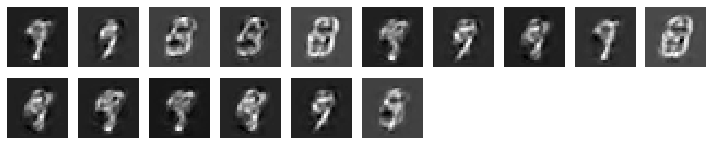

results after iter  37100  loss =  [7.811984, 4.378689, 0.34203833]  support =  784.0


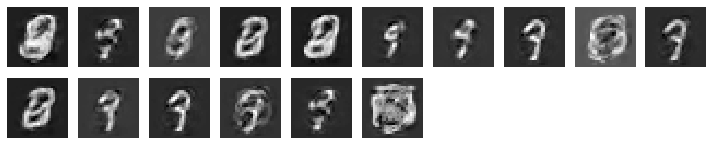

results after iter  37200  loss =  [6.8539824, 3.373746, 0.34639096]  support =  784.0


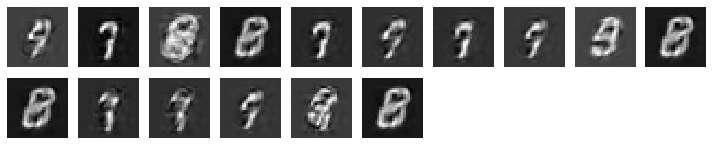

results after iter  37300  loss =  [6.241624, 2.669213, 0.35572368]  support =  784.0


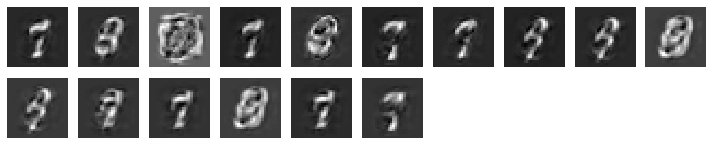

results after iter  37400  loss =  [11.823793, 7.967665, 0.3845235]  support =  784.0


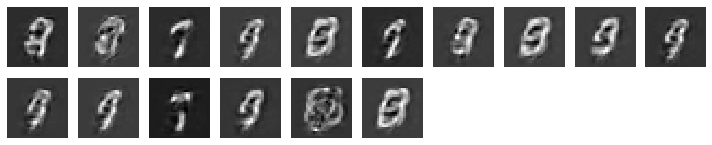

Epoch: 9 	 Discriminator Loss_fake: 0.36825042963027954 	 Discriminator Loss_real: 0.023951411247253418		 Generator Loss: [6.2878013, 2.6628978, 0.36059493] 		 Reconstructor Loss:0.9696882963180542	 support: 0


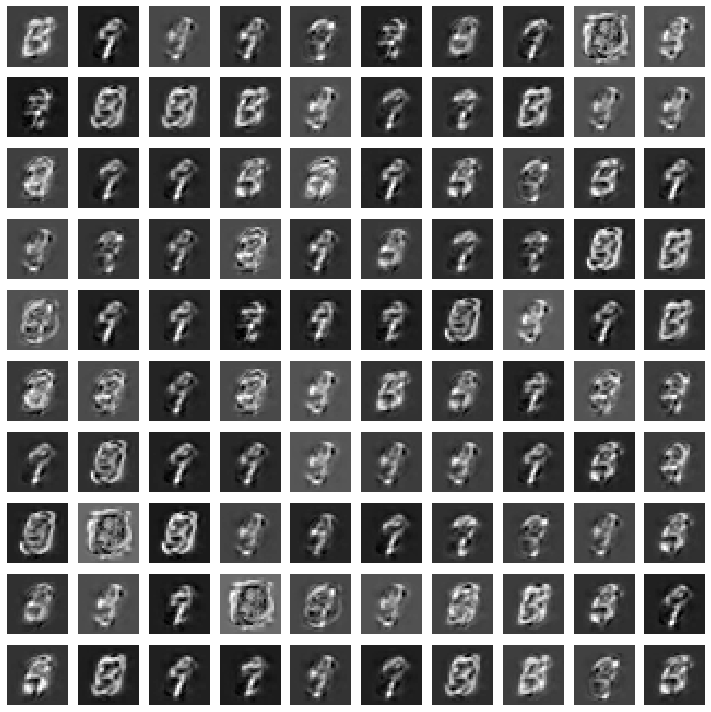

In [0]:
import matplotlib.pyplot as plt

n_d = 5 # 1 10 100
n_g = 10  # 1 10 100
n_r = 5  # 1 10 100

def count_support(sparse_mat):
  return (np.count_nonzero(sparse_mat))/batch_size

num_runs_percentage = int((epochs * steps_per_epoch)/100)

def show_images(noise):
    generated_images = generator.predict(noise)
    generated_images = np.matmul(dictionary_loaded2,np.transpose(generated_images))
    generated_images = np.transpose(generated_images)
    plt.figure(figsize=(10, 10))
    
    for i, image in enumerate(generated_images):
        plt.subplot(10, 10, i+1)
        if channels == 1:
            plt.imshow(image.reshape((img_rows, img_cols)), cmap='gray')
        else:
            plt.imshow(image.reshape((img_rows, img_cols, channels)))
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()


g_loss = 0
support= 0
train_amount = 10


for epoch in range(10):  #epochs
    for iter in range(int(steps_per_epoch)):
      i = iter + int(epoch*(steps_per_epoch))
    # train D
      for batch in range(n_d):  #steps_per_epoch
          noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
          fake_x = generator.predict(noise) # create G(z)
          # fake is (batch_size,sparse_dim)
          
          fake_x = np.transpose(fake_x)
          # multiply by dict
          fake_x = np.matmul(dictionary_loaded2,fake_x)

          fake_x = np.transpose(fake_x)
          fake_x = fake_x.reshape(batch_size,img_rows,img_cols,channels)
          # fake_x is of size (batch,rows,cols,channels)

          real_x = x_train[np.random.randint(0, x_train.shape[0], size=batch_size)] # sample real image
          #remove below to return to FC scheme
          real_x = real_x.reshape(fake_x.shape)

          x = np.concatenate((real_x, fake_x))
          # x is of size (2*batch,rows,cols,channels)
          
          disc_y = np.zeros(2*batch_size)
          disc_y[:batch_size] = 0.9

          # train_on_batch recieves data and desired output
          d_loss_fake = discriminator.train_on_batch(x[:batch_size], disc_y[:batch_size])
          d_loss_real = discriminator.train_on_batch(x[batch_size:], disc_y[batch_size:])
      
      # train G
      for batch in range(n_g):  #steps_per_epoch
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
        # train GAN (descriminator weights are fixed)
        y_gen_1 = np.ones(batch_size)
        y_gen_2 = np.zeros(batch_size * sparse_dim)
        y_gen_2 = y_gen_2.reshape(batch_size,sparse_dim)
        # TODO train the two outputs
        g_loss = gan.train_on_batch(noise, [y_gen_1,y_gen_2])
            
      # train R
      for batch in range(n_r):  #steps_per_epoch
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
        r_loss = vae.train_on_batch(noise[:batch_size],noise[:batch_size])
      if(i%100==0):
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
        print("results after iter ",i," loss = ",g_loss," support = " ,count_support(generator.predict(noise)))
        show_images(noise)

    print(f'Epoch: {epoch} \t Discriminator Loss_fake: {d_loss_fake} \t Discriminator Loss_real: {d_loss_real}\t\t Generator Loss: {g_loss} \t\t Reconstructor Loss:{r_loss}\t support: {support}')
    noise = np.random.normal(0, 1, size=(100, noise_dim))
    show_images(noise)





